In [1]:
import numpy as np
from pylab import gca
import numpy as np
import math
from tqdm import tqdm
import torch
import torchvision
from datasets.dataset import SimulationXZDataset
import time 
import time 
import torch.nn as nn
from torch.utils import data
import torch.nn.functional as F
from torchvision import transforms
from torchvision.utils import save_image
from torchvision.datasets import MNIST
import torchvision.transforms.functional as TF
from torch.optim import lr_scheduler
import time
import os

from skimage.metrics import structural_similarity as ssim_id
import numpy as np
import cv2
import os
from torchvision import transforms
from torch.utils.data import DataLoader
from pathlib import Path
from torch.utils.data import Dataset
import pdb
from PIL import Image
import matplotlib.pyplot as plt 
# from datasets.dataset import TemperatureXZDataset
from runners.train_diffusion import forwardpass
from analysis_functions import predict_lrenc, predict_mobilenet, plot_images, get_profile, load_mobilenet, load_encoder, load_diffusion, PSNR, SSIM, predict_modified_diffusion

In [2]:
def frame_tick(frame_width = 2, tick_width = 1.5):
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(frame_width)
    plt.tick_params(direction = 'in', 
                    width = tick_width)
def legend(location = 'best', fontsize = 8):
        plt.legend(loc = location, fontsize = fontsize, frameon = False)

In [3]:

device = 'cuda'


def compute_alpha(beta, t):
    beta = torch.cat([torch.zeros(1).to(beta.device), beta], dim=0).to(device)
    # print(beta.device, t.device)
    a = (1 - beta).cumprod(dim=0).index_select(0, t + 1).view(-1, 1, 1, 1)
    return a



def predict_modified_ddim_diffusion(model, lr_enc, res, hr, lr, upscaled_lr, encoding, dataset, seq, timesteps = 200, skip = 1, schedule = 'linear', **kwargs):
    
    # skip =timesteps // self.args.timesteps
    seq = range(0, timesteps, skip)
    
    def cosine_beta_schedule(timesteps, s=0.008):

        steps = timesteps + 1
        x = torch.linspace(0, timesteps, steps)
        alphas_cumprod = torch.cos(
            ((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
        alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
        betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
        return torch.clip(betas, 0.0001, 0.9999)

    def linear_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start, beta_end, timesteps)


    def quadratic_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

    def sigmoid_beta_schedule(timesteps):
        beta_start = 0.0001
        beta_end = 0.02
        betas = torch.linspace(-6, 6, timesteps)
        return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start
    if schedule == 'linear':
        betas = linear_beta_schedule(timesteps=timesteps)
    elif schedule == 'quadratic':
        betas = quadratic_beta_schedule(timesteps=timesteps)
    elif schedule == 'cosine':
        betas = cosine_beta_schedule(timesteps=timesteps)
    elif schedule == 'sigmoid':
        betas = sigmoid_beta_schedule(timesteps=timesteps)
    b = betas

    if len(lr.shape) < 4:
        img = (lr.view(lr.shape[0], 1, lr.shape[1], lr.shape[2]).to(device))
        target = (hr.view(hr.shape[0], 1, hr.shape[1], hr.shape[2]).to(device))
    else:
        img = lr.to(device)
        target = hr.to(device)
    if encoding:
            # x_e = forwardpass(lr_enc, lr.to(device).float(), factor = train_dataset.factor)
        if len(lr.shape)< 4:
            x_e = forwardpass(lr_enc, lr.view(lr.shape[0],1, lr.shape[1], lr.shape[2]).to(device).float())
        else:
            x_e = forwardpass(lr_enc, lr.to(device).float())
    else:
        x_e = upscaled_lr.to(device).float().repeat(1,1,1, 1)
    shape=hr.shape
    with torch.no_grad():
        x = torch.randn(shape, device=device)
        n = x.size(0)
        seq_next = [-1] + list(seq[:-1])
        x0_preds = []
        xs = [x]
        for i, j in zip(reversed(seq), reversed(seq_next)):
            t = (torch.ones(n) * i).to(x.device)
            next_t = (torch.ones(n) * j).to(x.device)
            at = compute_alpha(b, t.long())
            at_next = compute_alpha(b, next_t.long())
            xt = xs[-1].to('cuda')
            et = model(xt, t, x_e)
            x0_t = (xt - et * (1 - at).sqrt()) / at.sqrt()
            x0_preds.append(x0_t.to('cpu'))
            c1 = (
                kwargs.get("eta", 0) * ((1 - at / at_next) * (1 - at_next) / (1 - at)).sqrt()
            )
            c2 = ((1 - at_next) - c1 ** 2).sqrt()
            xt_next = at_next.sqrt() * x0_t + c1 * torch.randn_like(x) + c2 * et
            xs.append(xt_next.to('cpu'))
    result = dataset.unscale_data(xs[-1], input_type = 'hr') 
    return dataset.unscale_data(lr, input_type='lr'), result, dataset.unscale_data(target.cpu(), input_type = 'hr'), xs, b





In [4]:
class Simulation():
    def __init__(self, folder, diff_steps, schedule):
        self.folder = folder
        self.diff_steps = diff_steps
        self.schedule = schedule
        self.kp = None
        self.profile = None
        self.max_depth = None
        self.kp_depth = None
    def get_loss_curve(self):
        test_loss = np.loadtxt(os.path.join(self.folder, 'validation_loss_epoch.txt'))
        train_loss = np.loadtxt(os.path.join(self.folder, 'loss_epoch.txt'))
        return train_loss, test_loss


In [5]:
diffusion_results_dir = '/home/oogoke/DiffusionSR/runs/direct/diffusionimplicitencoded/2023_02_26_02_05_27/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/diffusionexplicitencoded/2023_02_15_11_20_16/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/diffusionexplicitencoded/2023_02_15_11_20_16/standardize/n_steps_1'
encoder_results_dir = '/home/oogoke/DiffusionSR/runs/direct/encoder/2023_02_26_02_05_27/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/encoder/2023_02_14_20_37_48/standardize/n_steps_1'#'/home/oogoke/DiffusionSR/runs/direct/encoder/2023_02_14_20_37_48/standardize/n_steps_1'
timesteps = 1000
conditioning = 'implicit'
encoding = 'True'
schedule = 'linear'
device= 'cuda'
encode_bool = encoding == 'True'

os.environ['CUDA_VISIBLE_DEVICES']  = "0"
batch_size = 1
downscale_method = 'direct'
analysis_folder = f'analyzed_figures_paper_3_20/{timesteps}_{conditioning}_{schedule}_{downscale_method}'
os.makedirs( analysis_folder, exist_ok = True)

data_folder = '/home/oogoke/DiffusionSR/datasets/simulation_basis_v3_laser_velocity_xz_cross_section_data'#'/home/oogoke/DiffusionSR/datasets/update_v2_laser_velocity_xz_cross_section_data'#'/home/oogoke/DiffusionSR/datasets/simulation_basis_laser_velocity_xz_cross_section_data'
train_dataset = SimulationXZDataset(downscale_method = 'direct', split = 'train', root_folder = data_folder , return_info = True)
test_dataset = SimulationXZDataset(downscale_method ='direct', split = 'test', root_folder = data_folder, return_info = True)
dev_dataset = SimulationXZDataset(downscale_method = 'direct', split = 'dev', root_folder = data_folder, return_info = True)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, drop_last=True)
dev_dataloader = DataLoader(dev_dataset, batch_size=1, shuffle=False, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=True)


Using normalize method: ... standardize
Using all 1 fields
Processing dataset with 1 fields
Using normalize method: ... standardize
Using all 1 fields
Processing dataset with 1 fields
Using normalize method: ... standardize
Using all 1 fields
Processing dataset with 1 fields


In [6]:
from runners.train_diffusion import DiffusionModel

def initialize_diffusion(diff_dir, enc_dir, datasets, timesteps, conditioning, encoding, schedule, device):
    ''' 
    Parameters:
        diff_dir: (str) Diffusion results directory
        enc_dir: (str) Encoder results directory
        datasets: (tuple or list) The three dataset objects corresponding to the train/validation/test splits, in the order (train, validation, test).
        timesteps: (int) The number of timesteps used for the diffusion model during training
        conditioning: (boolean) If true, the diffusion model assumes the LR passes through an encoder before being used for conditioning
        schedule: (str) Variance schedule used for training the diffusion model
        device: (str) 'cuda' for GPU, 'cpu' for CPU.
    Returns:
        diffusion_model: Custom DiffusionModel object that enables sampling with either DDIM or DDPM samplers.
    '''

    diffusion_model = DiffusionModel(results_folder=diff_dir,
                                    lr_encoder_folder=enc_dir,
                                    train_dataset=datasets[0],
                                    dev_dataset=datasets[1],
                                    test_dataset=datasets[2],
                                    timesteps=timesteps,
                                    conditioning=conditioning,
                                    encoding=encoding,
                                    schedule=schedule,
                                    device=device,enc_output = False
                                    )
    diffusion_model.load_saved_model()
    return diffusion_model

diff_model = initialize_diffusion(diff_dir=diffusion_results_dir,
                                  enc_dir=encoder_results_dir,
                                  datasets=[train_dataset,
                                            dev_dataset, test_dataset],
                                  timesteps=timesteps,
                                  conditioning=conditioning,
                                  encoding=encoding,
                                  schedule=schedule,
                                  device=device)


lr_enc = load_encoder(encoder_results_dir, dataset = train_dataset)


Loading encoder ... encoding = True
TIMESTEPS == 1000, Schedule = linear
Loading model from /home/oogoke/DiffusionSR/runs/direct/diffusionimplicitencoded/2023_02_26_02_05_27/standardize/n_steps_1
model found, loading


In [7]:
def predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dataset, skip = 50):

    '''
    Return the predictions for the Diffusion model given an input batch
    Parameters:
    diff_model: DiffusionModel object
    lr_enc: Torch network module object, representing the trained RRDN encoder model
    res: Torch tensor, Residual between HR and LR data
    hr: Torch tensor, High Resolution data
    lr: Torch tensor, Low Resolution data
    upscaled_lr: Torch tensor, Bicubic upscaled low resolution data
    dataset: Dataset object, used for rescaling data
    Returns:
    Low resolution data, scaled to original space, 4-D numpy array (batch, channels, height, width)
    Output (Super-resolution), scaled to original space, 4-D numpy array
    High resolution data, scaled to original space, 4-D numpy array 
    '''

    if len(lr.shape) < 4:
        img = (lr.view(lr.shape[0], 1, lr.shape[1], lr.shape[2]).to(device))
        target = (hr.view(hr.shape[0], 1, hr.shape[1], hr.shape[2]).to(device))
    else:
        img = lr.to(device)
        target = hr.to(device)
    if len(lr.shape) < 4:

        x_e = forwardpass(lr_enc, lr.view(lr.shape[0],1, lr.shape[1], lr.shape[2]).to(device).float(), factor = dataset.factor)
    else:
        x_e = forwardpass(lr_enc, lr.to(device).float(), factor = dataset.factor)
        x_e = forwardpass(lr_enc, lr.to(device).float())
        all_images = diff_model.batch_sample(dataset = train_dataset, batch = hr, x_e = x_e, sampler = 'DDIM', skip= skip)                
        result = dataset.unscale_data(all_images.cpu().numpy()[-1, 0], input_type = 'residual') + dataset.unscale_data(upscaled_lr.numpy(), input_type = 'upscaled_lr')
        
    return dataset.unscale_data(lr, input_type='lr'), result, dataset.unscale_data(target.cpu(), input_type = 'hr')
skip = 30
for batch_idx, (res, hr, lr, upscaled_lr, info) in enumerate(train_dataloader):            
    #input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, train_dataloader.dataset)
    input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,encoding = encode_bool,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
    break


 77%|███████▋  | 2273/2970 [11:39<03:31,  3.30it/s]

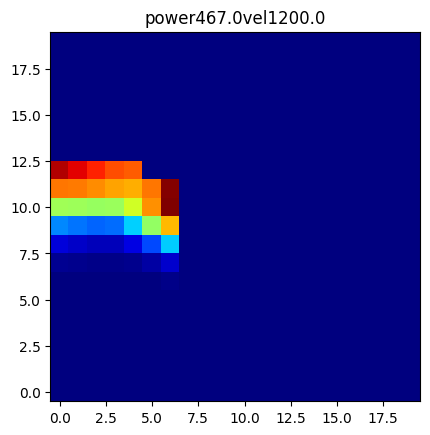

 77%|███████▋  | 2274/2970 [11:40<03:49,  3.04it/s]

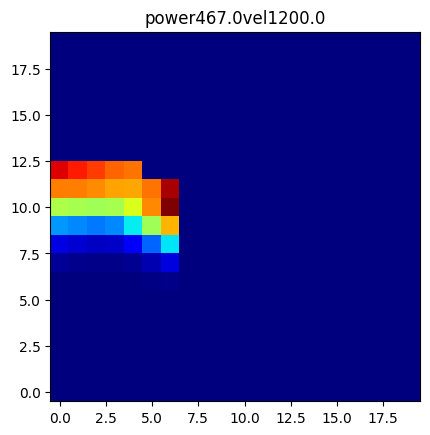

 77%|███████▋  | 2275/2970 [11:40<04:01,  2.88it/s]

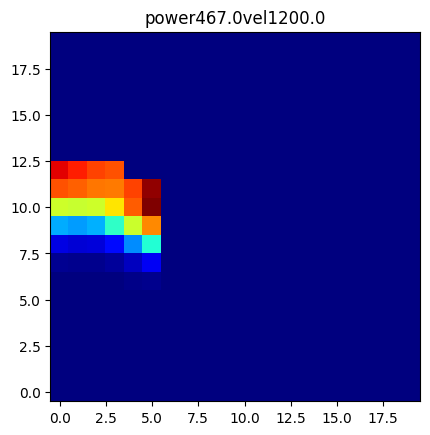

 77%|███████▋  | 2276/2970 [11:40<04:09,  2.78it/s]

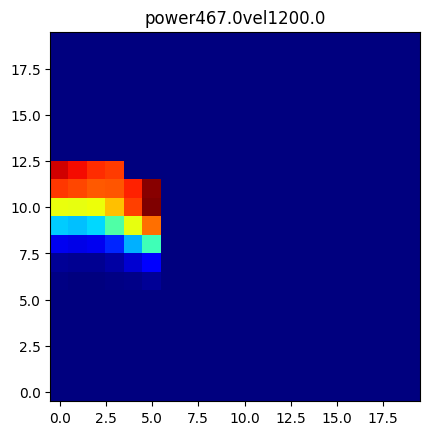

 90%|████████▉ | 2667/2970 [13:41<01:31,  3.30it/s]

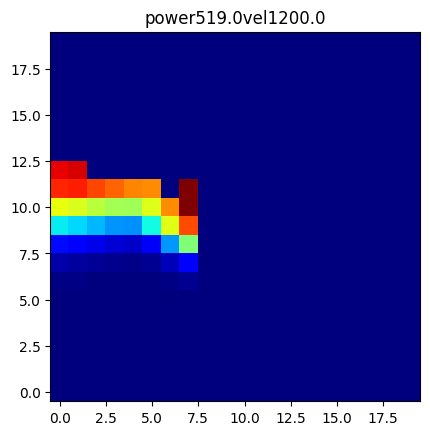

 90%|████████▉ | 2668/2970 [13:41<01:39,  3.04it/s]

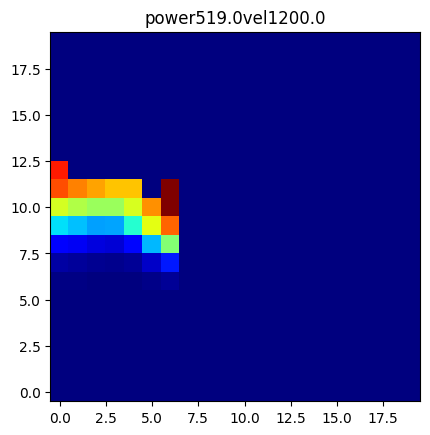

 90%|████████▉ | 2669/2970 [13:42<01:44,  2.88it/s]

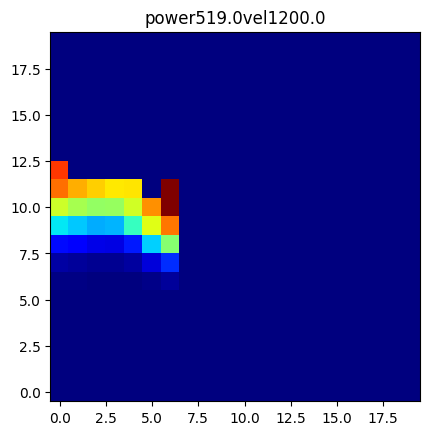

 90%|████████▉ | 2670/2970 [13:42<01:47,  2.78it/s]

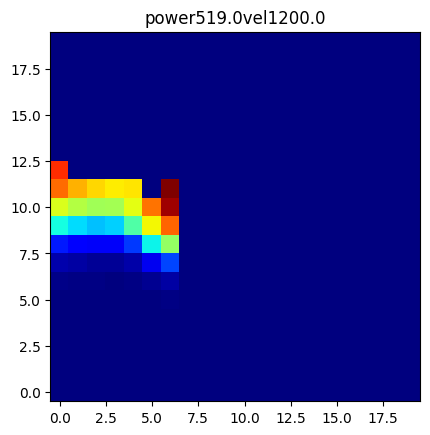

 90%|████████▉ | 2671/2970 [13:43<01:50,  2.71it/s]

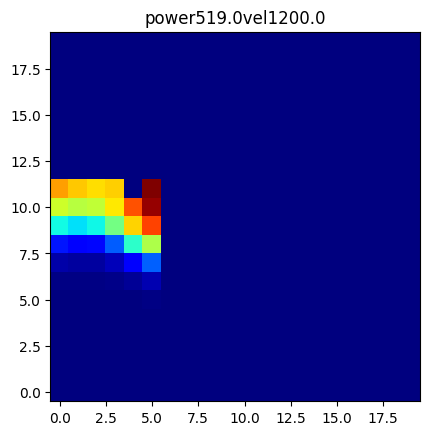

 90%|████████▉ | 2672/2970 [13:43<01:51,  2.67it/s]

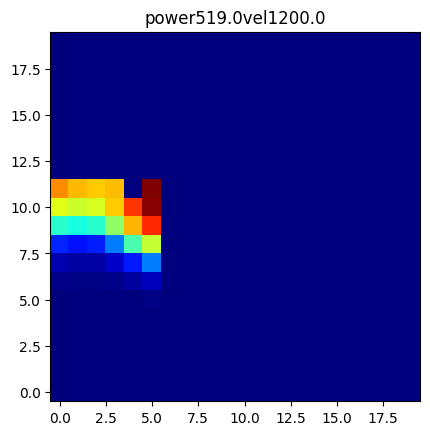

 77%|███████▋  | 2273/2970 [11:39<03:31,  3.29it/s]

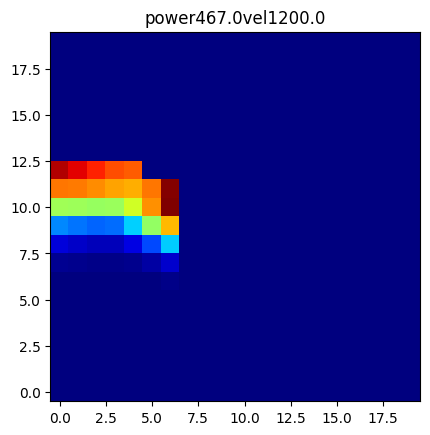

 77%|███████▋  | 2274/2970 [11:40<03:49,  3.03it/s]

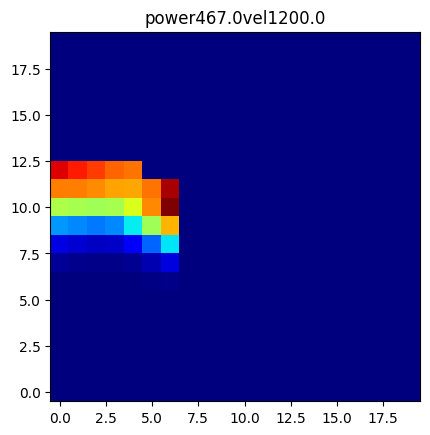

 77%|███████▋  | 2275/2970 [11:40<04:01,  2.87it/s]

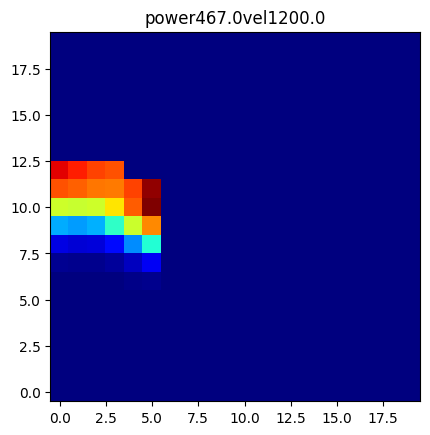

 77%|███████▋  | 2276/2970 [11:41<04:10,  2.77it/s]

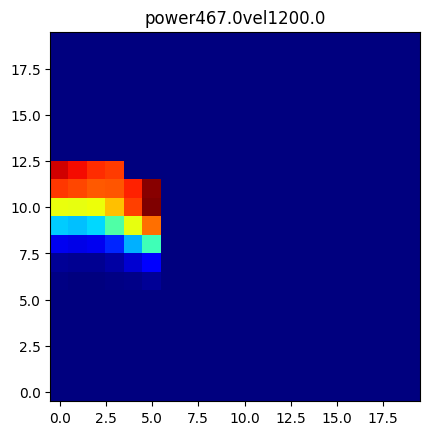

 90%|████████▉ | 2667/2970 [13:41<01:31,  3.30it/s]

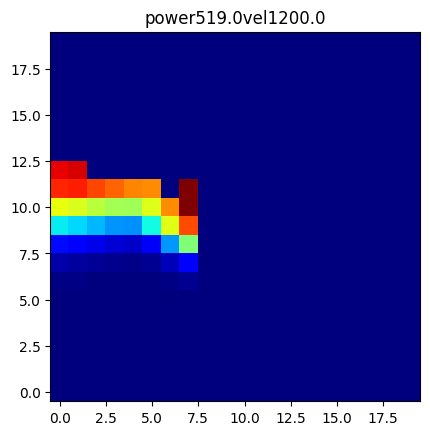

 90%|████████▉ | 2668/2970 [13:42<01:39,  3.04it/s]

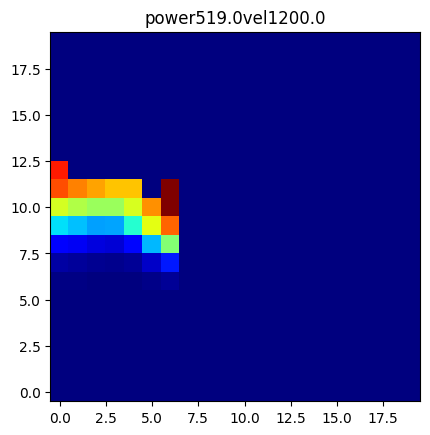

 90%|████████▉ | 2669/2970 [13:42<01:44,  2.88it/s]

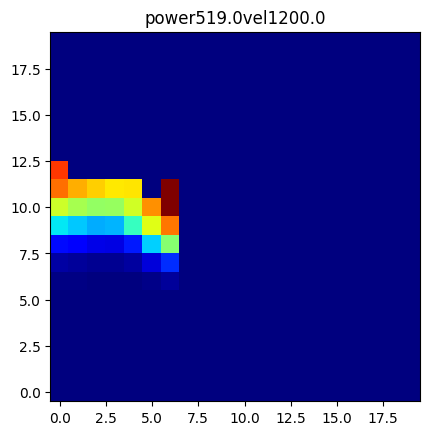

 90%|████████▉ | 2670/2970 [13:42<01:47,  2.78it/s]

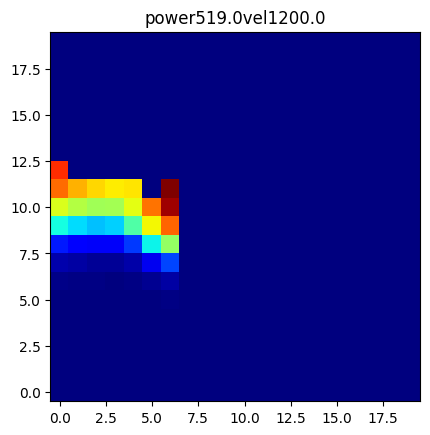

 90%|████████▉ | 2671/2970 [13:43<01:49,  2.72it/s]

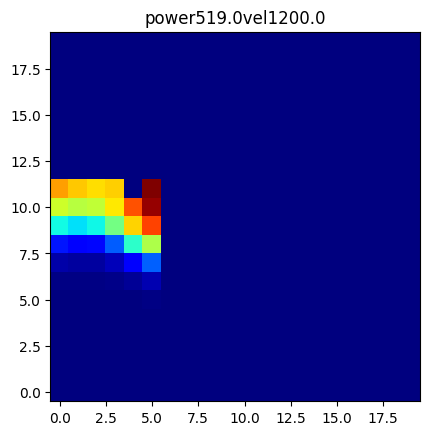

 90%|████████▉ | 2672/2970 [13:43<01:51,  2.68it/s]

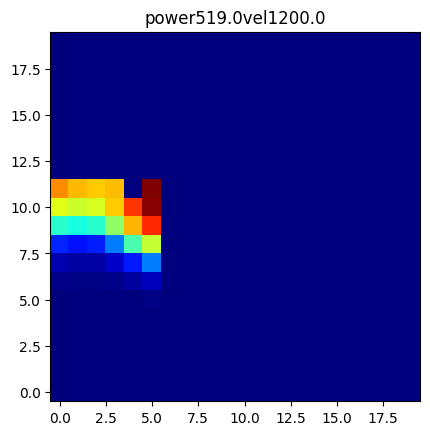

 77%|███████▋  | 2273/2970 [11:43<03:58,  2.93it/s]

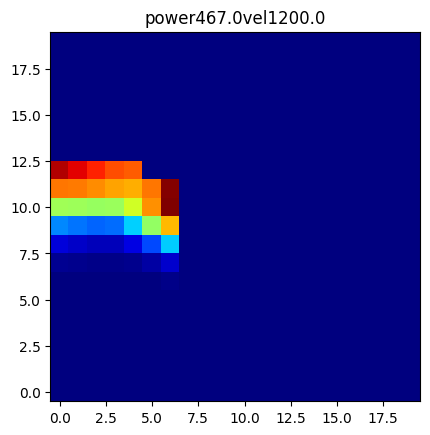

 77%|███████▋  | 2274/2970 [11:43<04:26,  2.62it/s]

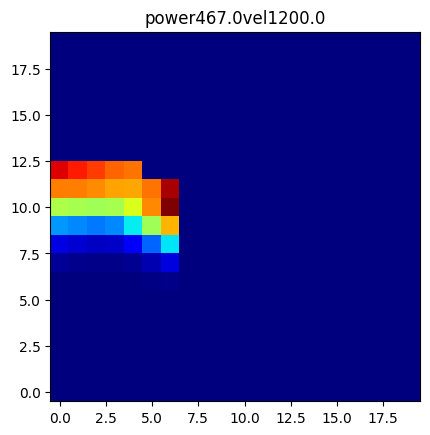

 77%|███████▋  | 2275/2970 [11:44<04:28,  2.59it/s]

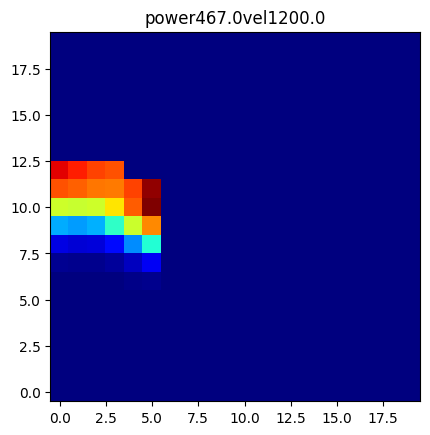

 77%|███████▋  | 2276/2970 [11:44<04:29,  2.58it/s]

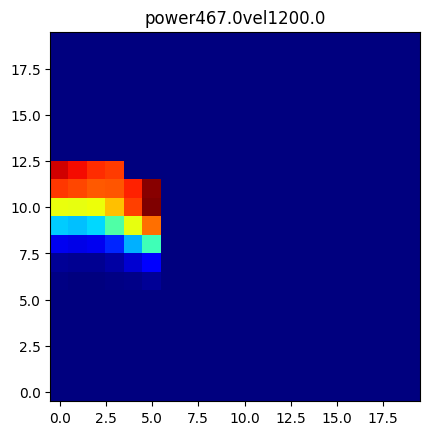

 90%|████████▉ | 2667/2970 [13:45<01:31,  3.30it/s]

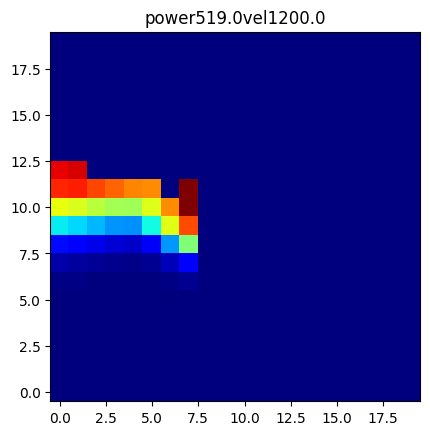

 90%|████████▉ | 2668/2970 [13:45<01:39,  3.04it/s]

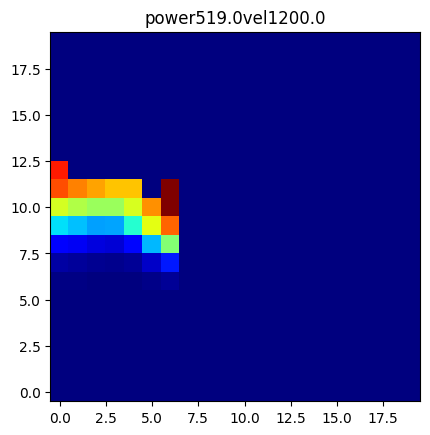

 90%|████████▉ | 2669/2970 [13:46<01:44,  2.88it/s]

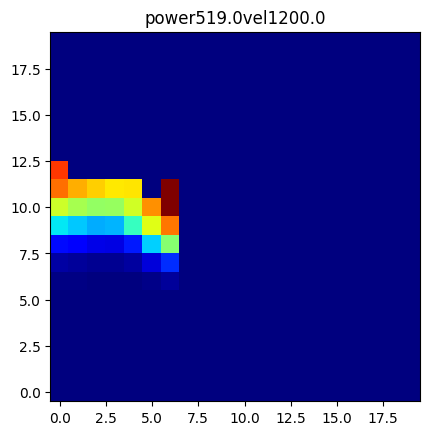

 90%|████████▉ | 2670/2970 [13:46<01:47,  2.78it/s]

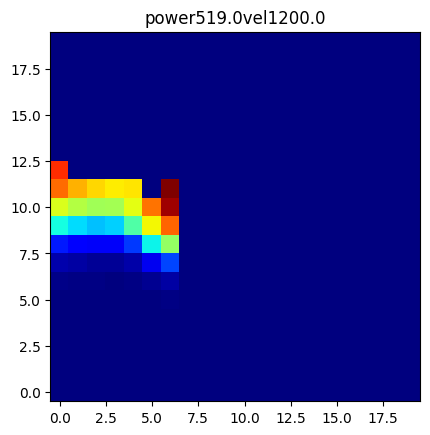

 90%|████████▉ | 2671/2970 [13:47<01:50,  2.71it/s]

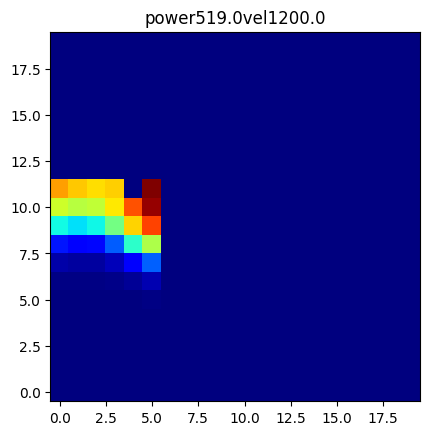

 90%|████████▉ | 2672/2970 [13:47<01:51,  2.67it/s]

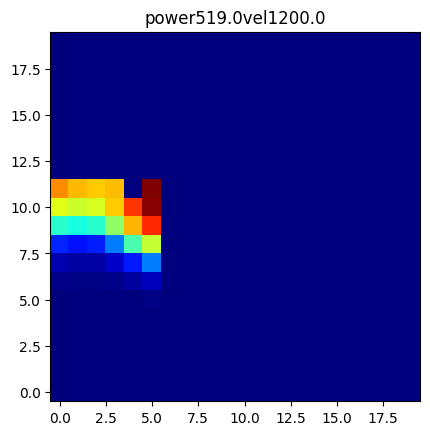

 77%|███████▋  | 2273/2970 [11:34<03:31,  3.30it/s]

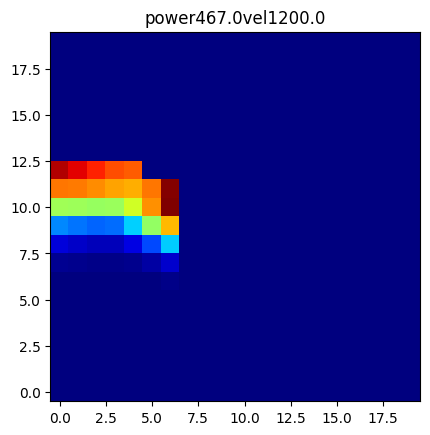

 77%|███████▋  | 2274/2970 [11:35<03:49,  3.04it/s]

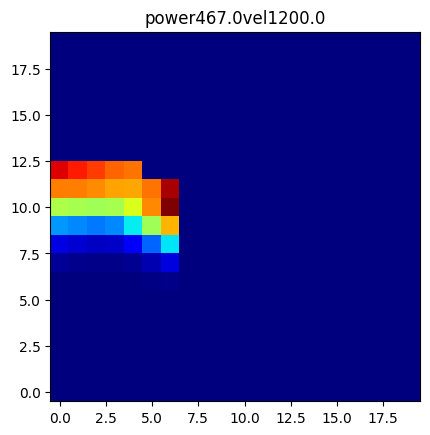

 77%|███████▋  | 2275/2970 [11:35<04:01,  2.88it/s]

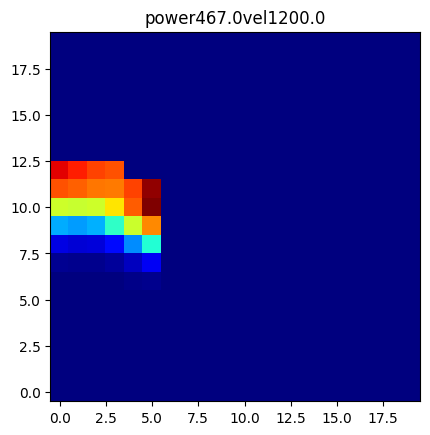

 77%|███████▋  | 2276/2970 [11:36<04:09,  2.78it/s]

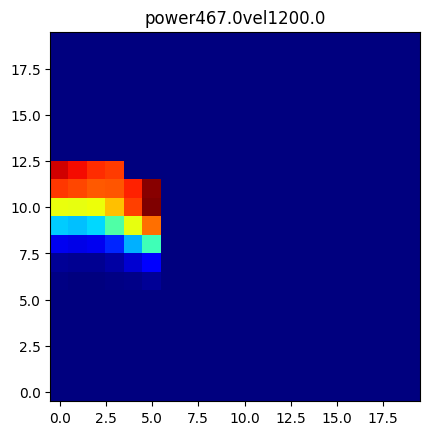

 90%|████████▉ | 2667/2970 [13:36<01:32,  3.29it/s]

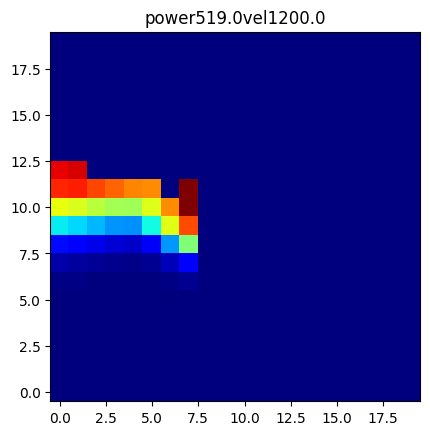

 90%|████████▉ | 2668/2970 [13:37<01:39,  3.03it/s]

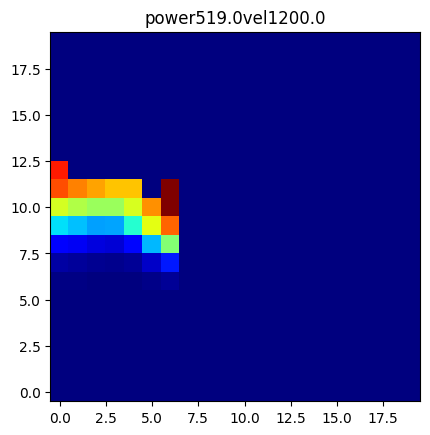

 90%|████████▉ | 2669/2970 [13:37<01:44,  2.87it/s]

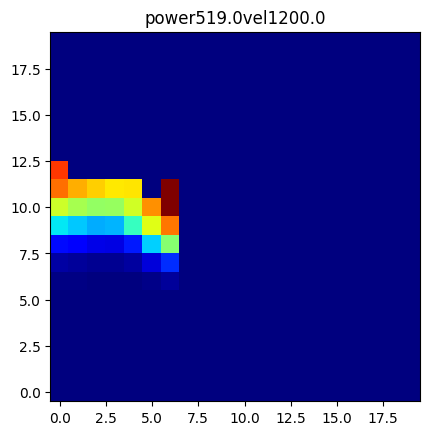

 90%|████████▉ | 2670/2970 [13:37<01:48,  2.77it/s]

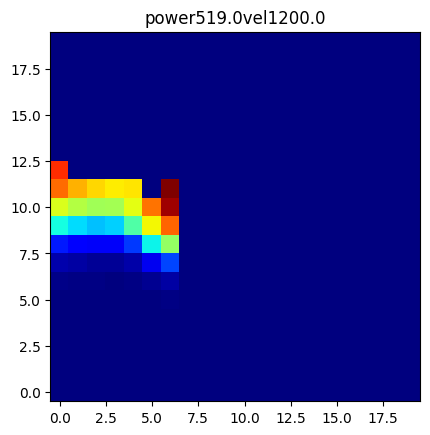

 90%|████████▉ | 2671/2970 [13:38<01:50,  2.71it/s]

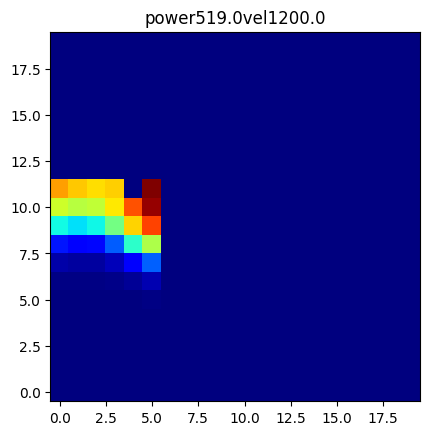

 90%|████████▉ | 2672/2970 [13:38<01:51,  2.66it/s]

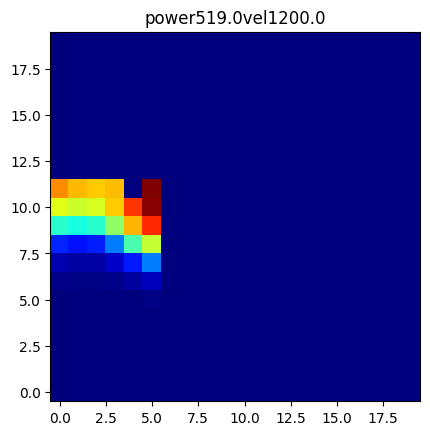

 77%|███████▋  | 2273/2970 [11:39<03:31,  3.30it/s]

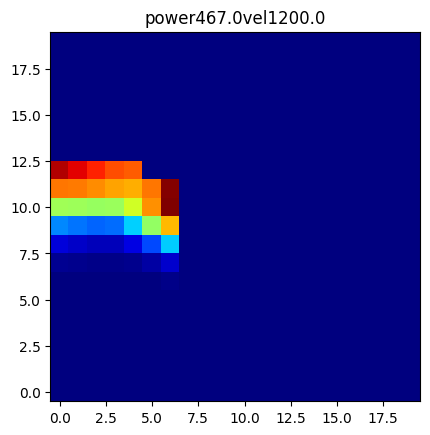

 77%|███████▋  | 2274/2970 [11:39<03:48,  3.04it/s]

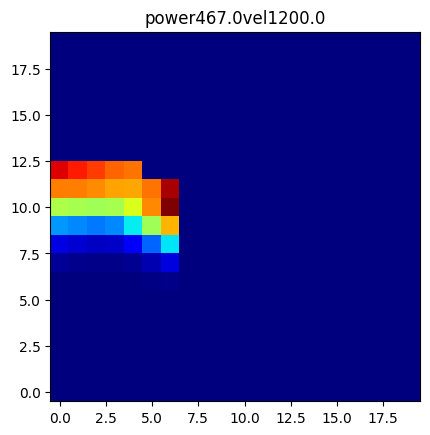

 77%|███████▋  | 2275/2970 [11:40<04:01,  2.88it/s]

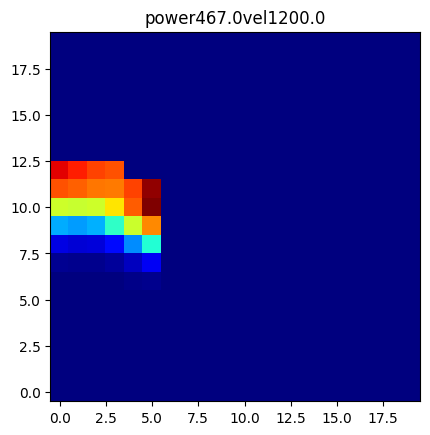

 77%|███████▋  | 2276/2970 [11:40<04:09,  2.78it/s]

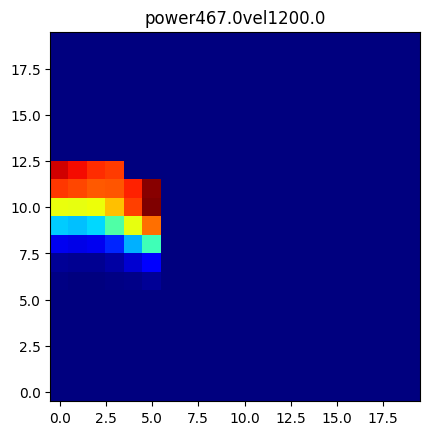

 90%|████████▉ | 2667/2970 [13:43<01:31,  3.30it/s]

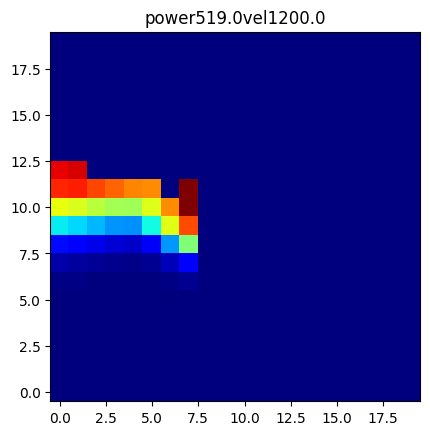

 90%|████████▉ | 2668/2970 [13:43<01:39,  3.03it/s]

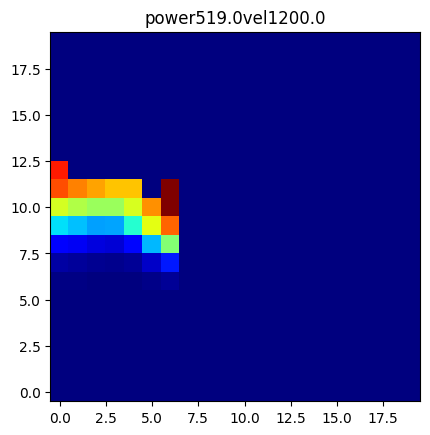

 90%|████████▉ | 2669/2970 [13:43<01:44,  2.87it/s]

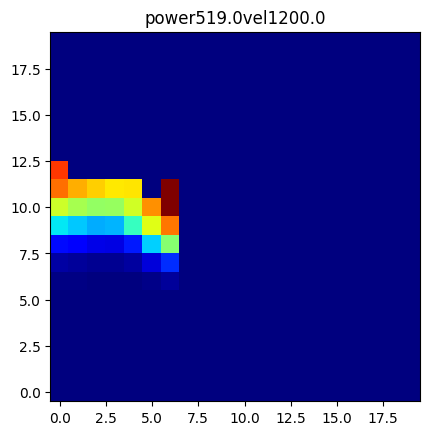

 90%|████████▉ | 2670/2970 [13:44<01:48,  2.77it/s]

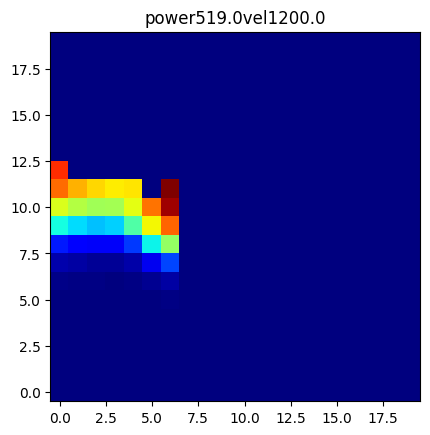

 90%|████████▉ | 2671/2970 [13:44<01:50,  2.69it/s]

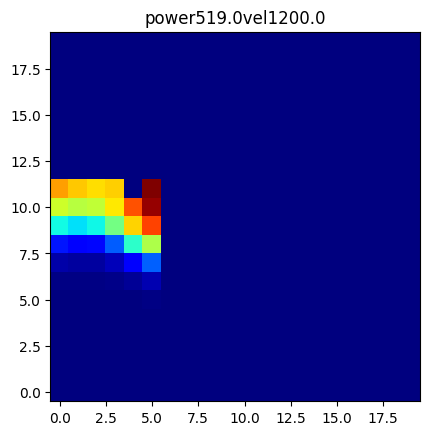

 90%|████████▉ | 2672/2970 [13:45<01:52,  2.64it/s]

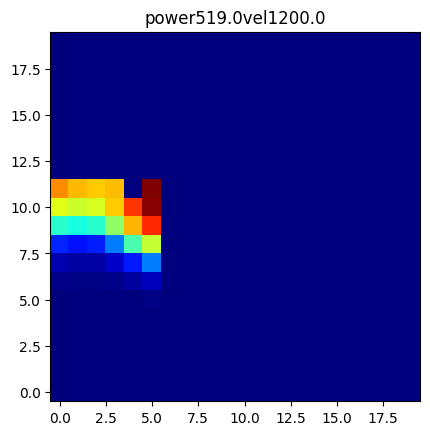

 77%|███████▋  | 2273/2970 [11:43<03:38,  3.18it/s]

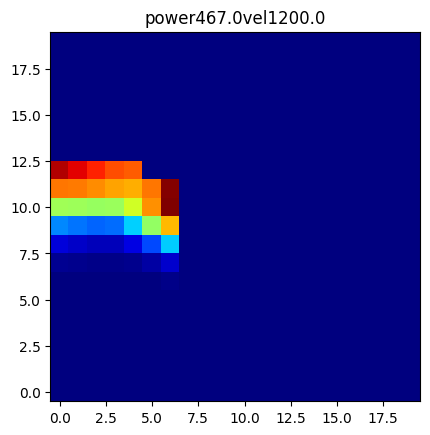

 77%|███████▋  | 2274/2970 [11:44<03:58,  2.92it/s]

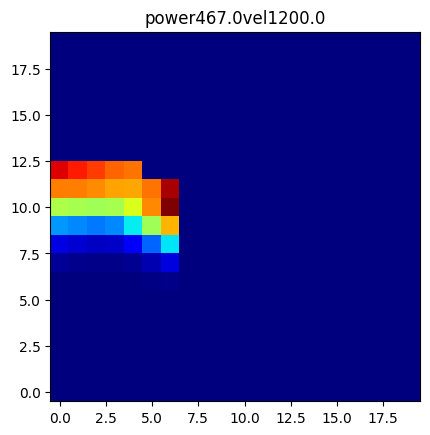

 77%|███████▋  | 2275/2970 [11:44<04:11,  2.77it/s]

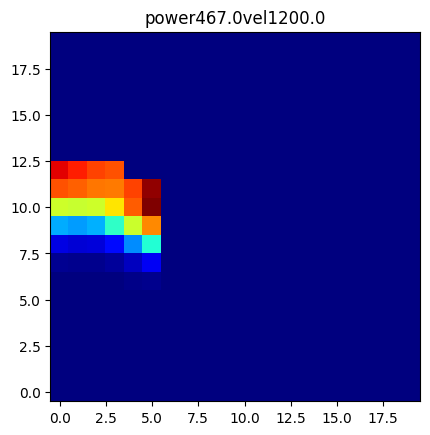

 77%|███████▋  | 2276/2970 [11:44<04:19,  2.67it/s]

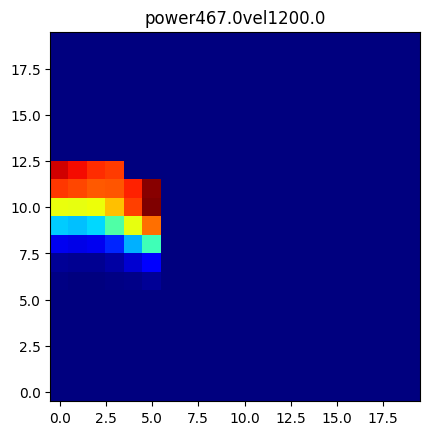

 90%|████████▉ | 2667/2970 [13:46<01:31,  3.30it/s]

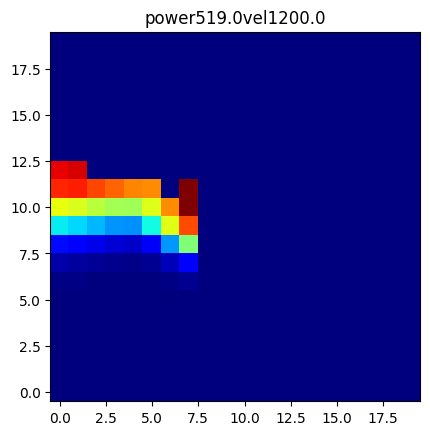

 90%|████████▉ | 2668/2970 [13:46<01:39,  3.03it/s]

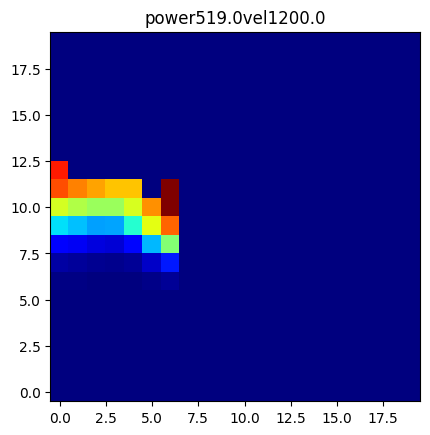

 90%|████████▉ | 2669/2970 [13:46<01:44,  2.88it/s]

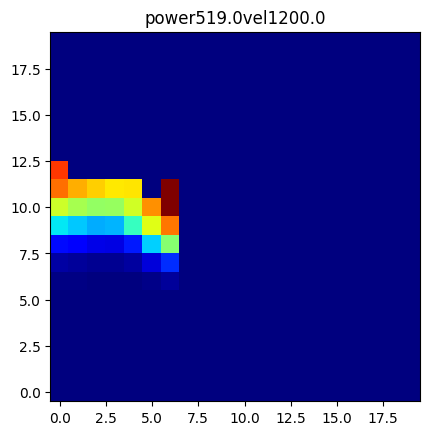

 90%|████████▉ | 2670/2970 [13:47<01:48,  2.78it/s]

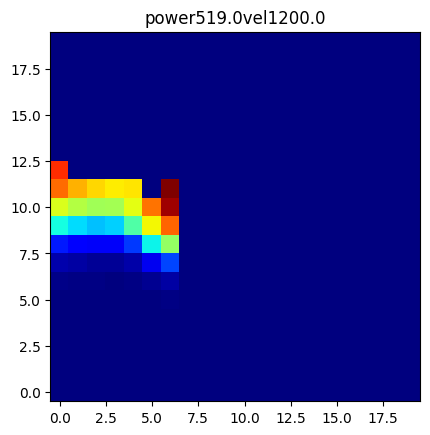

 90%|████████▉ | 2671/2970 [13:47<01:50,  2.71it/s]

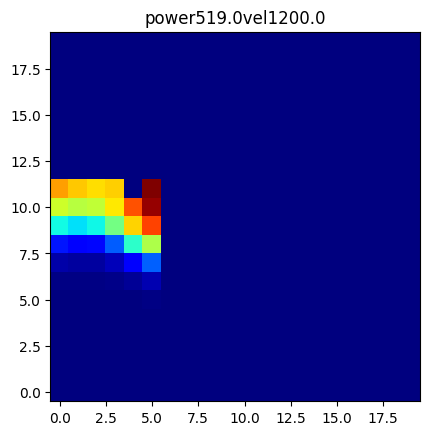

 90%|████████▉ | 2672/2970 [13:48<01:51,  2.66it/s]

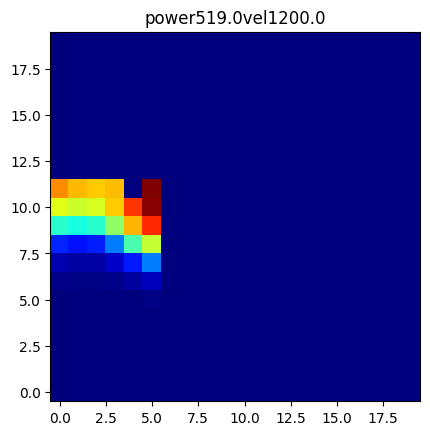

 77%|███████▋  | 2273/2970 [11:43<03:31,  3.30it/s]

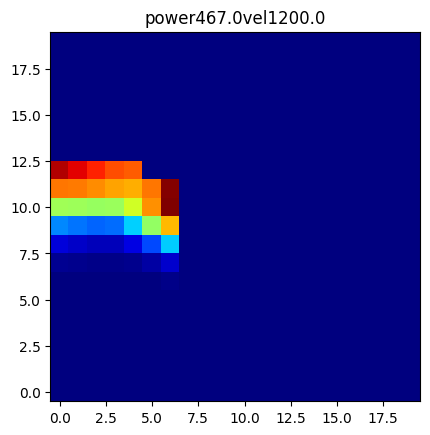

 77%|███████▋  | 2274/2970 [11:43<03:49,  3.04it/s]

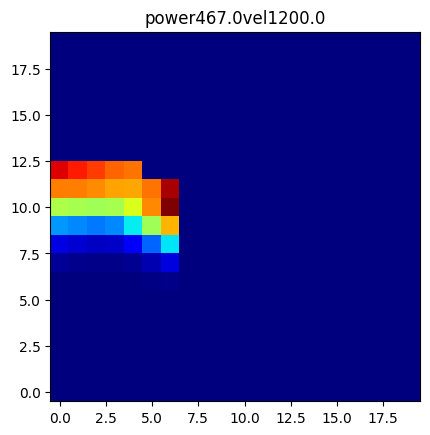

 77%|███████▋  | 2275/2970 [11:43<04:01,  2.88it/s]

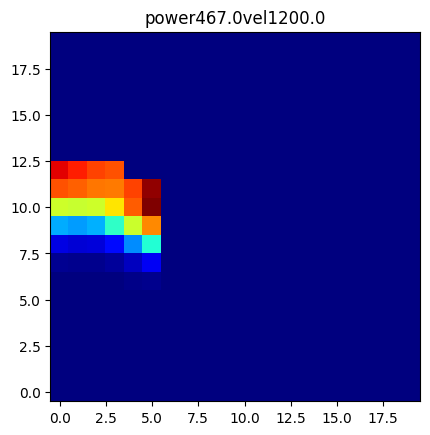

 77%|███████▋  | 2276/2970 [11:44<04:09,  2.78it/s]

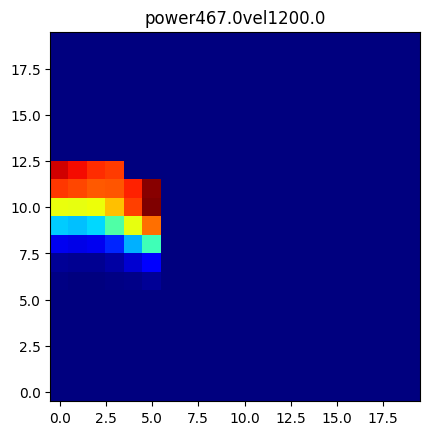

 90%|████████▉ | 2667/2970 [13:44<01:31,  3.30it/s]

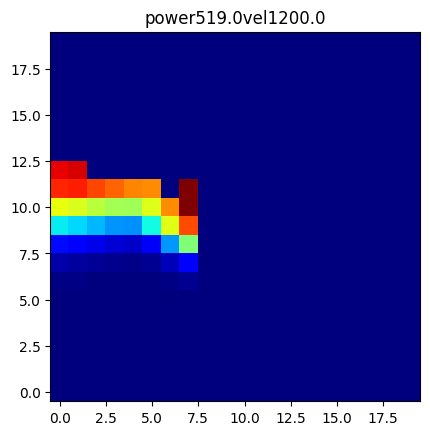

 90%|████████▉ | 2668/2970 [13:45<01:39,  3.03it/s]

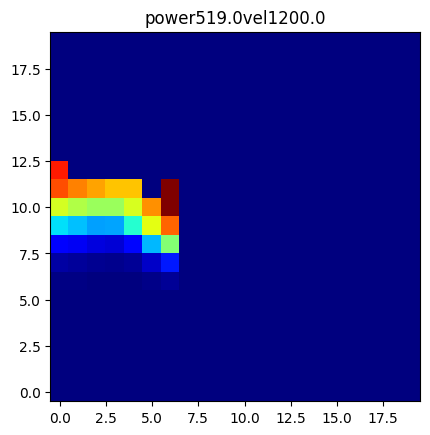

 90%|████████▉ | 2669/2970 [13:45<01:44,  2.87it/s]

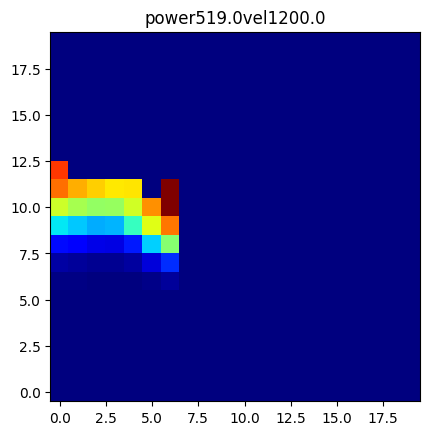

 90%|████████▉ | 2670/2970 [13:46<01:47,  2.78it/s]

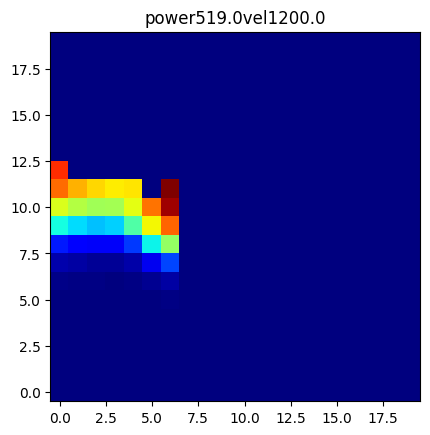

 90%|████████▉ | 2671/2970 [13:46<01:50,  2.71it/s]

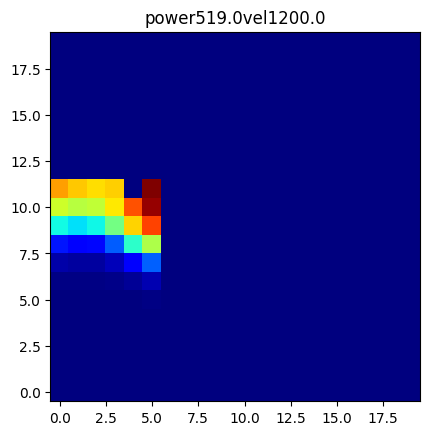

 90%|████████▉ | 2672/2970 [13:46<01:51,  2.67it/s]

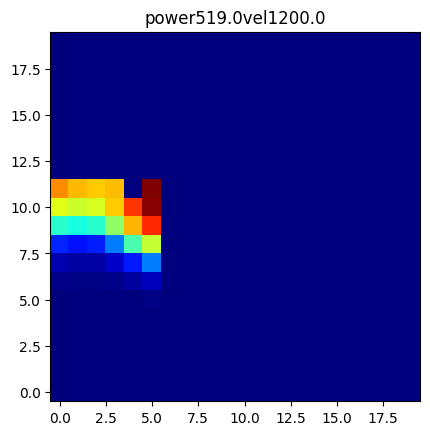

 77%|███████▋  | 2273/2970 [11:42<03:31,  3.30it/s]

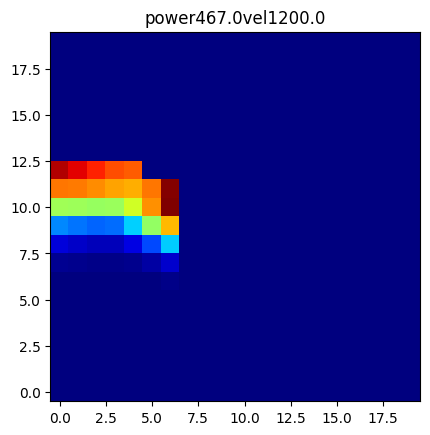

 77%|███████▋  | 2274/2970 [11:42<03:49,  3.04it/s]

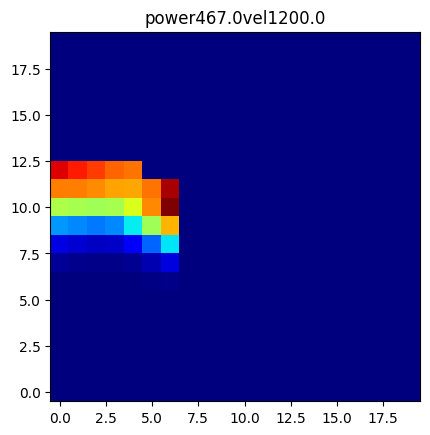

 77%|███████▋  | 2275/2970 [11:42<04:01,  2.88it/s]

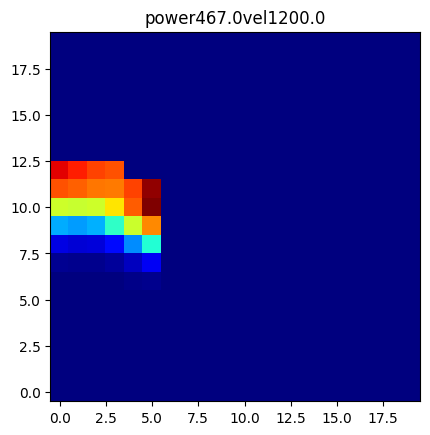

 77%|███████▋  | 2276/2970 [11:43<04:09,  2.78it/s]

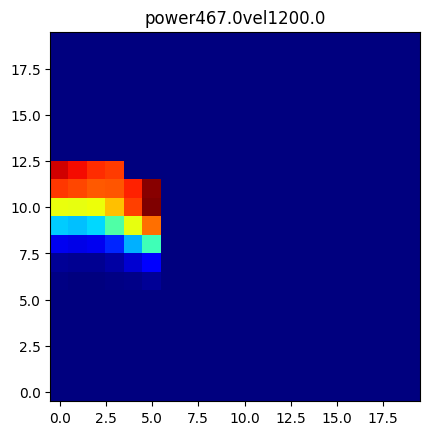

 90%|████████▉ | 2667/2970 [13:43<01:31,  3.30it/s]

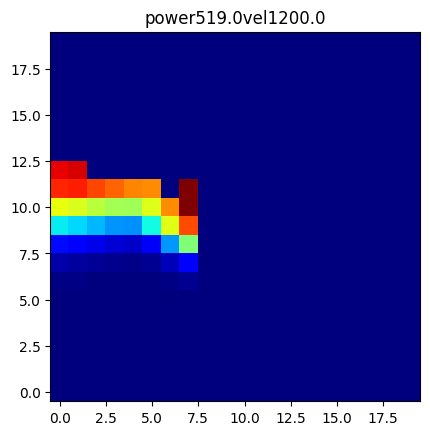

 90%|████████▉ | 2668/2970 [13:43<01:39,  3.03it/s]

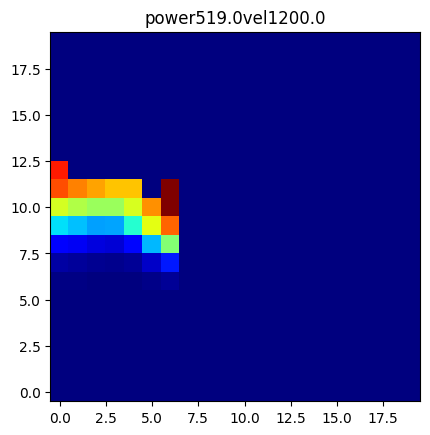

 90%|████████▉ | 2669/2970 [13:44<01:44,  2.87it/s]

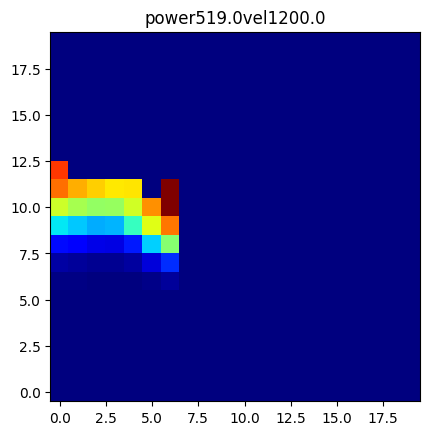

 90%|████████▉ | 2670/2970 [13:44<01:48,  2.77it/s]

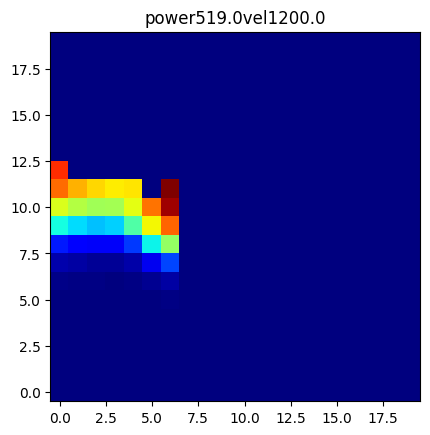

 90%|████████▉ | 2671/2970 [13:44<01:50,  2.71it/s]

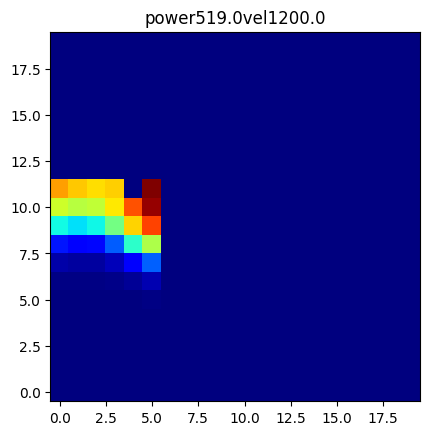

 90%|████████▉ | 2672/2970 [13:45<01:51,  2.66it/s]

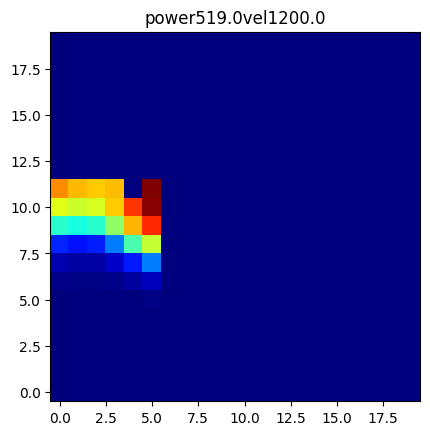

 77%|███████▋  | 2273/2970 [11:38<03:31,  3.30it/s]

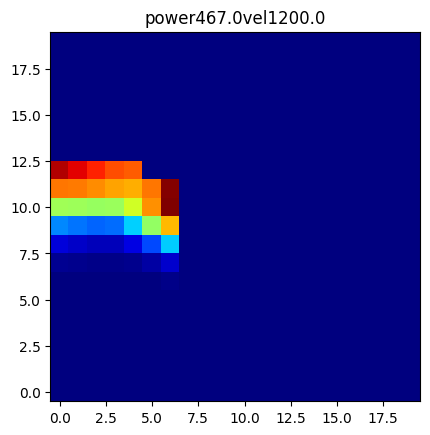

 77%|███████▋  | 2274/2970 [11:38<03:49,  3.03it/s]

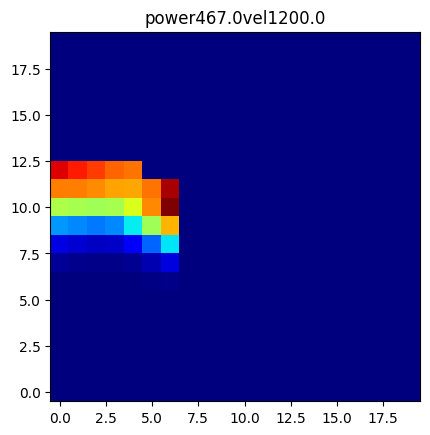

 77%|███████▋  | 2275/2970 [11:39<04:01,  2.88it/s]

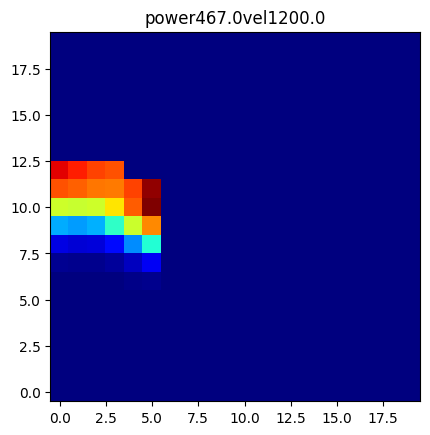

 77%|███████▋  | 2276/2970 [11:39<04:09,  2.78it/s]

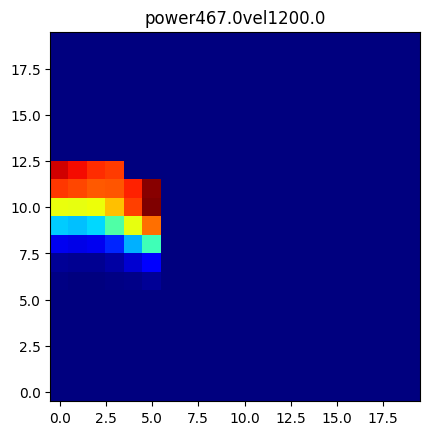

 90%|████████▉ | 2667/2970 [13:39<01:31,  3.30it/s]

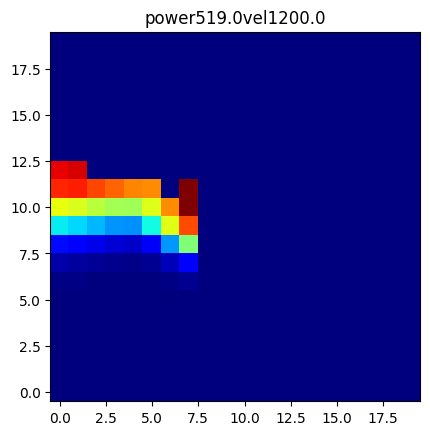

 90%|████████▉ | 2668/2970 [13:40<01:39,  3.03it/s]

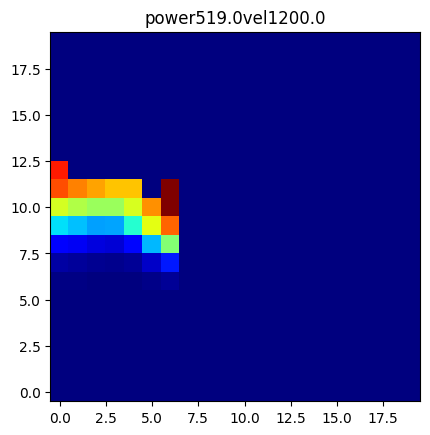

 90%|████████▉ | 2669/2970 [13:40<01:44,  2.88it/s]

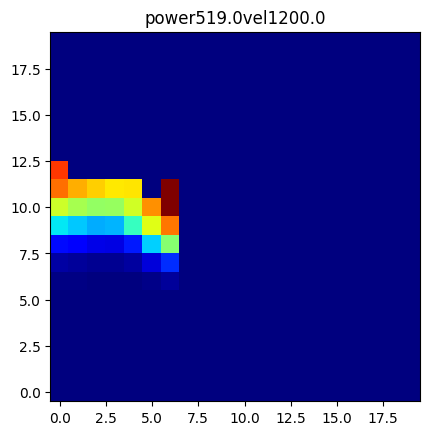

 90%|████████▉ | 2670/2970 [13:40<01:48,  2.78it/s]

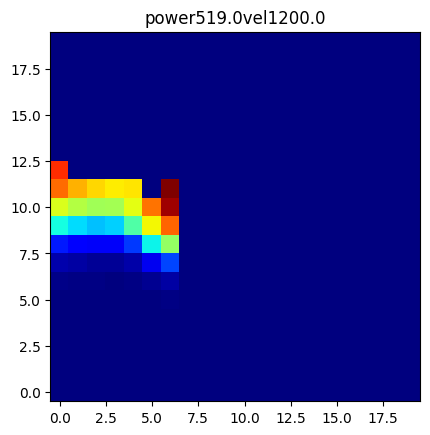

 90%|████████▉ | 2671/2970 [13:41<01:50,  2.70it/s]

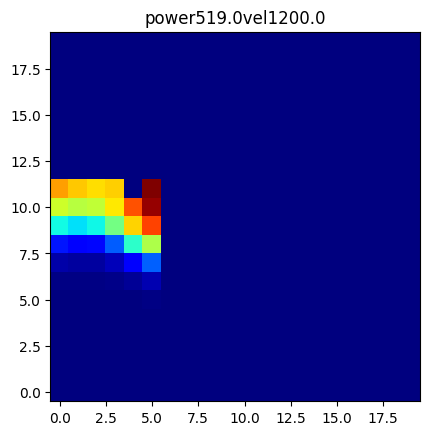

 90%|████████▉ | 2672/2970 [13:41<01:52,  2.66it/s]

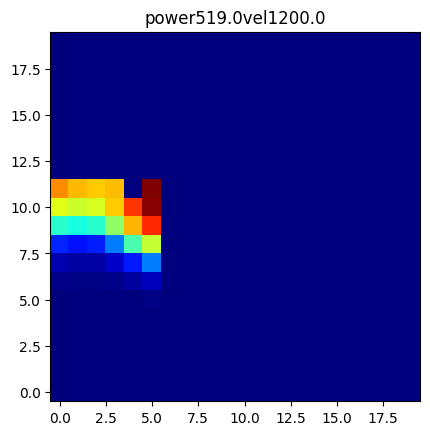

 77%|███████▋  | 2273/2970 [11:40<03:31,  3.30it/s]

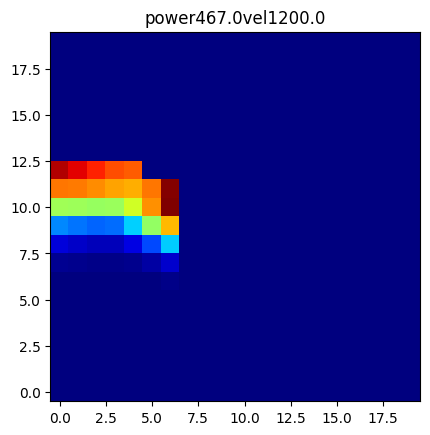

 77%|███████▋  | 2274/2970 [11:41<04:29,  2.58it/s]

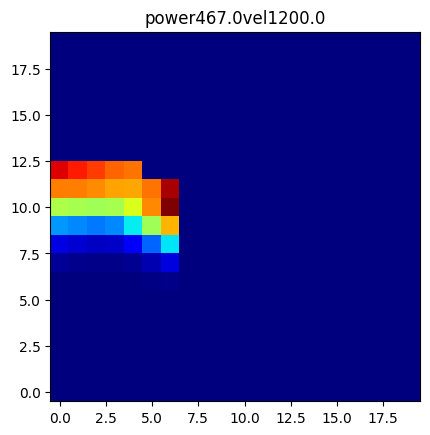

 77%|███████▋  | 2275/2970 [11:41<04:41,  2.47it/s]

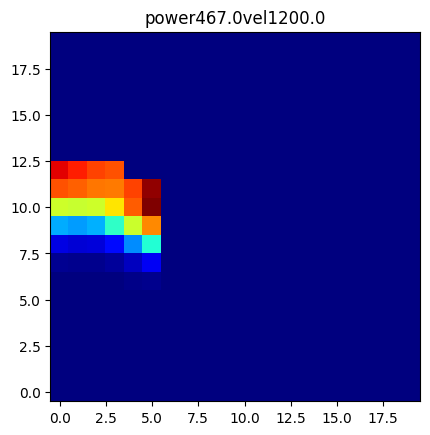

 77%|███████▋  | 2276/2970 [11:42<04:37,  2.50it/s]

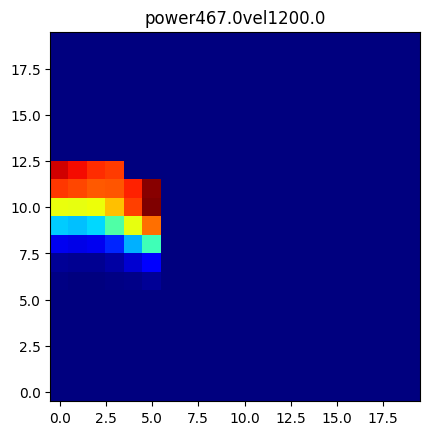

 90%|████████▉ | 2667/2970 [13:43<01:31,  3.29it/s]

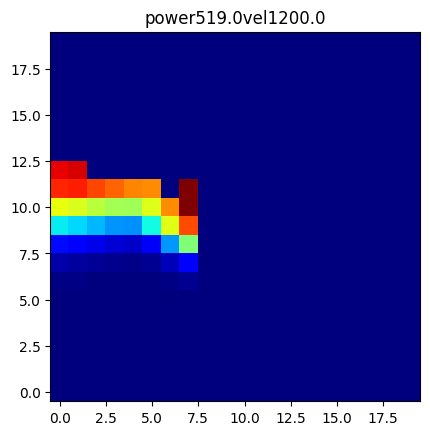

 90%|████████▉ | 2668/2970 [13:43<01:39,  3.03it/s]

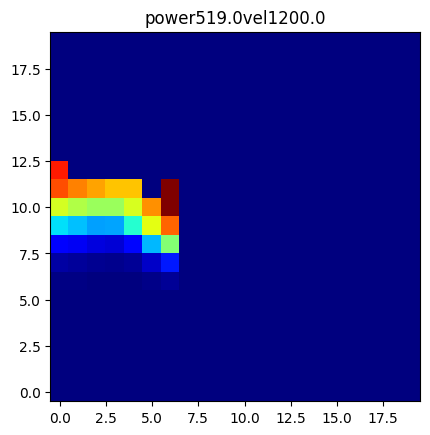

 90%|████████▉ | 2669/2970 [13:44<01:44,  2.87it/s]

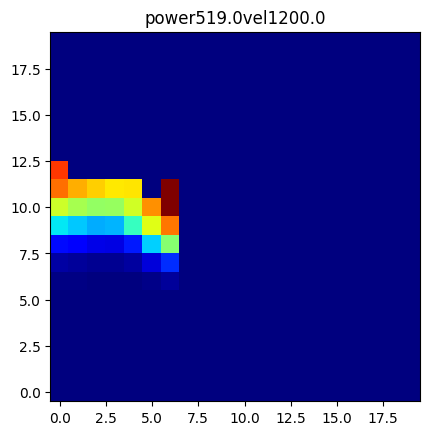

 90%|████████▉ | 2670/2970 [13:44<01:48,  2.77it/s]

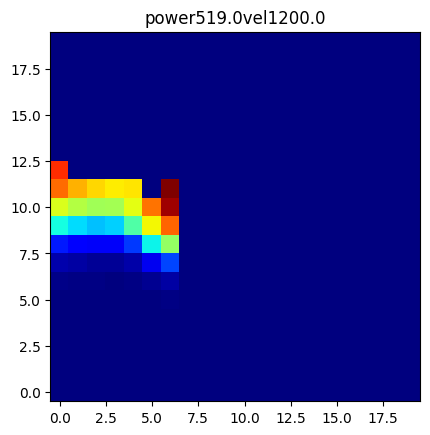

 90%|████████▉ | 2671/2970 [13:45<01:50,  2.71it/s]

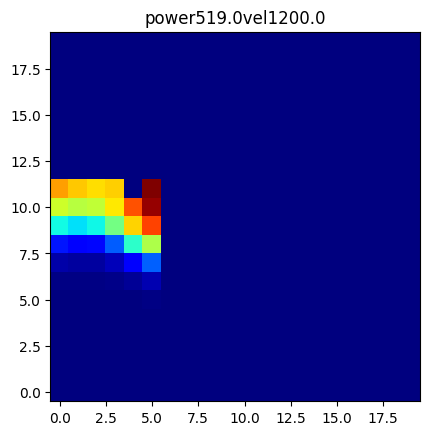

 90%|████████▉ | 2672/2970 [13:45<01:51,  2.66it/s]

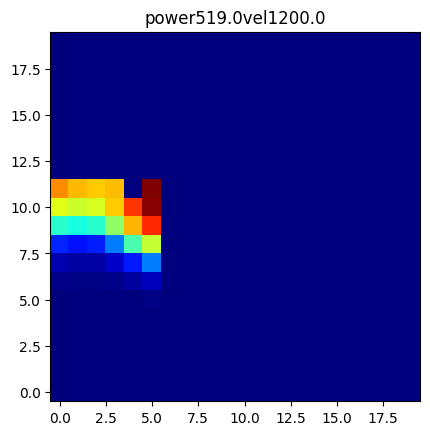

100%|██████████| 2970/2970 [15:17<00:00,  3.24it/s]


In [143]:
last_power = ''
modeltype = 'Diffusion' # Defines part of the title of the image

# diff_results_global = {}
skip = 50
for trial_key in range(10):
    enc_depths_sim = []
    diff_depths_sim = []
    gt_depths_sim = []
    lr_depths_sim = []
    enc_kp_sim = []
    diff_kp_sim = []
    gt_kp_sim = []
    lr_kp_sim = []
    gt_results = {}
    enc_results = {}
    diff_results = {}
    lr_results = {}
    for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(train_dataloader), total = len(train_dataloader)):  
    

        oldtime = time.time()

        input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
        input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,encoding = encode_bool,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
        # input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dev_dataloader.dataset)
        # input, result_diffusion, target = predict_modified_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,dataset =  train_dataset, timesteps = timesteps, schedule = 'linear')
        
        info = info[0] # info is technically returned with an extra dimension, this command removes it.
        time_elapsed = time.time()-oldtime
        # print(last_power)
        if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
            
            timestep = 0

            # enc_depths_sim = []
            # diff_depths_sim = []
            gt_depths_sim = []
            lr_depths_sim = []
            # enc_kp_sim = []
            # diff_kp_sim = []
            gt_kp_sim = []
            lr_kp_sim = []

        else:
            timestep += 1
        # profile_diff, kp_diff = get_profile(result_diffusion[0])
        profile_gt, kp_gt = get_profile(target[0])
        # profile_enc, kp_enc = get_profile(result[0])
        profile_lr, kp_lr = get_profile(input[0])

        # enc_kp_sim.append(5*(80-np.min(kp_enc)))
        gt_kp_sim.append(5*(80-np.min(kp_gt)))
        # diff_kp_sim.append(5*(80-np.min(kp_diff)))
        lr_kp_sim.append(20*(20 - np.min(kp_lr)))
        # enc_depths_sim.append(5*(80-np.min(profile_enc)))
        gt_depths_sim.append(5*(80-np.min(profile_gt)))
        # diff_depths_sim.append(5*(80-np.min(profile_diff)))
        lr_depths_sim.append(20*(20 - np.min(profile_lr)))
        if lr_depths_sim[-1] < 50 and gt_depths_sim[-1] > 100:
            plt.title('power' + str(info[0].item()) + 'vel' + str(info[1].item())  )
            plt.imshow(input[0][0].T, origin = 'lower', cmap = 'jet')
            plt.show()
        last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  
        gt_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = gt_kp_sim
        # enc_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = enc_kp_sim
        # diff_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = diff_kp_sim
        lr_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = lr_kp_sim
        gt_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = gt_depths_sim
        # enc_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = enc_depths_sim
        # diff_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = diff_depths_sim
        lr_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = lr_depths_sim
    # diff_results_global[trial_key] = diff_results
        # if batch_idx > 3:
        #     break
    # break

 19%|█▉        | 559/2970 [00:00<00:03, 746.03it/s]

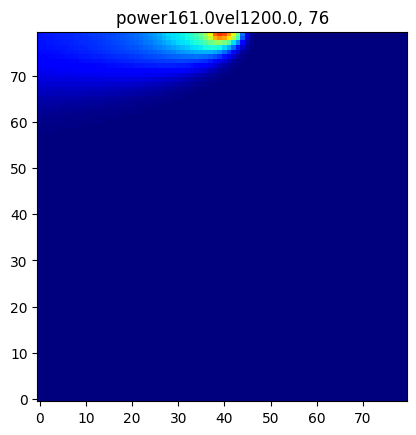

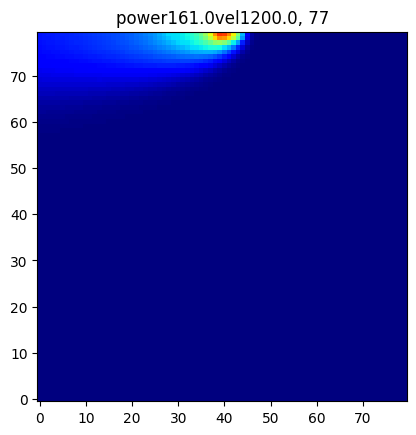

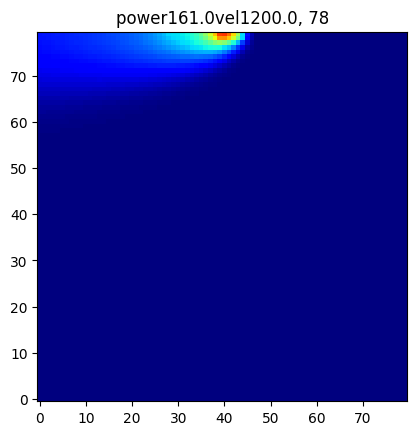

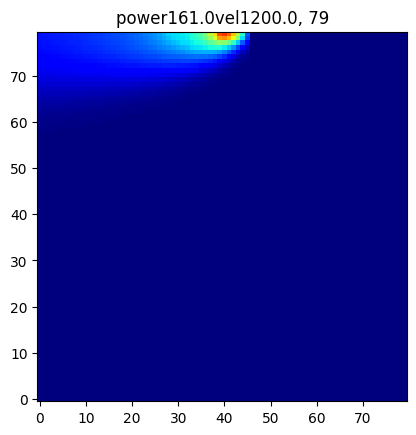

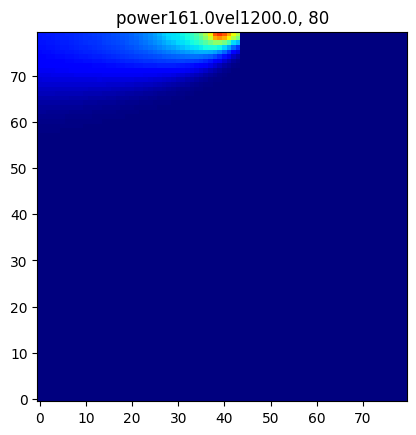

...

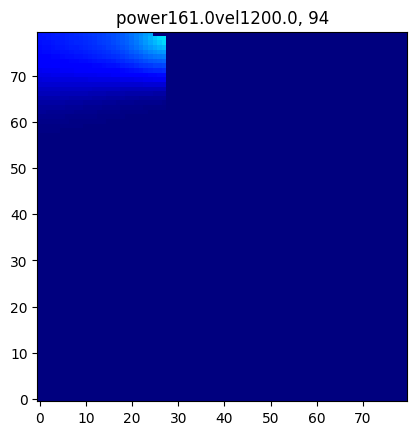

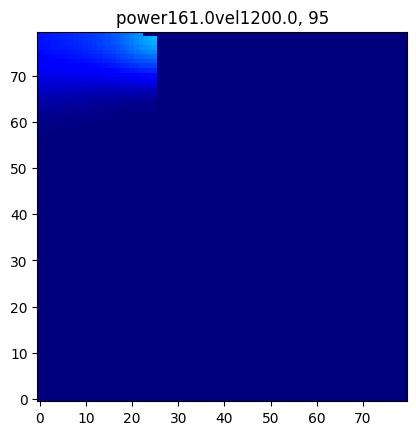

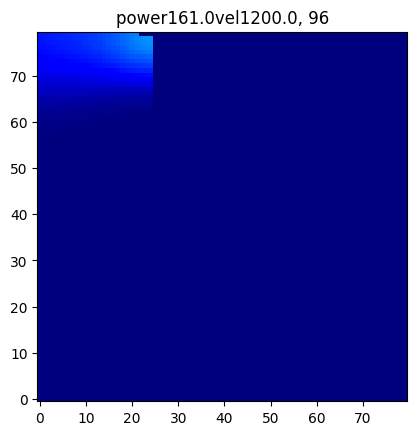

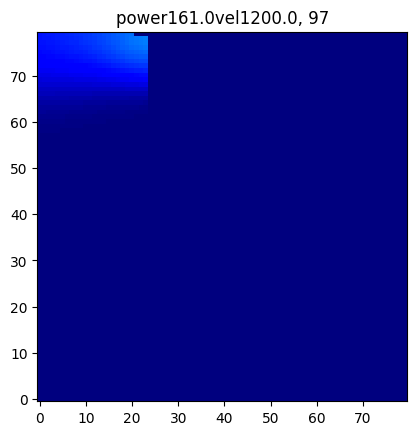

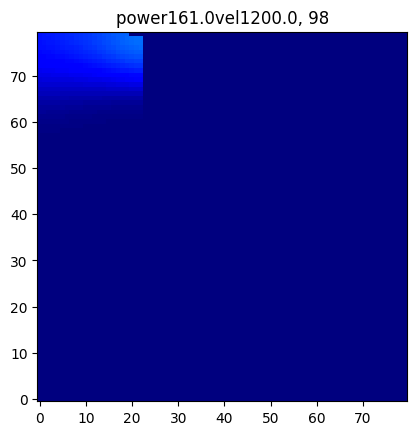

 28%|██▊       | 844/2970 [00:03<00:09, 220.92it/s]

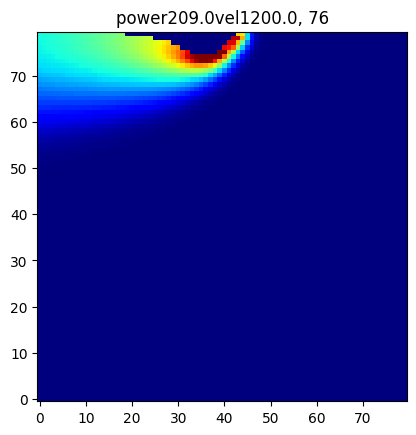

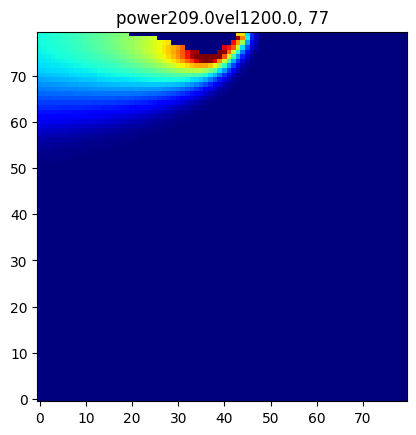

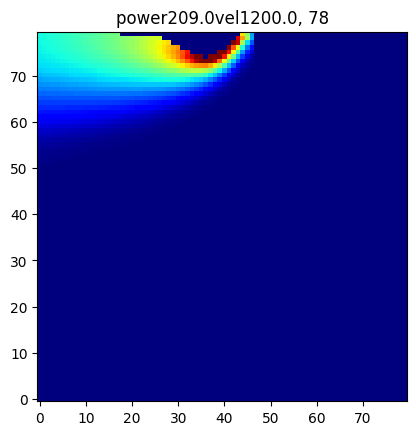

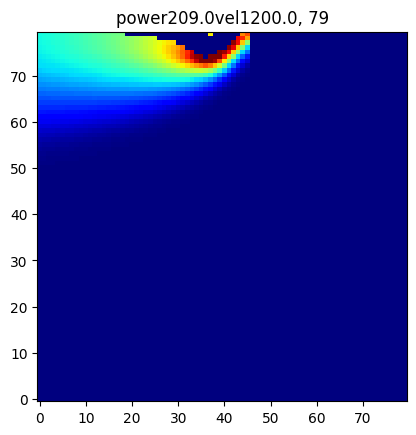

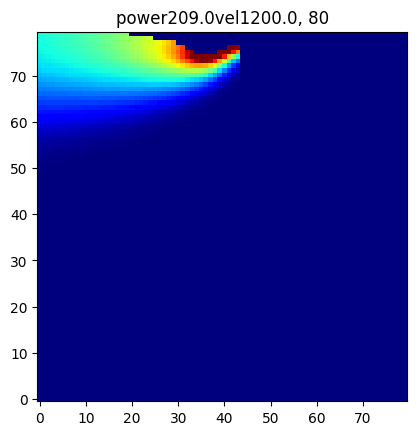

...

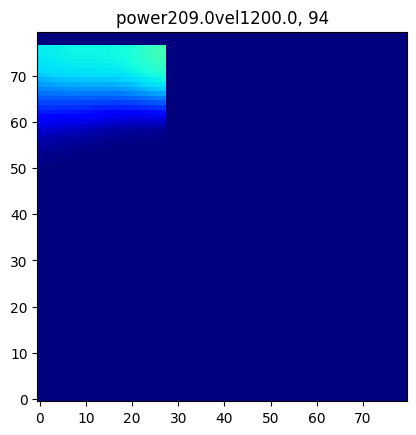

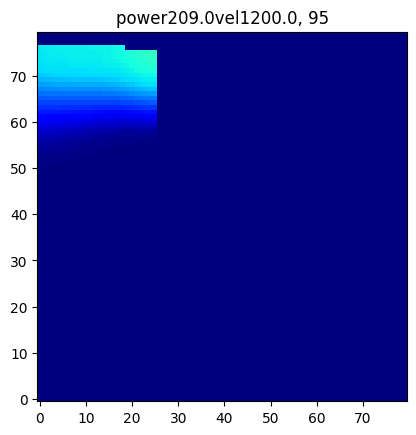

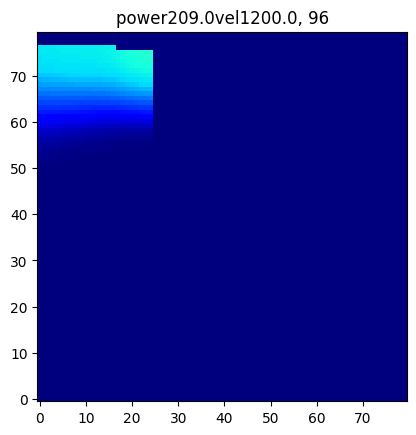

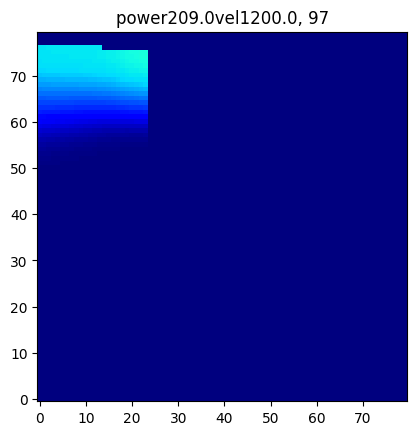

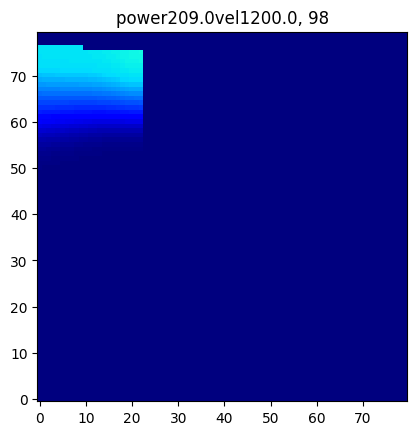

 37%|███▋      | 1094/2970 [00:06<00:13, 142.37it/s]

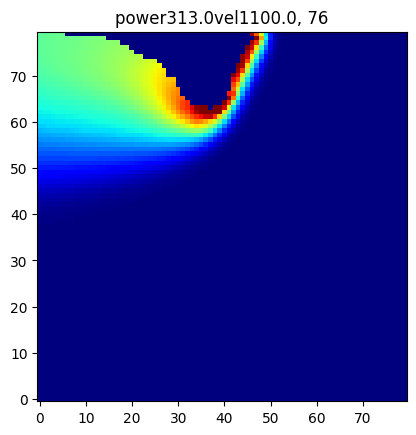

 39%|███▉      | 1166/2970 [00:06<00:10, 174.77it/s]

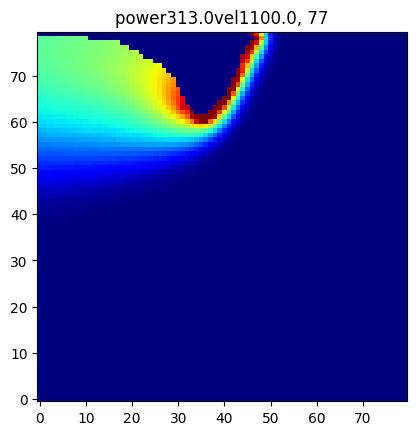

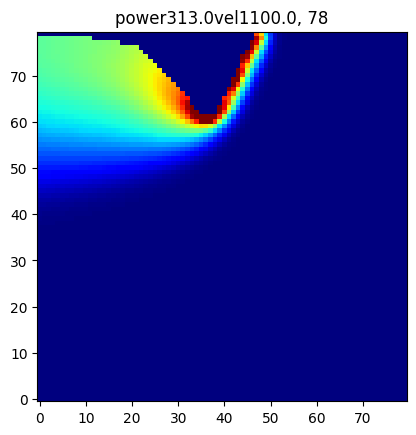

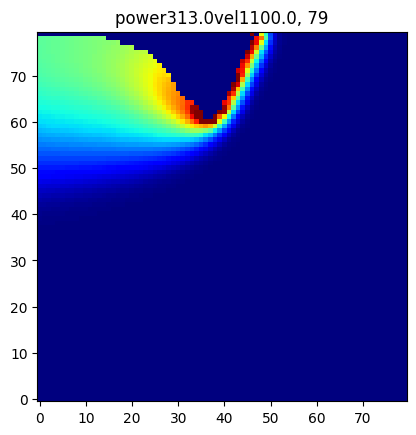

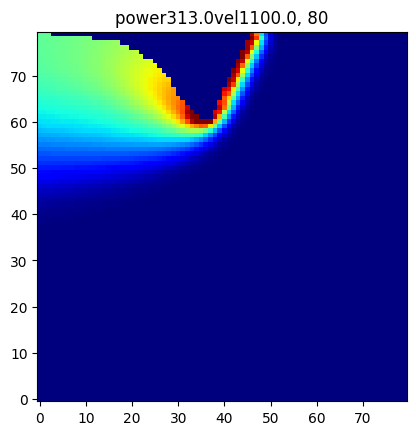

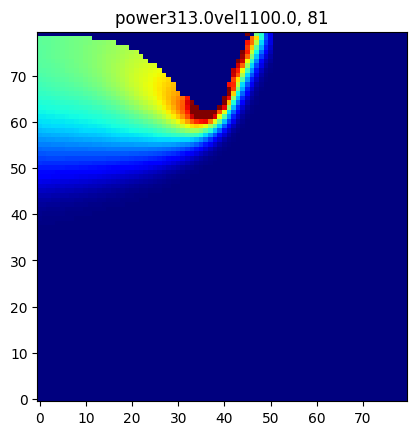

...

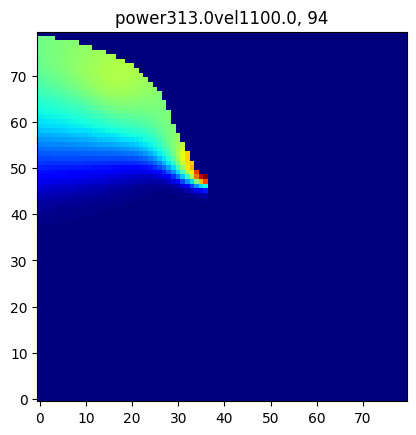

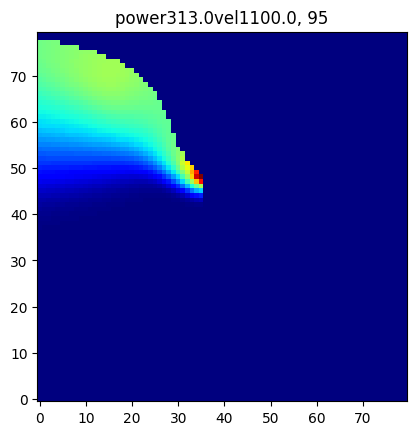

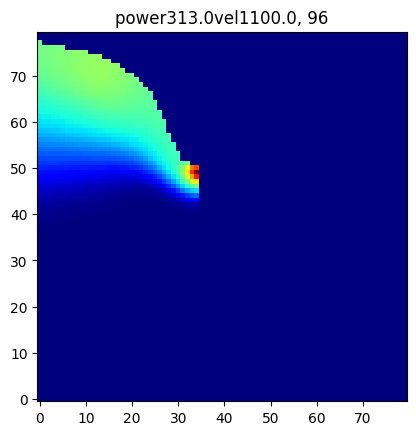

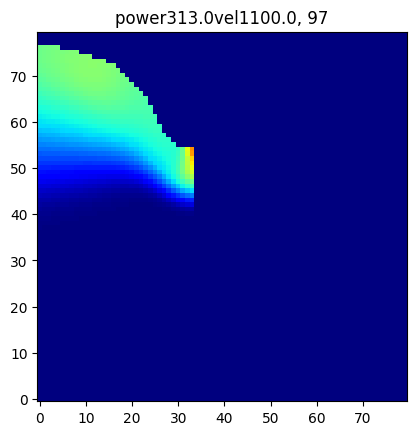

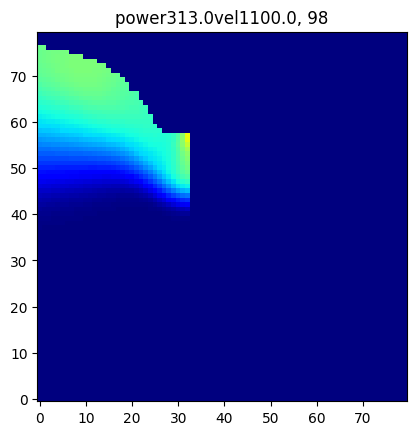

 61%|██████    | 1817/2970 [00:09<00:02, 430.10it/s]

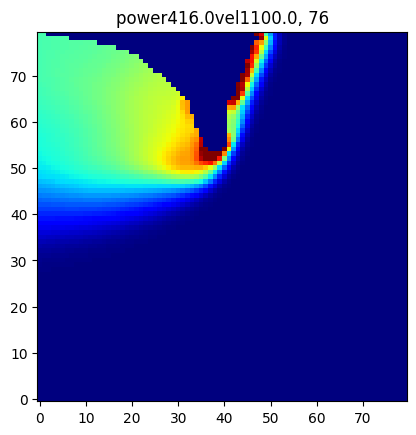

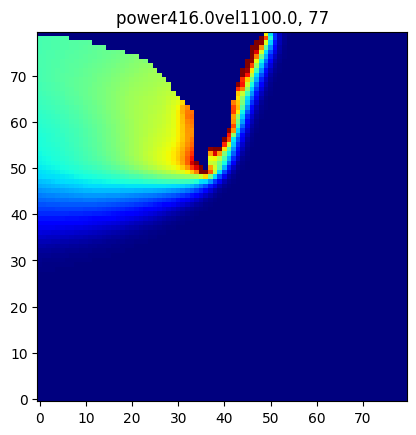

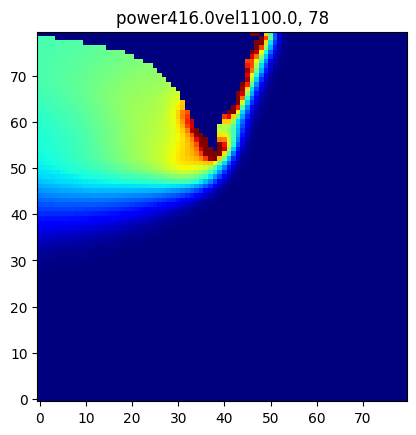

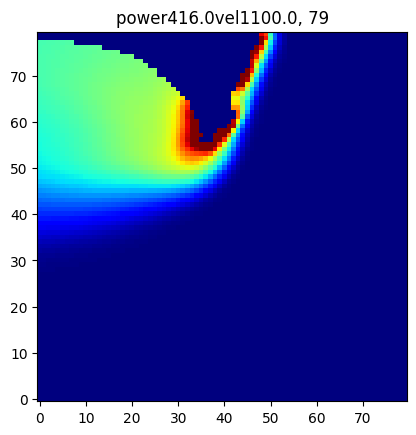

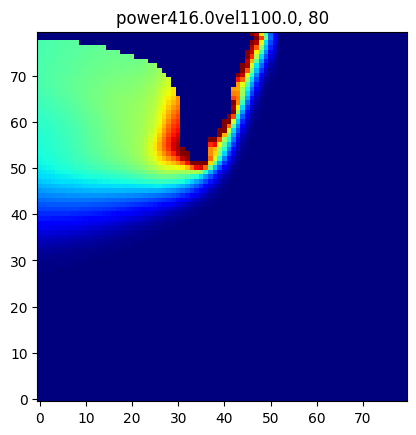

...

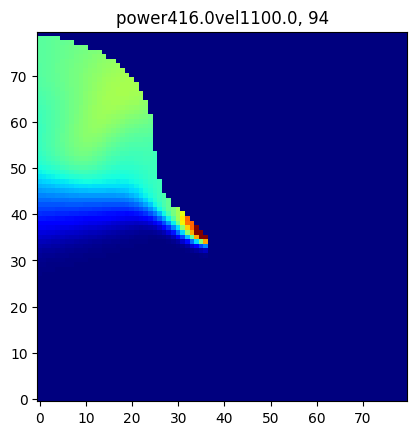

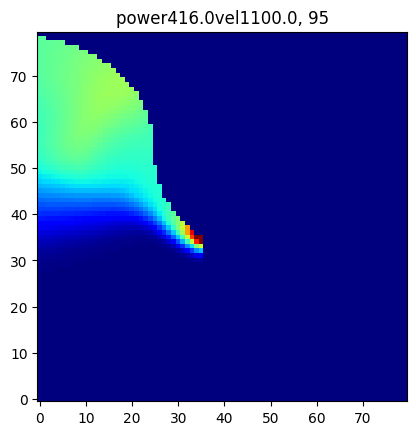

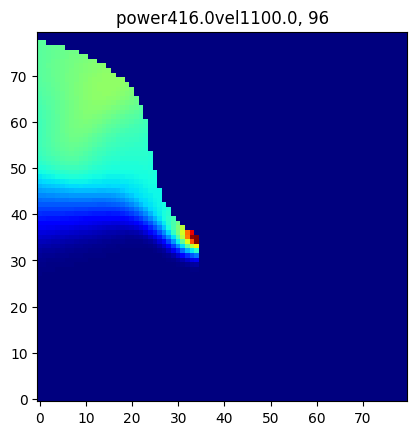

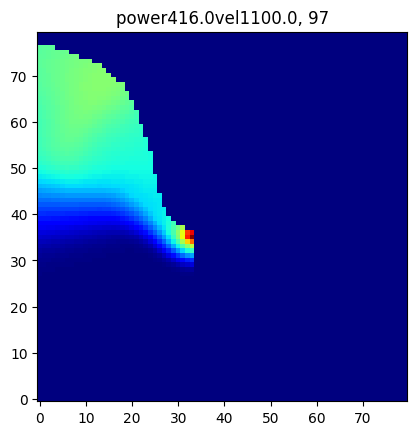

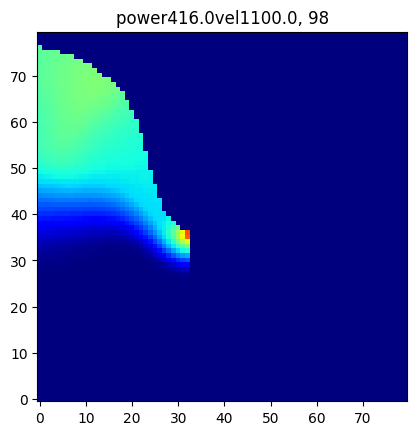

 73%|███████▎  | 2155/2970 [00:11<00:03, 225.20it/s]

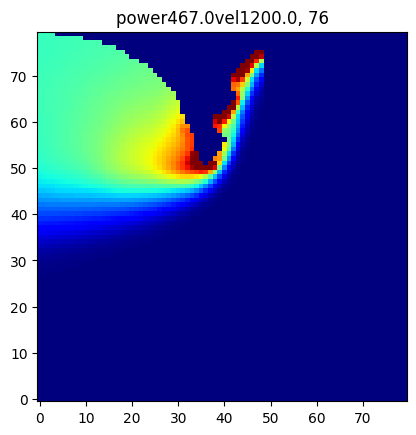

 76%|███████▌  | 2255/2970 [00:12<00:02, 270.73it/s]

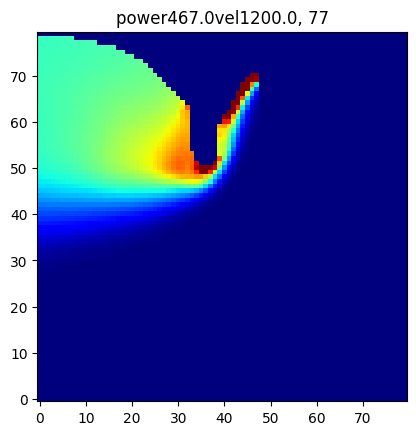

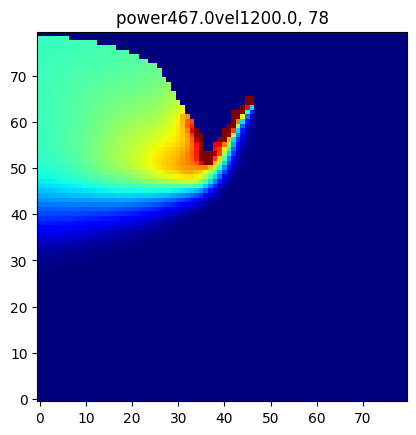

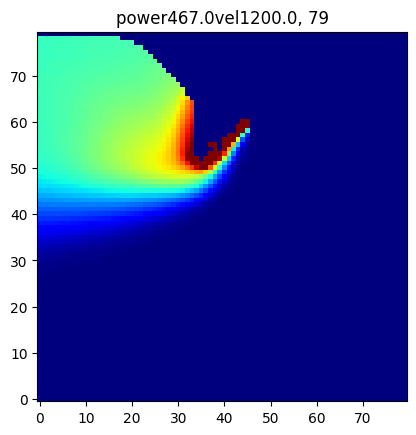

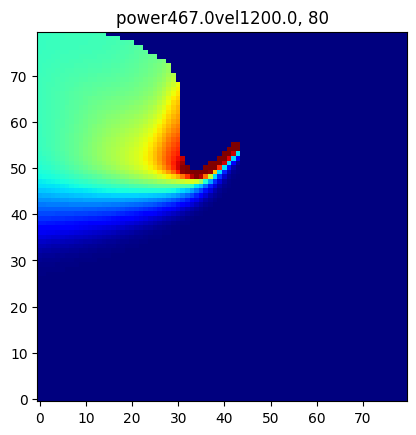

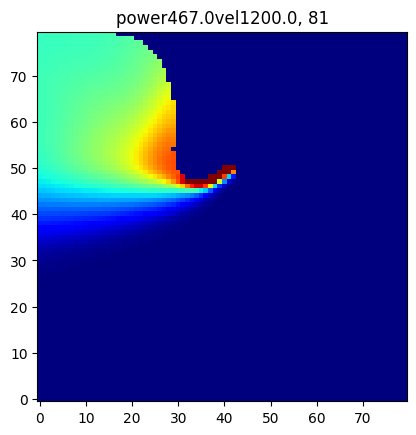

...

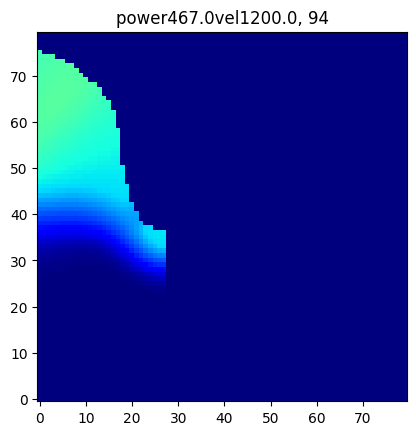

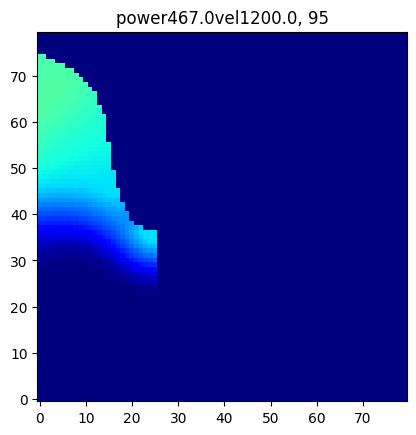

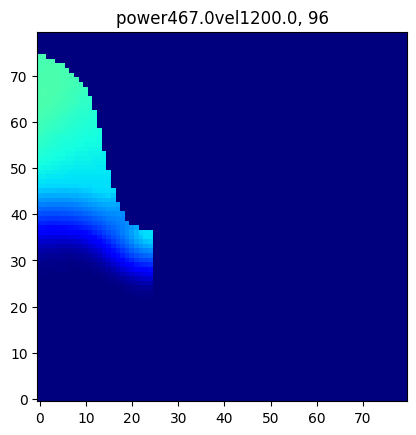

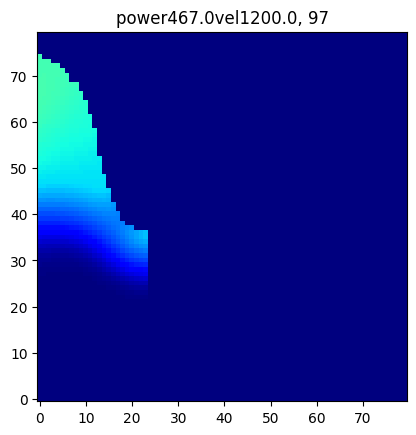

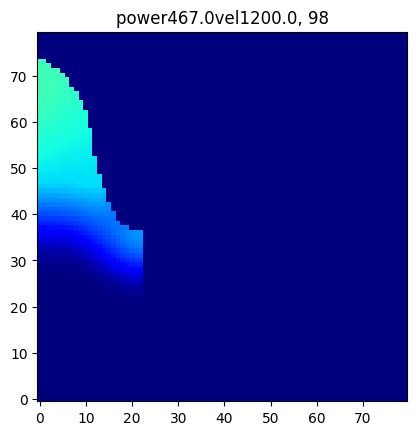

 87%|████████▋ | 2570/2970 [00:14<00:01, 201.51it/s]

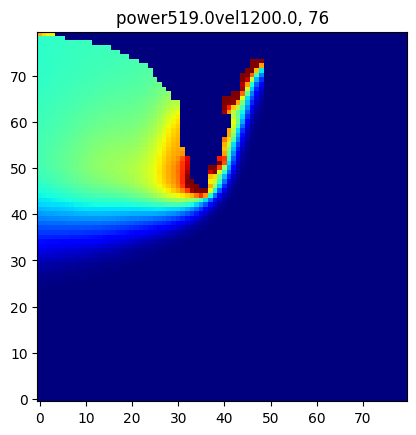

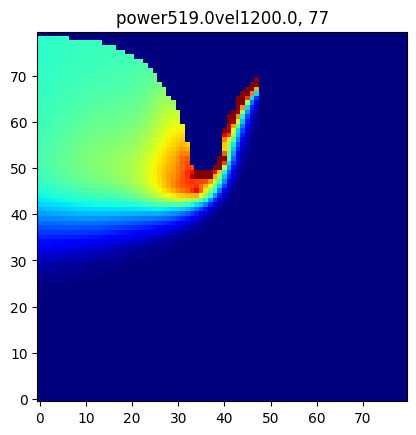

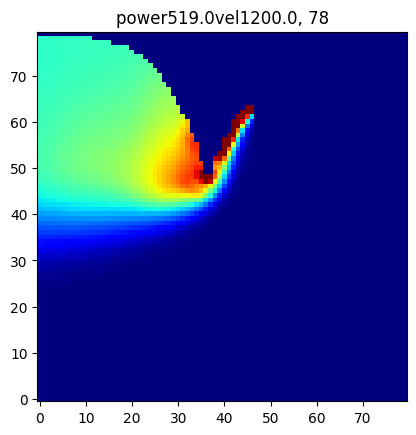

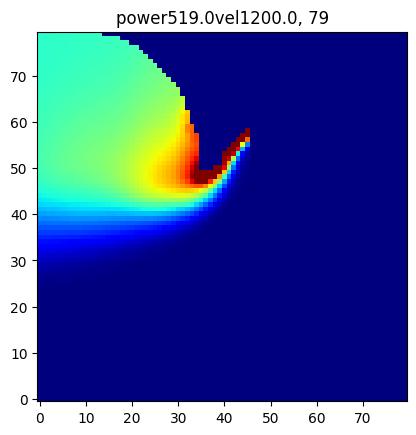

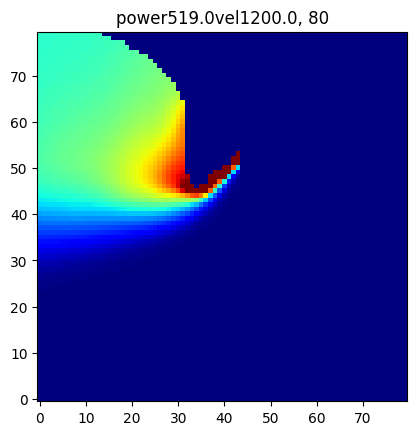

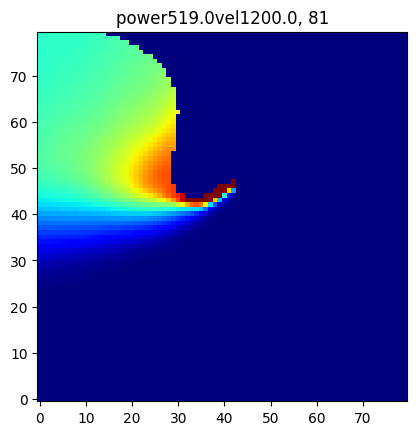

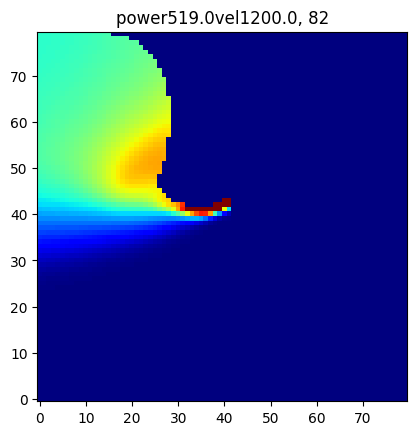

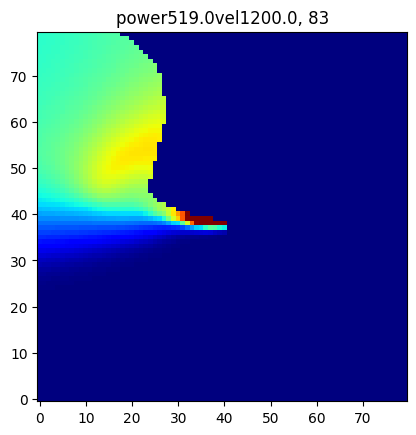

 89%|████████▉ | 2658/2970 [00:15<00:01, 169.19it/s]

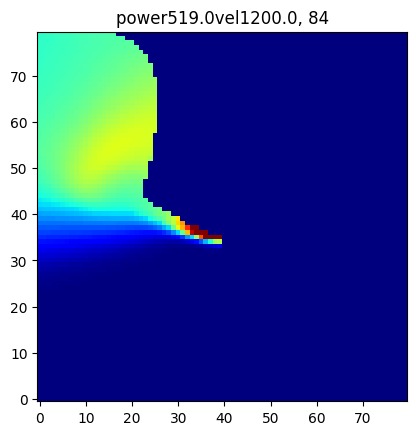

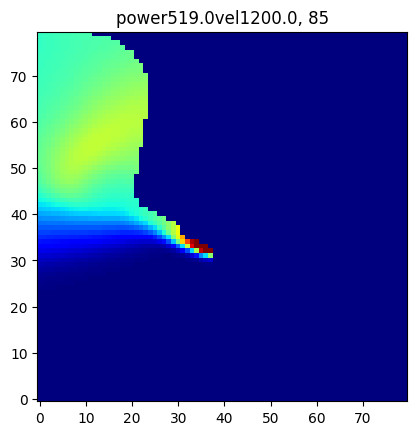

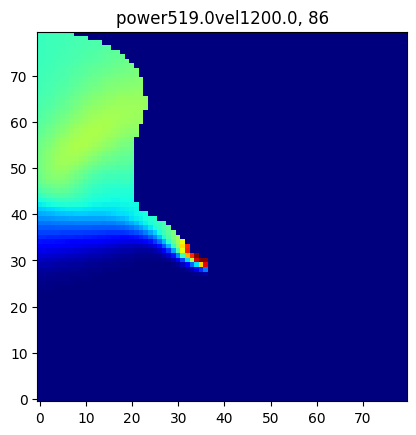

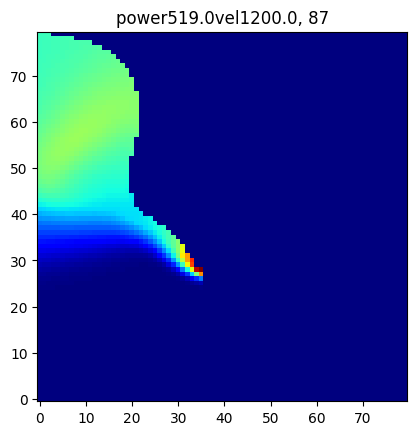

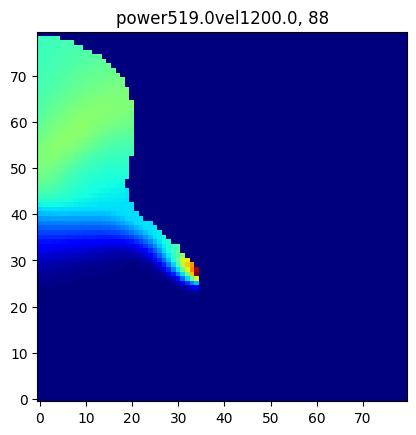

...

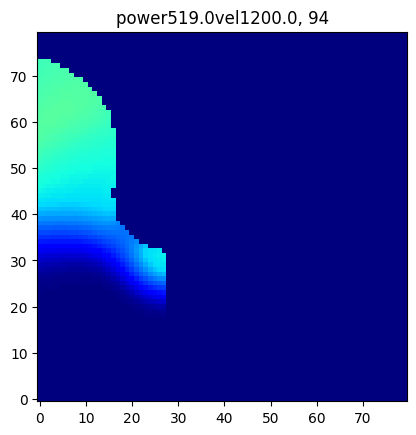

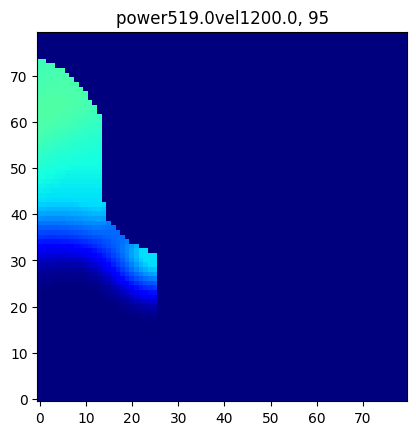

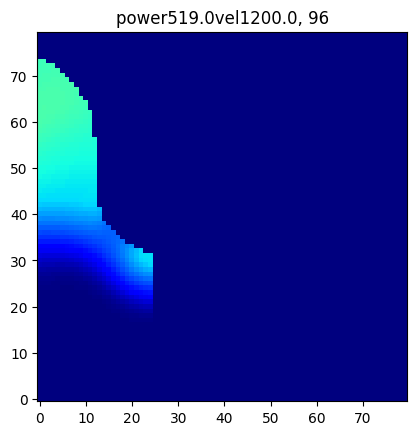

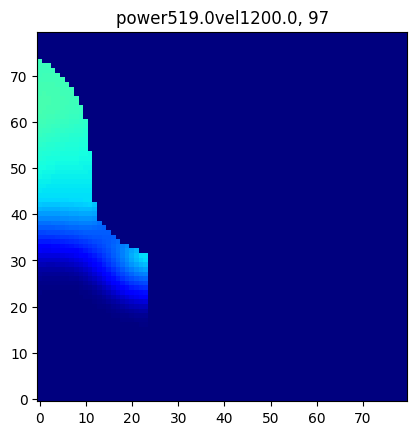

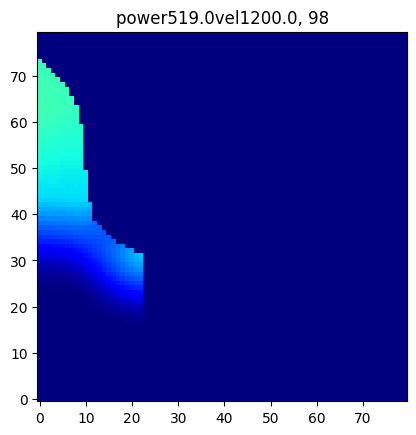

 95%|█████████▌| 2836/2970 [00:16<00:00, 160.26it/s]

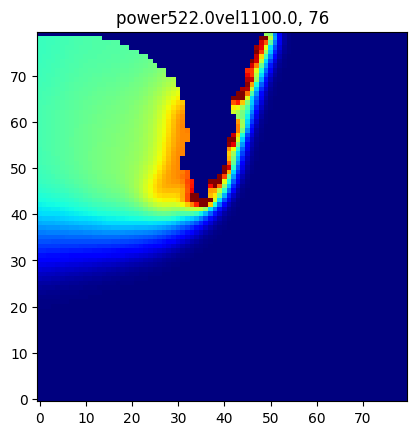

 99%|█████████▉| 2948/2970 [00:17<00:00, 211.64it/s]

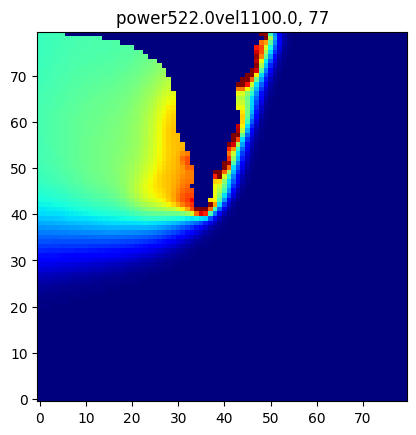

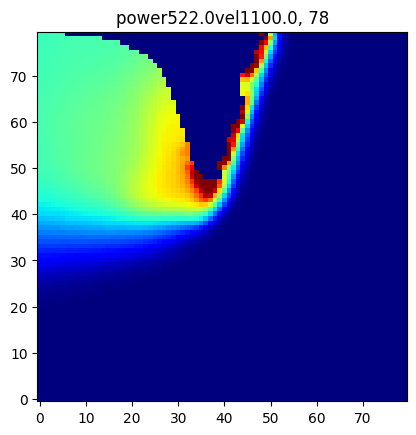

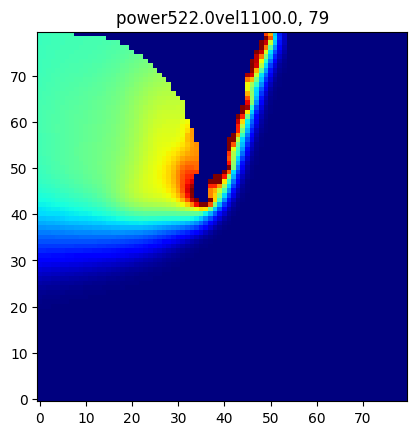

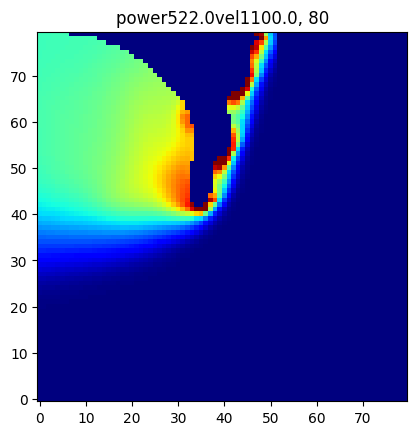

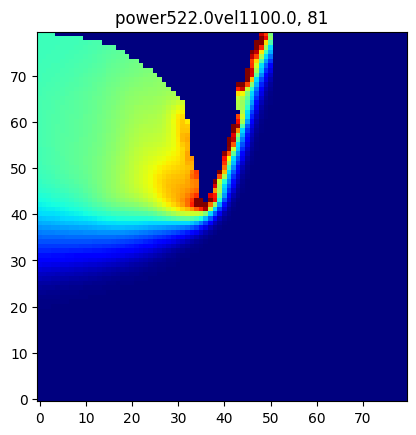

...

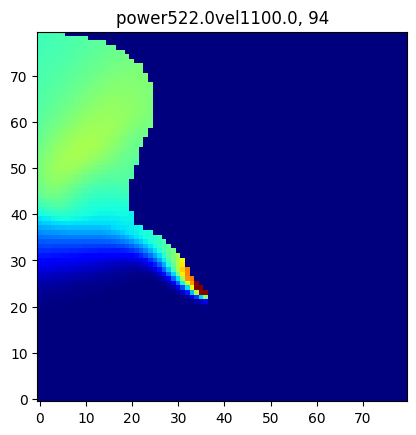

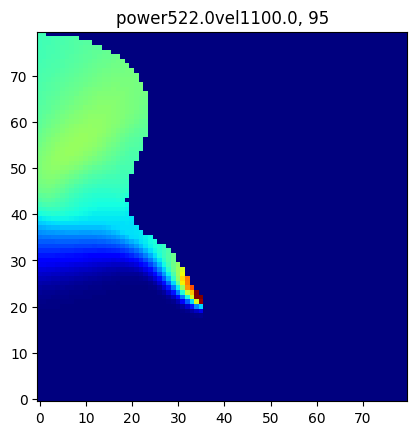

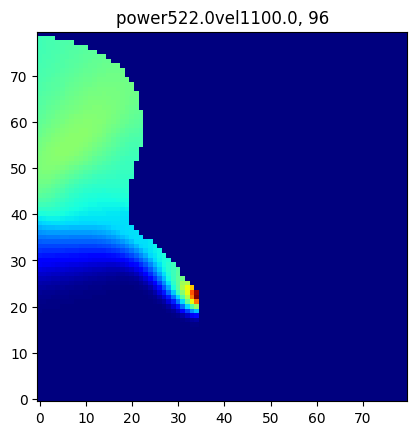

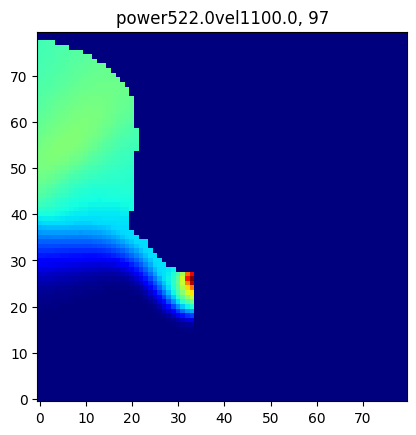

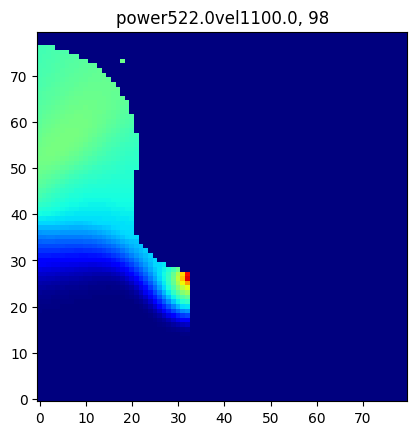

100%|██████████| 2970/2970 [00:19<00:00, 156.14it/s]


In [36]:
# np.min([len(diff_results_global[0][key]) for key in diff_results_global[0].keys()])
last_power = ''
for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(train_dataloader), total = len(train_dataloader)):  
    

    oldtime = time.time()

    # input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
    # input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,encoding = encode_bool,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
    # input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dev_dataloader.dataset)
    # input, result_diffusion, target = predict_modified_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,dataset =  train_dataset, timesteps = timesteps, schedule = 'linear')
    
    info = info[0] # info is technically returned with an extra dimension, this command removes it.
    time_elapsed = time.time()-oldtime
    # print(last_power)
    if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
        
        timestep = 0

        enc_depths_sim = []
        diff_depths_sim = []
        gt_depths_sim = []
        lr_depths_sim = []
        enc_kp_sim = []
        diff_kp_sim = []
        gt_kp_sim = []
        lr_kp_sim = []

    else:
        timestep += 1
    # print(last_power, 'power' + str(info[0].item()) + 'vel' + str(info[1].item()))
    last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  
    # profile_diff, kp_diff = get_profile(result_diffusion[0])
    # profile_gt, kp_gt = get_profile(target[0])
    # profile_enc, kp_enc = get_profile(result[0])
    # profile_lr, kp_lr = get_profile(input[0])
    if timestep > 75 and info[1].item() > 1000:
        plt.title(last_power + ', {}'.format(timestep))
        plt.imshow(train_dataloader.dataset.unscale_data(hr[0][0].detach().cpu().numpy(), input_type = 'hr')[0].T, origin = 'lower', vmin = 293, vmax = 5000, cmap = 'jet')
        plt.show()
        
    # break

In [144]:
last_power = ''
modeltype = 'Diffusion' # Defines part of the title of the image

test_diff_results_global = {}
skip = 50
for trial_key in range(10):
    test_enc_depths_sim = []
    test_diff_depths_sim = []
    test_gt_depths_sim = []
    test_lr_depths_sim = []
    test_enc_kp_sim = []
    test_diff_kp_sim = []
    test_gt_kp_sim = []
    test_lr_kp_sim = []
    test_gt_results = {}
    test_enc_results = {}
    test_diff_results = {}
    test_lr_results = {}
    for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(test_dataloader), total = len(test_dataloader)):  
    

        oldtime = time.time()

        input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
        input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,encoding = encode_bool,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
        # input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dev_dataloader.dataset)
        # input, result_diffusion, target = predict_modified_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,dataset =  train_dataset, timesteps = timesteps, schedule = 'linear')
        
        info = info[0] # info is technically returned with an extra dimension, this command removes it.
        time_elapsed = time.time()-oldtime
        # print(last_power)
        if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
            
            timestep = 0

            test_enc_depths_sim = []
            test_diff_depths_sim = []
            test_gt_depths_sim = []
            test_lr_depths_sim = []
            test_enc_kp_sim = []
            test_diff_kp_sim = []
            test_gt_kp_sim = []
            test_lr_kp_sim = []

        else:
            timestep += 1
        profile_diff, kp_diff = get_profile(result_diffusion[0])
        profile_gt, kp_gt = get_profile(target[0])
        profile_enc, kp_enc = get_profile(result[0])
        profile_lr, kp_lr = get_profile(input[0])

        test_enc_kp_sim.append(5*(80-np.min(kp_enc)))
        test_gt_kp_sim.append(5*(80-np.min(kp_gt)))
        test_diff_kp_sim.append(5*(80-np.min(kp_diff)))
        test_lr_kp_sim.append(20*(20 - np.min(kp_lr)))

        test_enc_depths_sim.append(5*(80-np.min(profile_enc)))
        test_gt_depths_sim.append(5*(80-np.min(profile_gt)))
        test_diff_depths_sim.append(5*(80-np.min(profile_diff)))
        test_lr_depths_sim.append(20*(20 - np.min(profile_lr)))
        last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  
        test_gt_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_gt_kp_sim
        test_enc_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_enc_kp_sim
        test_diff_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_diff_kp_sim
        test_lr_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = test_lr_kp_sim
        test_gt_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_gt_depths_sim
        test_enc_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_enc_depths_sim
        test_diff_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_diff_depths_sim
        test_lr_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = test_lr_depths_sim
    test_diff_results_global[trial_key] = test_diff_results
        # if batch_idx > 3:
        #     break
    # break

100%|██████████| 693/693 [03:33<00:00,  3.24it/s]


In [8]:
# diff_results_global
import pickle

# Sample dictionary

# Save the dictionary to a pickle file
# with open('train_diff_results.pkl', 'wb') as pickle_file:
#     pickle.dump(diff_results_global, pickle_file)
# with open('test_diff_results.pkl', 'wb') as pickle_file:
#     pickle.dump(test_diff_results_global, pickle_file)

# # To load the dictionary from the pickle file
with open('train_diff_results.pkl', 'rb') as pickle_file:
    diff_results_global = pickle.load(pickle_file)

# print(loaded_data)


In [9]:
diff_results_global

{0: {'key_power106.0vel700.0': [5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   10,
   5,
   5,
   5,
   5,
   5,
   10,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   10,
   5,
   5,
   5,
   5,
   10,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5,
   5],
  'depth_power106.0vel700.0': [10,
   10,
   10,
   15,
   15,
   15,
   15,
   15,
   15,
   15,
   15,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   15,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
   20,
 

In [41]:
last_power = ''
modeltype = 'Diffusion' # Defines part of the title of the image

test_diff_results_global = {}
skip = 50
for trial_key in range(2):
    test_enc_depths_sim = []
    test_diff_depths_sim = []
    test_gt_depths_sim = []
    test_lr_depths_sim = []
    test_enc_kp_sim = []
    test_diff_kp_sim = []
    test_gt_kp_sim = []
    test_lr_kp_sim = []
    test_gt_results = {}
    test_enc_results = {}
    test_diff_results = {}
    test_lr_results = {}
    for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(test_dataloader), total = len(test_dataloader)):  
    

        oldtime = time.time()

        input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
        input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,encoding = encode_bool,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
        # input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dev_dataloader.dataset)
        # input, result_diffusion, target = predict_modified_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,dataset =  train_dataset, timesteps = timesteps, schedule = 'linear')
        
        info = info[0] # info is technically returned with an extra dimension, this command removes it.
        time_elapsed = time.time()-oldtime
        # print(last_power)
        if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
            
            timestep = 0

            test_enc_depths_sim = []
            test_diff_depths_sim = []
            test_gt_depths_sim = []
            test_lr_depths_sim = []
            test_enc_kp_sim = []
            test_diff_kp_sim = []
            test_gt_kp_sim = []
            test_lr_kp_sim = []

        else:
            timestep += 1
        profile_diff, kp_diff = get_profile(result_diffusion[0])
        profile_gt, kp_gt = get_profile(target[0])
        profile_enc, kp_enc = get_profile(result[0])
        profile_lr, kp_lr = get_profile(input[0])

        test_enc_kp_sim.append(5*(80-np.min(kp_enc)))
        test_gt_kp_sim.append(5*(80-np.min(kp_gt)))
        test_diff_kp_sim.append(5*(80-np.min(kp_diff)))
        test_lr_kp_sim.append(20*(20 - np.min(kp_lr)))

        test_enc_depths_sim.append(5*(80-np.min(profile_enc)))
        test_gt_depths_sim.append(5*(80-np.min(profile_gt)))
        test_diff_depths_sim.append(5*(80-np.min(profile_diff)))
        test_lr_depths_sim.append(20*(20 - np.min(profile_lr)))
        last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  
        test_gt_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_gt_kp_sim
        test_enc_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_enc_kp_sim
        test_diff_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_diff_kp_sim
        test_lr_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = test_lr_kp_sim
        test_gt_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_gt_depths_sim
        test_enc_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_enc_depths_sim
        test_diff_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = test_diff_depths_sim
        test_lr_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = test_lr_depths_sim
    test_diff_results_global[trial_key] = test_diff_results
        # if batch_idx > 3:
        #     break
    # break

100%|██████████| 693/693 [03:35<00:00,  3.22it/s]


In [52]:
last_power = ''
modeltype = 'Diffusion' # Defines part of the title of the image

dev_diff_results_global = {}
skip = 50
for trial_key in range(3):
    dev_enc_depths_sim = []
    dev_diff_depths_sim = []
    dev_gt_depths_sim = []
    dev_lr_depths_sim = []
    dev_enc_kp_sim = []
    dev_diff_kp_sim = []
    dev_gt_kp_sim = []
    dev_lr_kp_sim = []
    dev_gt_results = {}
    dev_enc_results = {}
    dev_diff_results = {}
    dev_lr_results = {}
    for batch_idx, (res, hr, lr, upscaled_lr, info) in tqdm(enumerate(dev_dataloader), total = len(dev_dataloader)):  
    

        oldtime = time.time()

        input, result, target = predict_lrenc(lr_enc,res, hr, lr, upscaled_lr, train_dataset)
        input, result_diffusion, target, _, _ = predict_modified_ddim_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,encoding = encode_bool,dataset =  train_dataset,seq= None, timesteps = timesteps,skip = skip, schedule = 'linear')
        # input, result_diffusion, target = predict_refactored_diffusion(diff_model, lr_enc, res, hr, lr, upscaled_lr, dev_dataloader.dataset)
        # input, result_diffusion, target = predict_modified_diffusion(diff_model.model, lr_enc, res, hr, lr, upscaled_lr,dataset =  train_dataset, timesteps = timesteps, schedule = 'linear')
        
        info = info[0] # info is technically returned with an extra dimension, this command removes it.
        time_elapsed = time.time()-oldtime
        # print(last_power)
        if last_power != 'power' + str(info[0].item()) + 'vel' + str(info[1].item()):
            
            timestep = 0

            dev_enc_depths_sim = []
            dev_diff_depths_sim = []
            dev_gt_depths_sim = []
            dev_lr_depths_sim = []
            dev_enc_kp_sim = []
            dev_diff_kp_sim = []
            dev_gt_kp_sim = []
            dev_lr_kp_sim = []

        else:
            timestep += 1
        profile_diff, kp_diff = get_profile(result_diffusion[0])
        profile_gt, kp_gt = get_profile(target[0])
        profile_enc, kp_enc = get_profile(result[0])
        profile_lr, kp_lr = get_profile(input[0])

        dev_enc_kp_sim.append(5*(80-np.min(kp_enc)))
        dev_gt_kp_sim.append(5*(80-np.min(kp_gt)))
        dev_diff_kp_sim.append(5*(80-np.min(kp_diff)))
        dev_lr_kp_sim.append(20*(20 - np.min(kp_lr)))

        dev_enc_depths_sim.append(5*(80-np.min(profile_enc)))
        dev_gt_depths_sim.append(5*(80-np.min(profile_gt)))
        dev_diff_depths_sim.append(5*(80-np.min(profile_diff)))
        dev_lr_depths_sim.append(20*(20 - np.min(profile_lr)))
        last_power = 'power' + str(info[0].item()) + 'vel' + str(info[1].item())  
        dev_gt_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = dev_gt_kp_sim
        dev_enc_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = dev_enc_kp_sim
        dev_diff_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = dev_diff_kp_sim
        dev_lr_results['key_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = dev_lr_kp_sim
        dev_gt_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = dev_gt_depths_sim
        dev_enc_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = dev_enc_depths_sim
        dev_diff_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item()) ] = dev_diff_depths_sim
        dev_lr_results['depth_power' + str(info[0].item()) + 'vel' + str(info[1].item())] = dev_lr_depths_sim
    dev_diff_results_global[trial_key] = dev_diff_results

100%|██████████| 396/396 [02:01<00:00,  3.26it/s]


In [10]:
gt_kps = []
enc_kps = []
lr_kps = []
diff_kps = []
diff_kps_std = []

gt_mps = []
enc_mps = []
diff_mps = []
diff_mpstd = []

lr_mps = []
kp_powers =[]
kp_velocities = []
mp_powers =[]
mp_velocities = []
j = 75
for key in lr_results.keys():
    print(key, gt_results.keys())
    if 'depth' in key:
        parameters = key.split('depth_power')[-1].split('vel')
        mp_powers.append(float(parameters[0]))
        mp_velocities.append(float(parameters[1]))
        gt_mp = gt_results[key][j]
        
        diff_mp_mean = np.mean([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])
        diff_mp_std = np.std([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])

        enc_mp  = enc_results[key][j]
        lr_mp =  lr_results[key][j]
        lr_mps.append(lr_mp)
        gt_mps.append(gt_mp)
        enc_mps.append(enc_mp)
        diff_mps.append(diff_mp_mean)
        diff_mpstd.append(diff_mp_std)

        
    if 'key' in key:
        parameters = key.split('key_power')[-1].split('vel')
        kp_powers.append(float(parameters[0]))
        kp_velocities.append(float(parameters[1]))
        # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
        # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
        # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
        # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
        
        gt_kp = gt_results[key][j]
        diff_kp = diff_results[key][j]
        enc_kp  = enc_results[key][j]
        lr_kp =  lr_results[key][j]
        diff_kp_mean = np.mean([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])
        diff_kp_std = np.std([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])

        lr_kps.append(lr_kp)
        gt_kps.append(gt_kp)
        enc_kps.append(enc_kp)
        # diff_kps.append(diff_kp)
        diff_kps_std.append(diff_kp_std)
        diff_kps.append(diff_kp_mean)

        # gt_kps.append(gt_kp)
        # enc_kps.append(enc_kp)
        # diff_kps.append(diff_kp)
    # print(len(diff_amps))
        # parameters = key.split('key_power')[-1].split('vel')
       

NameError: name 'lr_results' is not defined

In [80]:
test_gt_kps = []
test_enc_kps = []
test_lr_kps = []
test_diff_kps = []
test_diff_kps_std = []

test_gt_mps = []
test_enc_mps = []
test_diff_mps = []
test_diff_mps_std = []

test_lr_mps = []
test_kp_powers =[]
test_kp_velocities = []
test_mp_powers =[]
test_mp_velocities = []
j = 79
for key in test_diff_results_global[0].keys():
    print(key, test_gt_results.keys())
    if 'depth' in key:
        parameters = key.split('depth_power')[-1].split('vel')
        test_mp_powers.append(float(parameters[0]))
        test_mp_velocities.append(float(parameters[1]))
        gt_mp = test_gt_results[key][j]
        diff_mp = test_diff_results[key][j]
        enc_mp  = test_enc_results[key][j]
        lr_mp =  test_lr_results[key][j]
        diff_mp_std = np.std([test_diff_results_global[trial_key][key][j] for trial_key in range(len(test_diff_results_global.keys()))])
        diff_mp_mean = np.mean([test_diff_results_global[trial_key][key][j] for trial_key in range(len(test_diff_results_global.keys()))])
        test_diff_mps_std.append(diff_mp_std)
        test_lr_mps.append(lr_mp)
        test_gt_mps.append(gt_mp)
        test_enc_mps.append(enc_mp)
        test_diff_mps.append(diff_mp_mean)
        
    if 'key' in key:
        parameters = key.split('key_power')[-1].split('vel')
        test_kp_powers.append(float(parameters[0]))
        test_kp_velocities.append(float(parameters[1]))
        # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
        # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
        # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
        # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
        
        gt_kp = test_gt_results[key][j]
        diff_kp = test_diff_results[key][j]
        enc_kp  = test_enc_results[key][j]
        lr_kp =  test_lr_results[key][j]
        # print(test_diff_results_global[trial_key].keys(), key)
        diff_kp_std = np.std([test_diff_results_global[trial_key][key][j] for trial_key in range(len(test_diff_results_global.keys()))])
        diff_kp_mean = np.mean([test_diff_results_global[trial_key][key][j] for trial_key in range(len(test_diff_results_global.keys()))])
        test_lr_kps.append(lr_kp)
        test_gt_kps.append(gt_kp)
        test_enc_kps.append(enc_kp)
        test_diff_kps.append(diff_kp_mean)
        test_diff_kps_std.append(diff_kp_std)

        
        # gt_kps.append(gt_kp)
        # enc_kps.append(enc_kp)
        # diff_kps.append(diff_kp)
    # print(len(diff_amps))
        # parameters = key.split('key_power')[-1].split('vel')
       

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

In [53]:
dev_gt_kps = []
dev_enc_kps = []
dev_lr_kps = []
dev_diff_kps = []
dev_diff_kps_std = []

dev_gt_mps = []
dev_enc_mps = []
dev_diff_mps = []
dev_diff_mps_std = []

dev_lr_mps = []
dev_kp_powers =[]
dev_kp_velocities = []
dev_mp_powers =[]
dev_mp_velocities = []
j = 91
for key in dev_diff_results_global[0].keys():
    print(key, dev_gt_results.keys())
    if 'depth' in key:
        parameters = key.split('depth_power')[-1].split('vel')
        dev_mp_powers.append(float(parameters[0]))
        dev_mp_velocities.append(float(parameters[1]))
        gt_mp = dev_gt_results[key][j]
        diff_mp = dev_diff_results[key][j]
        enc_mp  = dev_enc_results[key][j]
        lr_mp =  dev_lr_results[key][j]
        diff_mp_std = np.std([dev_diff_results_global[trial_key][key][-1] for trial_key in range(len(dev_diff_results_global.keys()))])
        diff_mp_mean = np.mean([dev_diff_results_global[trial_key][key][-1] for trial_key in range(len(dev_diff_results_global.keys()))])
        dev_diff_mps_std.append(diff_mp_std)
        dev_lr_mps.append(lr_mp)
        dev_gt_mps.append(gt_mp)
        dev_enc_mps.append(enc_mp)
        dev_diff_mps.append(diff_mp_mean)
        
    if 'key' in key:
        parameters = key.split('key_power')[-1].split('vel')
        dev_kp_powers.append(float(parameters[0]))
        dev_kp_velocities.append(float(parameters[1]))
        # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
        # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
        # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
        # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
        
        gt_kp = dev_gt_results[key][j]
        diff_kp = dev_diff_results[key][j]
        enc_kp  = dev_enc_results[key][j]
        lr_kp =  dev_lr_results[key][j]
        print(dev_diff_results_global[trial_key].keys(), key)
        diff_kp_std = np.std([dev_diff_results_global[trial_key][key][j] for trial_key in range(len(dev_diff_results_global.keys()))])
        diff_kp_mean = np.mean([dev_diff_results_global[trial_key][key][j] for trial_key in range(len(dev_diff_results_global.keys()))])
        dev_lr_kps.append(lr_kp)
        dev_gt_kps.append(gt_kp)
        dev_enc_kps.append(enc_kp)
        dev_diff_kps.append(diff_kp_mean)
        dev_diff_kps_std.append(diff_kp_std)

        
        # gt_kps.append(gt_kp)
        # enc_kps.append(enc_kp)
        # diff_kps.append(diff_kp)
    # print(len(diff_amps))
        # parameters = key.split('key_power')[-1].split('vel')
       

key_power209.0vel700.0 dict_keys(['key_power209.0vel700.0', 'depth_power209.0vel700.0', 'key_power262.0vel1200.0', 'depth_power262.0vel1200.0', 'key_power313.0vel900.0', 'depth_power313.0vel900.0', 'key_power365.0vel1200.0', 'depth_power365.0vel1200.0'])
dict_keys(['key_power209.0vel700.0', 'depth_power209.0vel700.0', 'key_power262.0vel1200.0', 'depth_power262.0vel1200.0', 'key_power313.0vel900.0', 'depth_power313.0vel900.0', 'key_power365.0vel1200.0', 'depth_power365.0vel1200.0']) key_power209.0vel700.0
depth_power209.0vel700.0 dict_keys(['key_power209.0vel700.0', 'depth_power209.0vel700.0', 'key_power262.0vel1200.0', 'depth_power262.0vel1200.0', 'key_power313.0vel900.0', 'depth_power313.0vel900.0', 'key_power365.0vel1200.0', 'depth_power365.0vel1200.0'])
key_power262.0vel1200.0 dict_keys(['key_power209.0vel700.0', 'depth_power209.0vel700.0', 'key_power262.0vel1200.0', 'depth_power262.0vel1200.0', 'key_power313.0vel900.0', 'depth_power313.0vel900.0', 'key_power365.0vel1200.0', 'depth_

In [ ]:
diff_results_global.keys()))])

        test_lr_kps.append(lr_kp)
        test_gt_kps.append(gt_kp)
        test_enc_kps.append(enc_kp)
        test_diff_kps.append(diff_kp)
        
        # gt_kps.append(gt_kp)
        # enc_kps.append(enc_kp)
        # diff_kps.append(diff_kp)
    # print(len(diff_amps))
        # parameters = key.split('key_power')[-1].split('vel')
       

In [31]:
# test_lr_results.keys()
# test_diff_kps
diff_mp_std

2.5

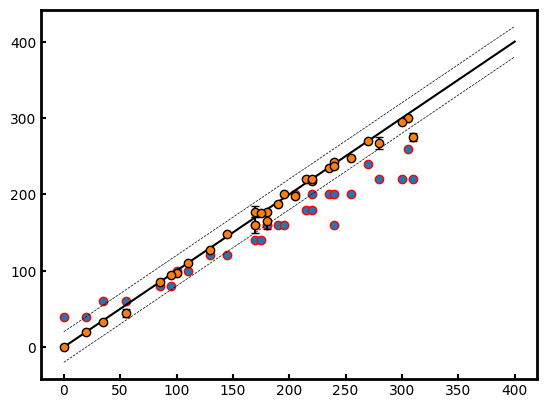

In [12]:
# mp_powers
# mp_velocities
# lr_results.keys()
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
cs = [color for color in colors[:3]]

plt.scatter(gt_mps, lr_mps, c= cs[0], edgecolor = 'r')
# plt.errorbar(gt_mps, diff_mps, yerr = diff_mp_std, c= cs[1], edgecolor = 'r')
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.errorbar(gt_mps, diff_mps, yerr=diff_mpstd, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1])

# plt.scatter(test_gt_mps, test_lr_mps, c = cs[0], marker = 's', edgecolor = 'k')
# plt.errorbar(test_gt_mps, test_diff_mps, yerr = diff_mp_std, c = cs[1], marker = 's', edgecolor = 'k')
# plt.scatter(test_gt_mps, test_enc_mps, c = cs[2], marker = 's')
plt.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
plt.plot([0, 400], [0, 400], 'k')
plt.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
frame_tick()



In [82]:
len(diff_results_global)#[trial_key]

2

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

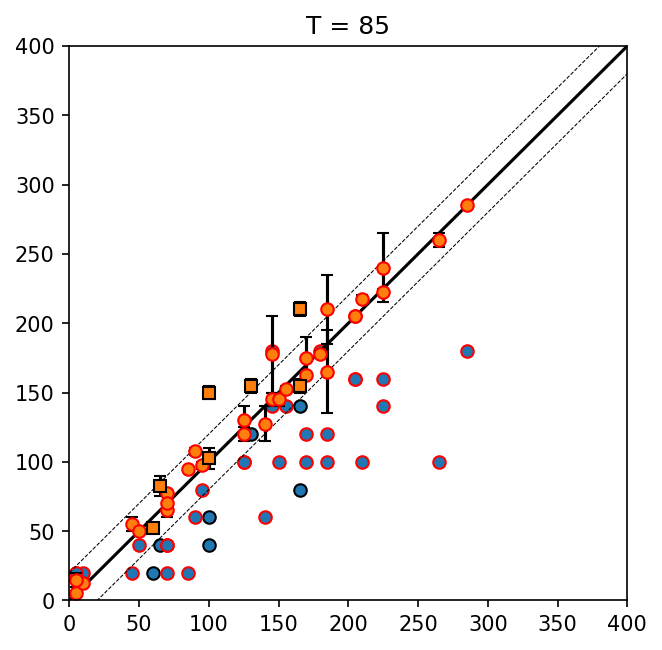

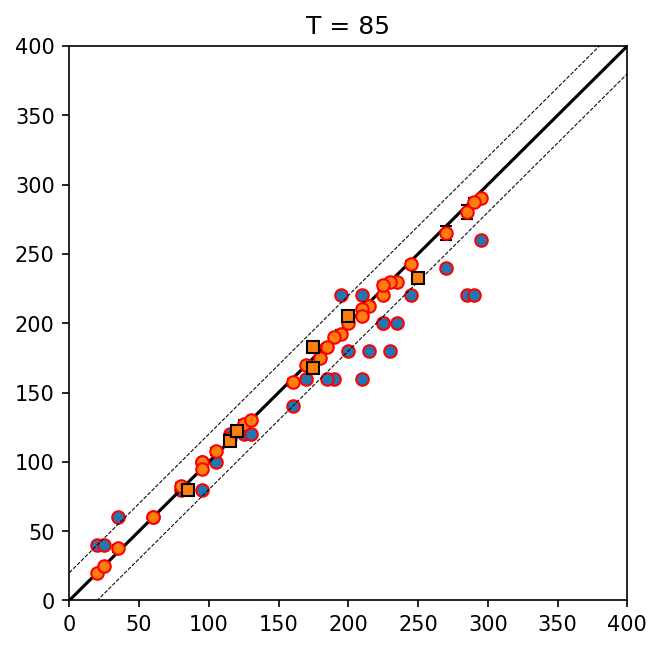

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

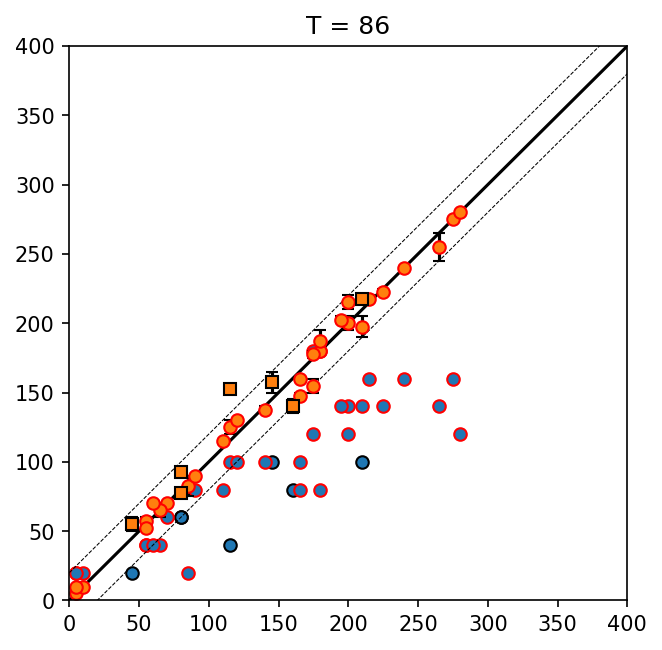

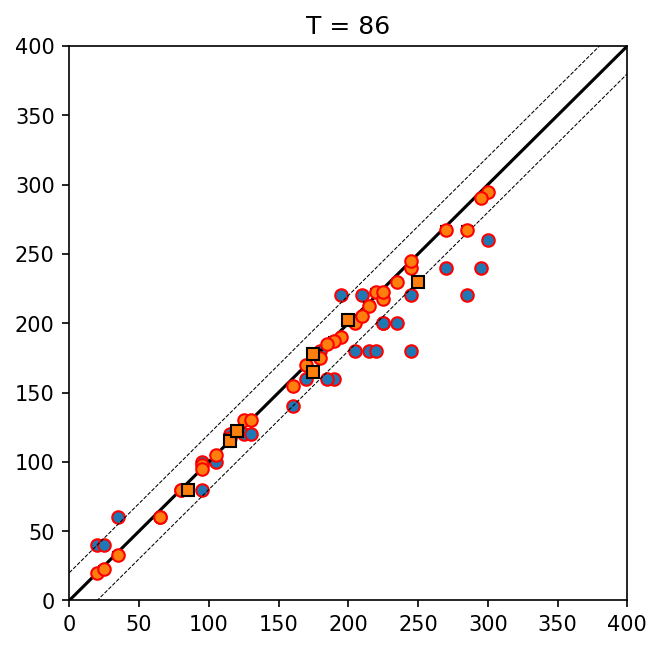

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

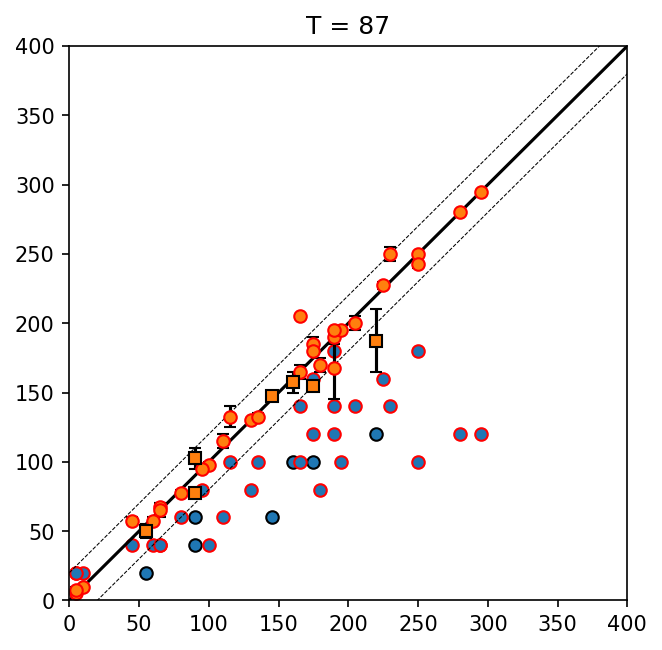

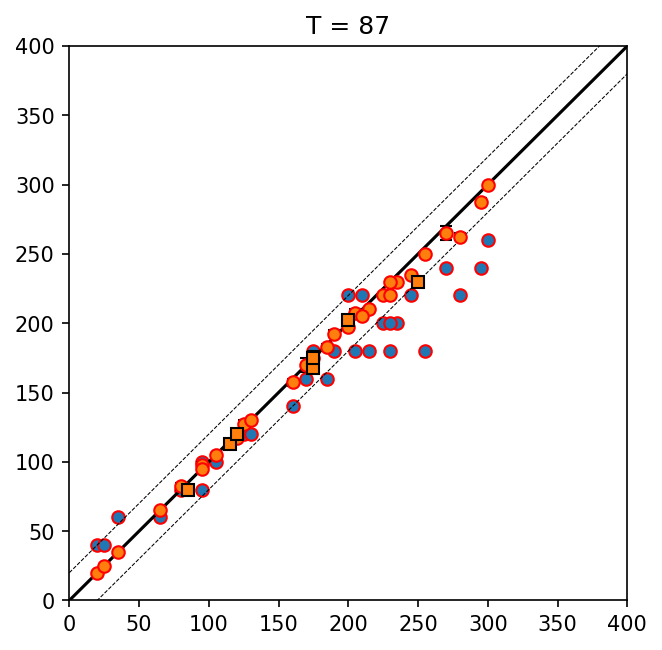

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

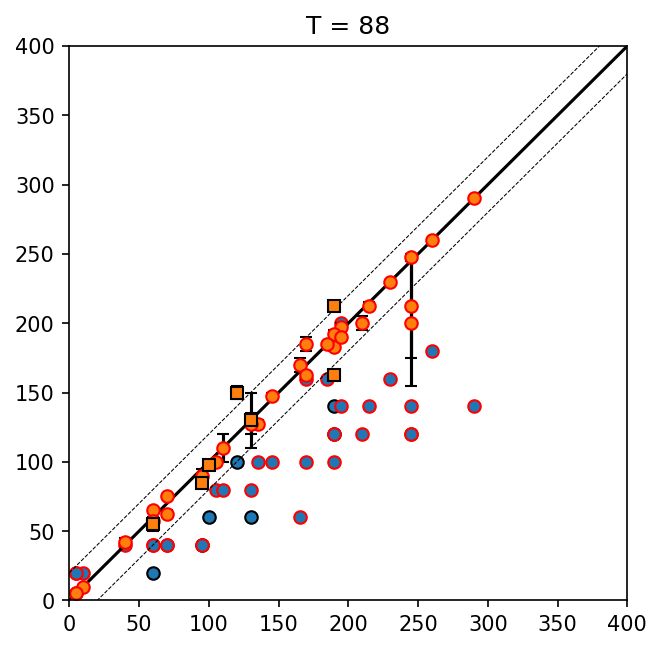

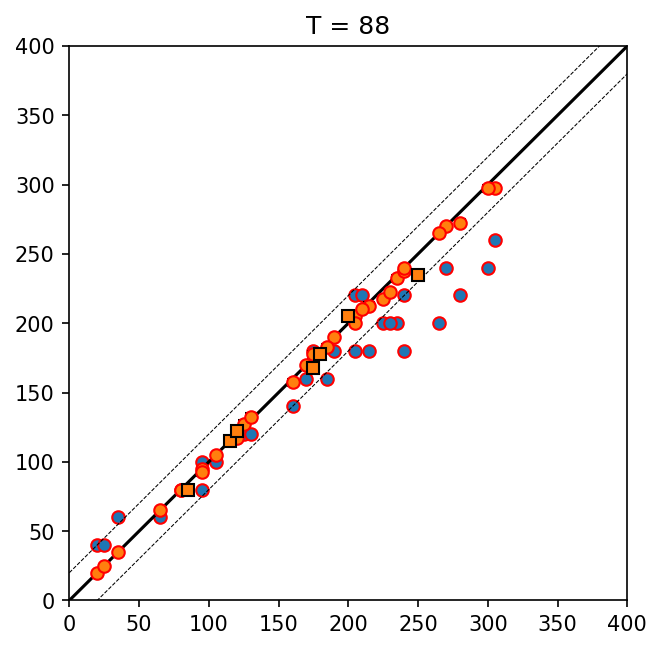

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

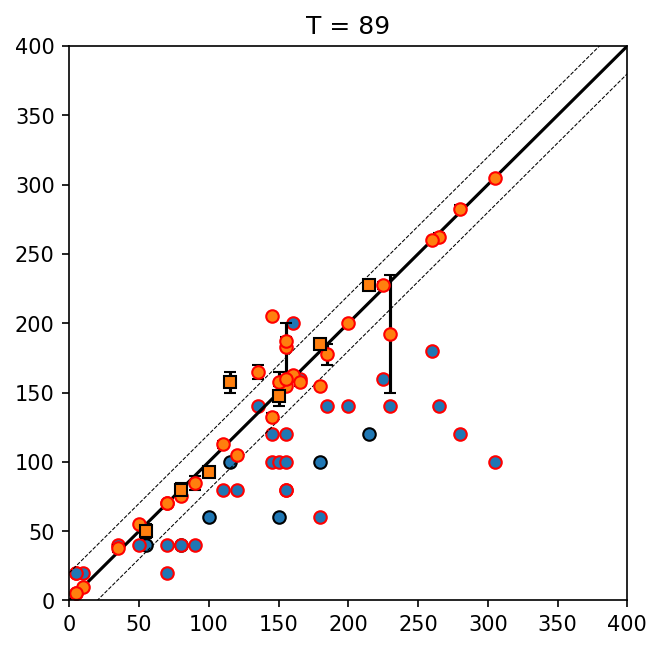

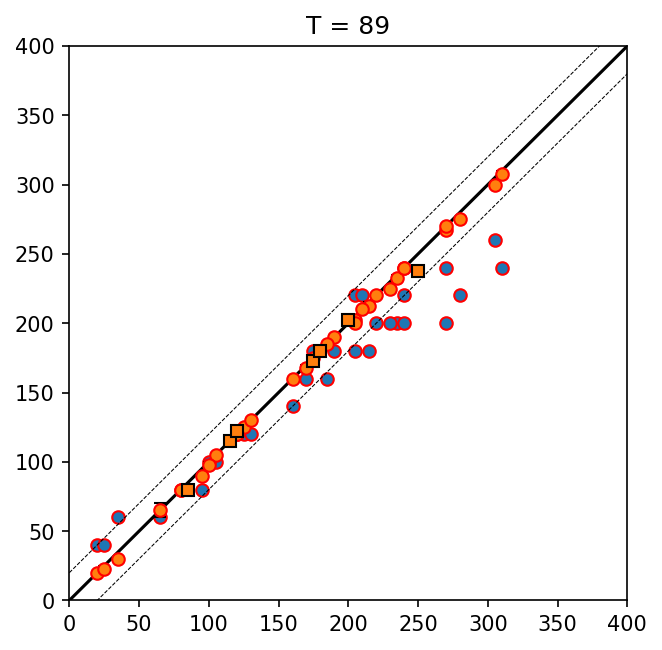

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

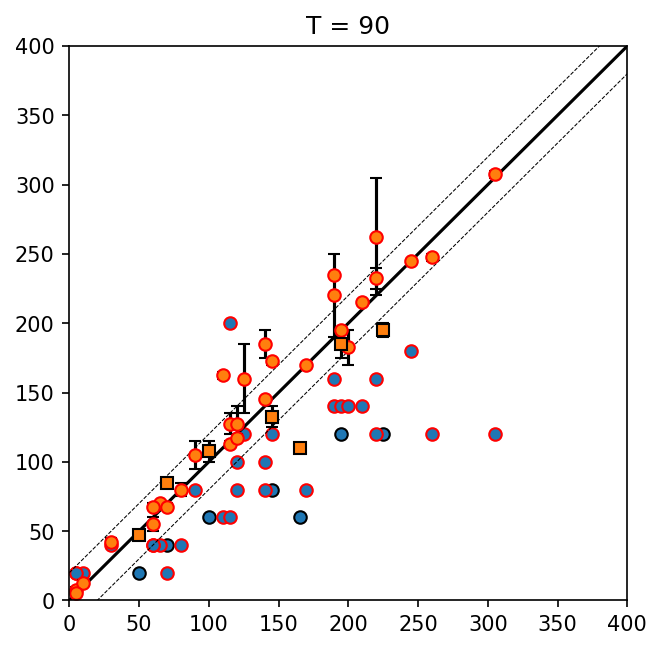

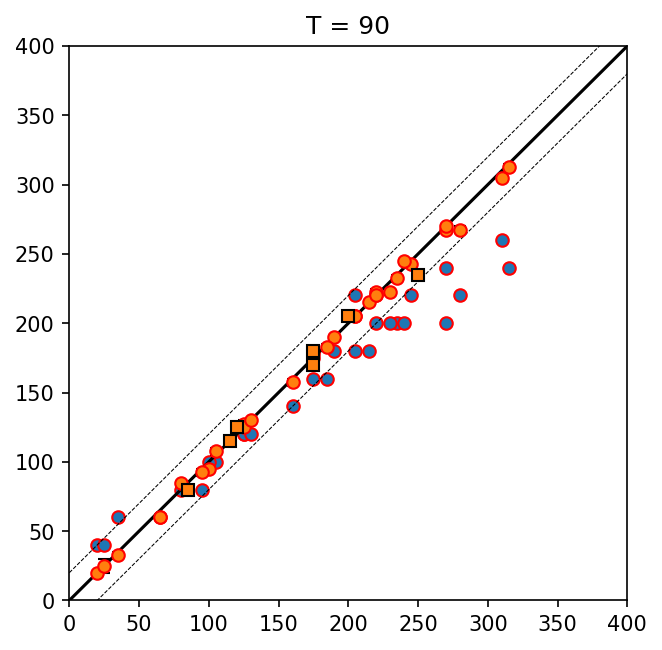

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

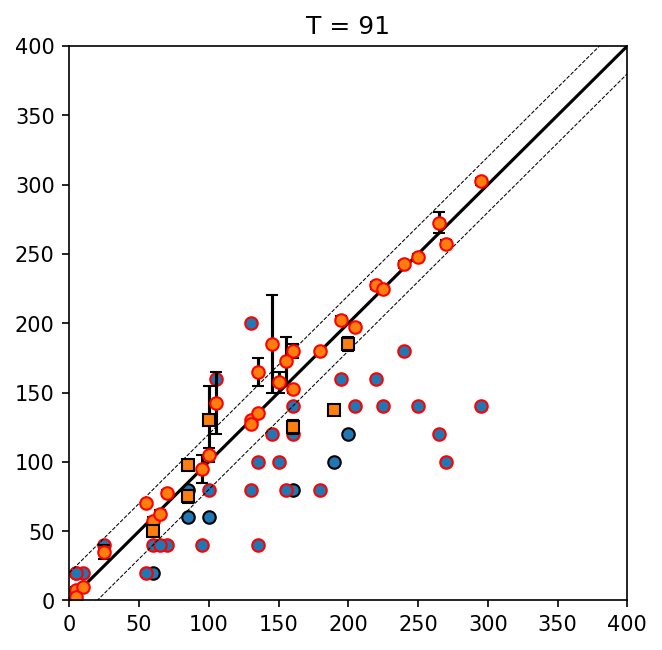

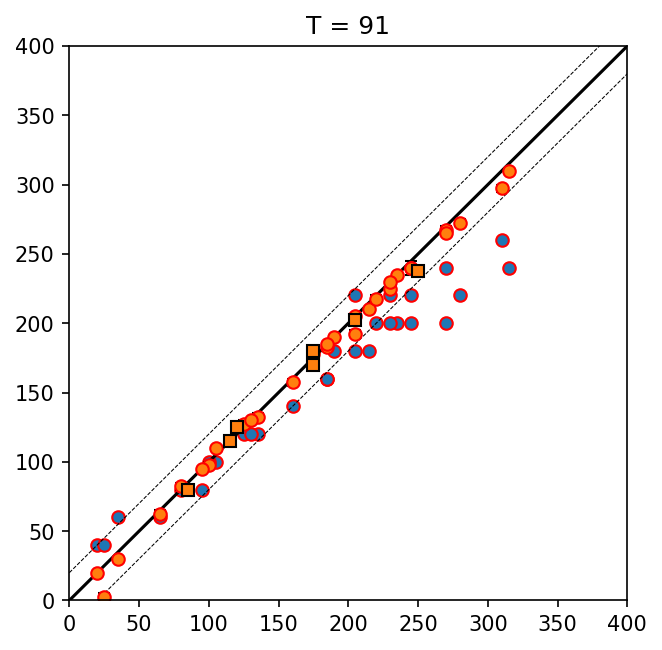

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

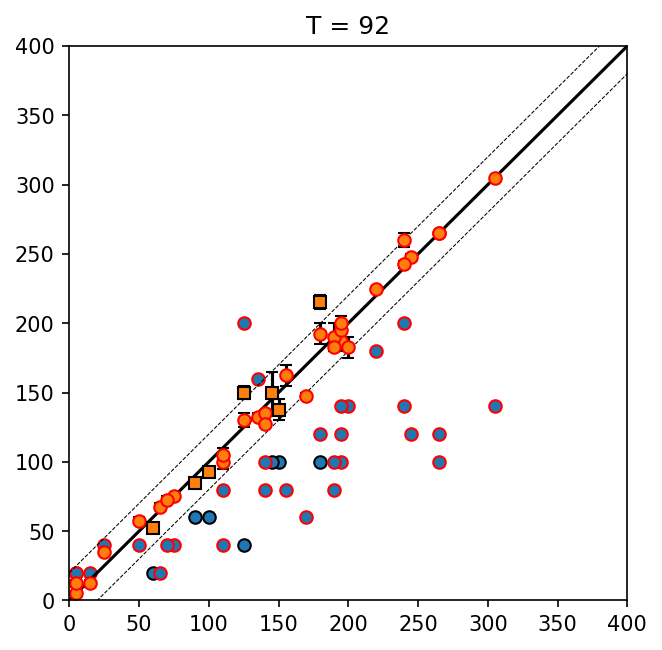

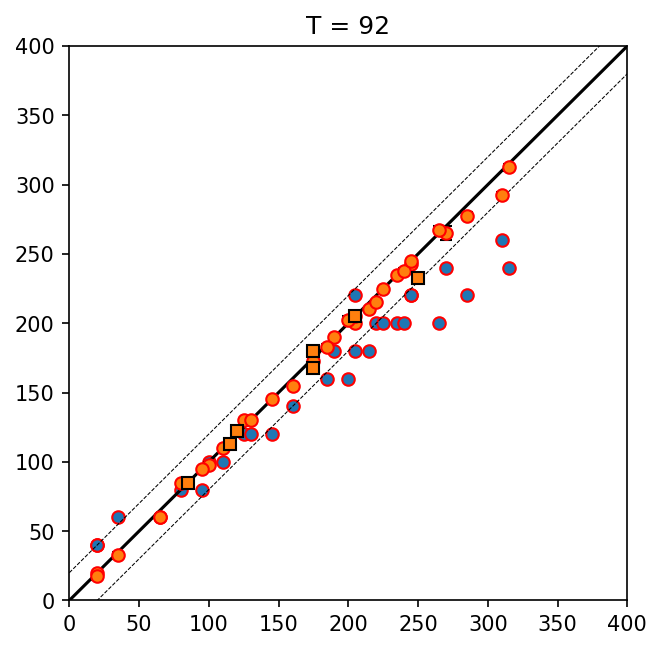

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

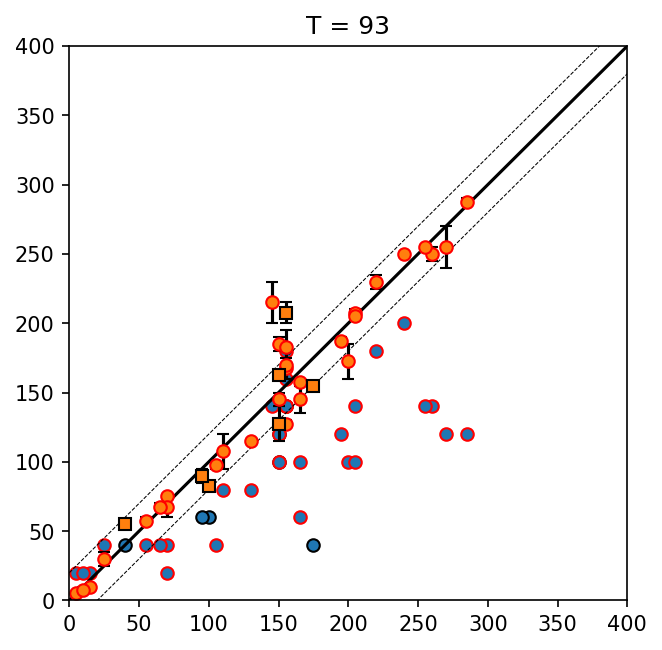

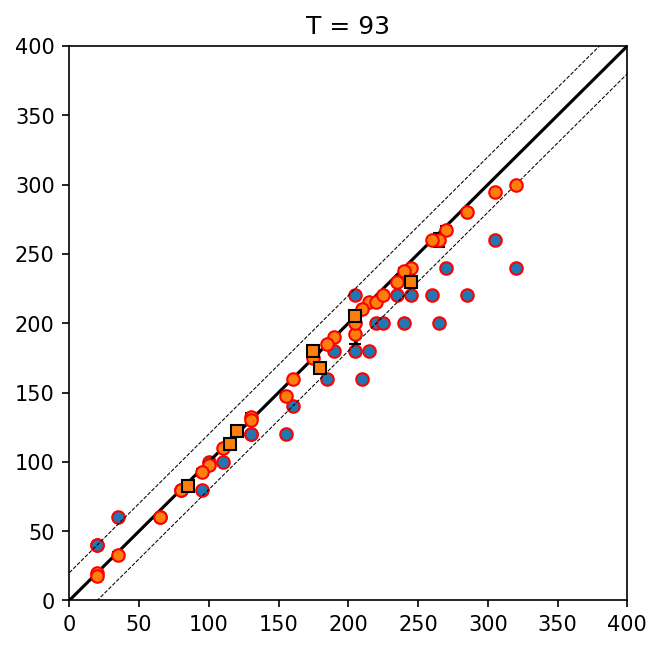

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

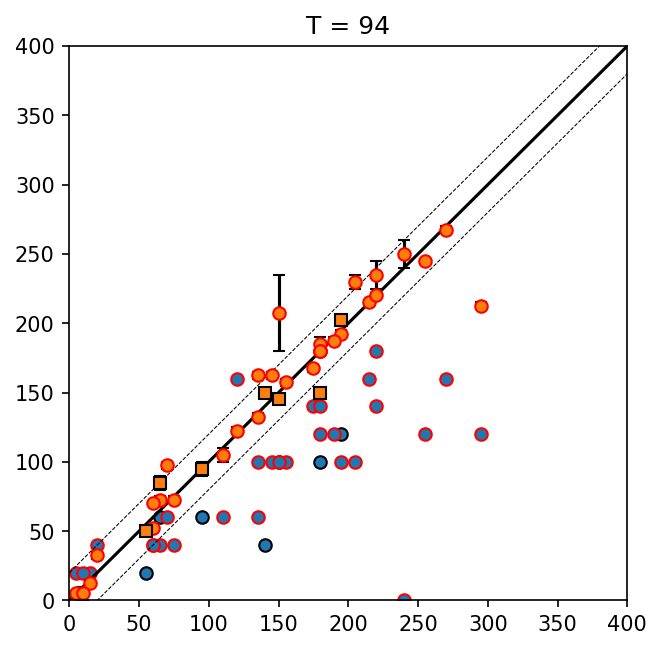

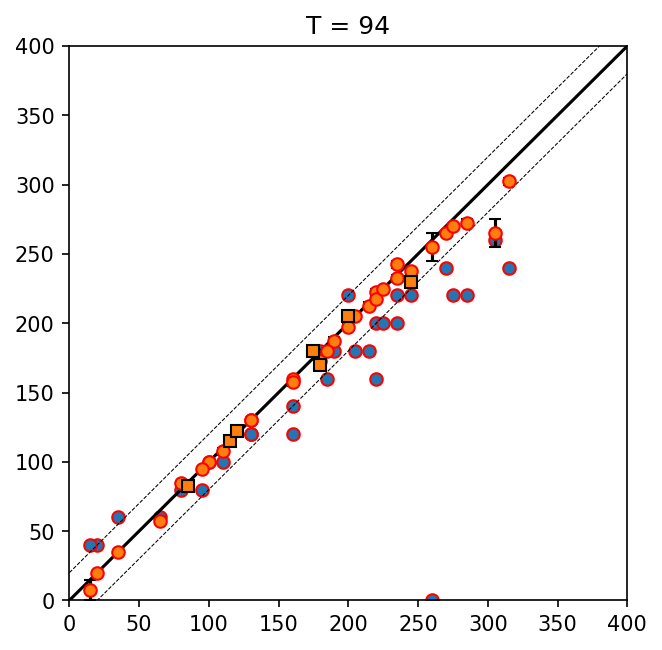

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

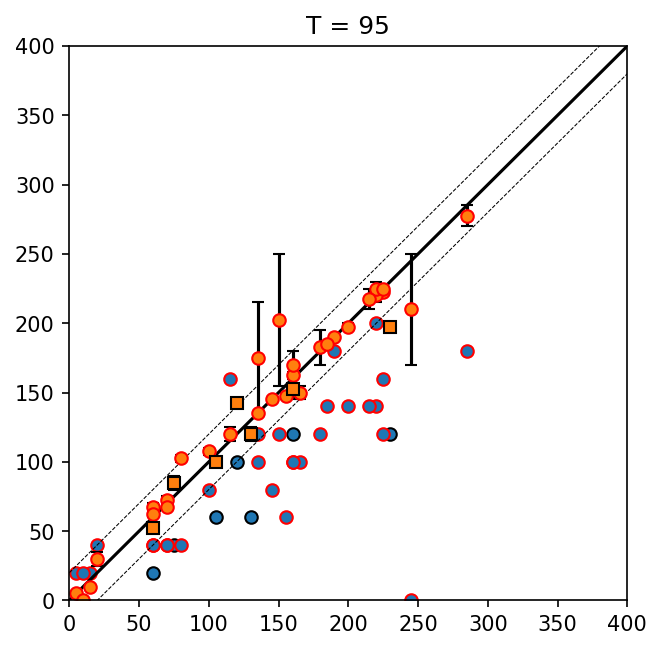

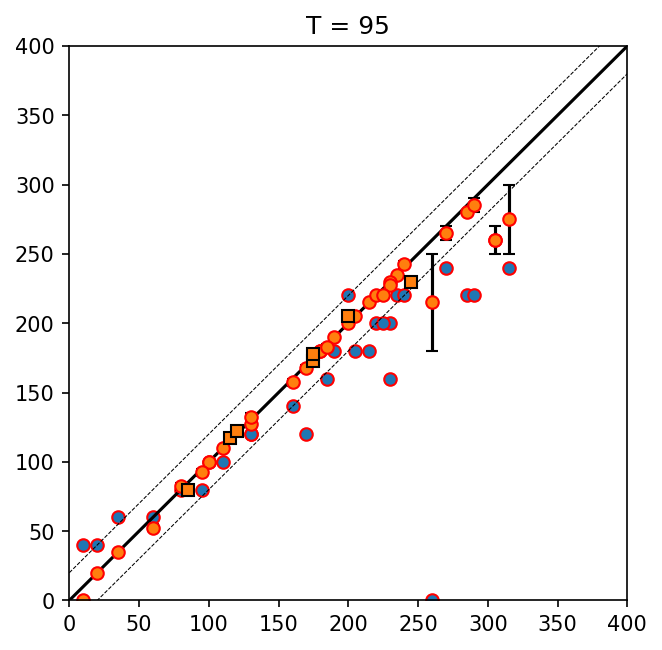

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

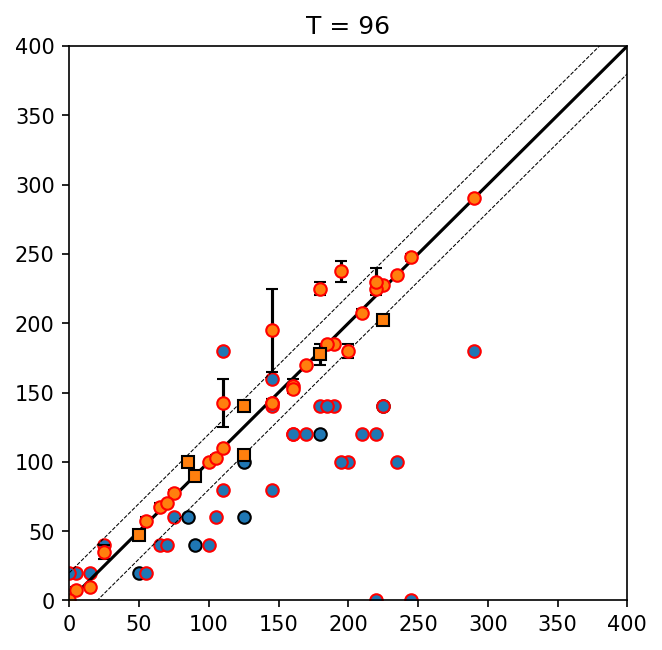

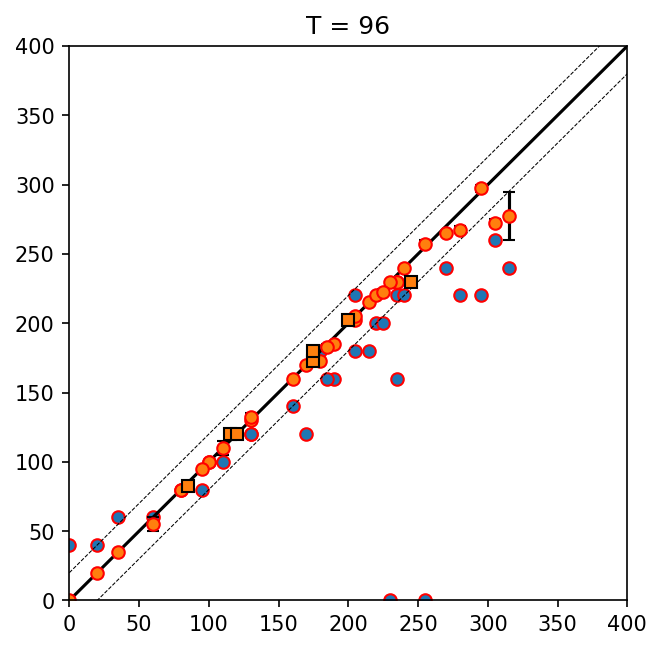

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

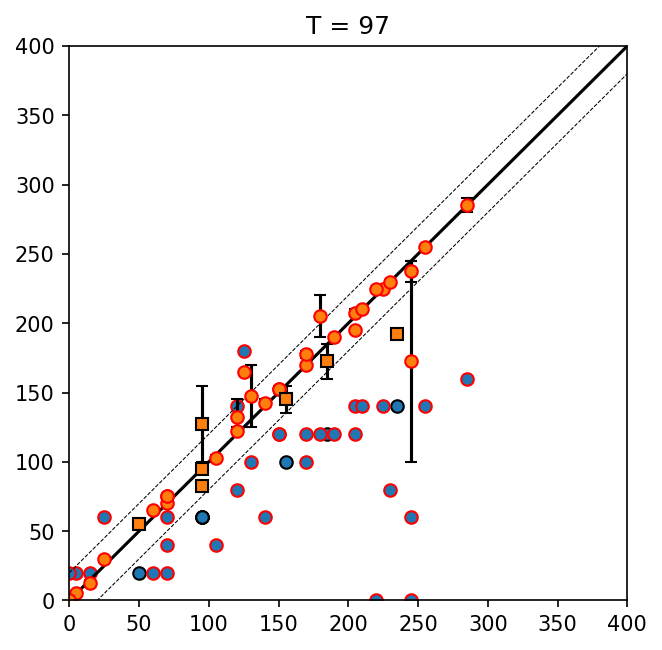

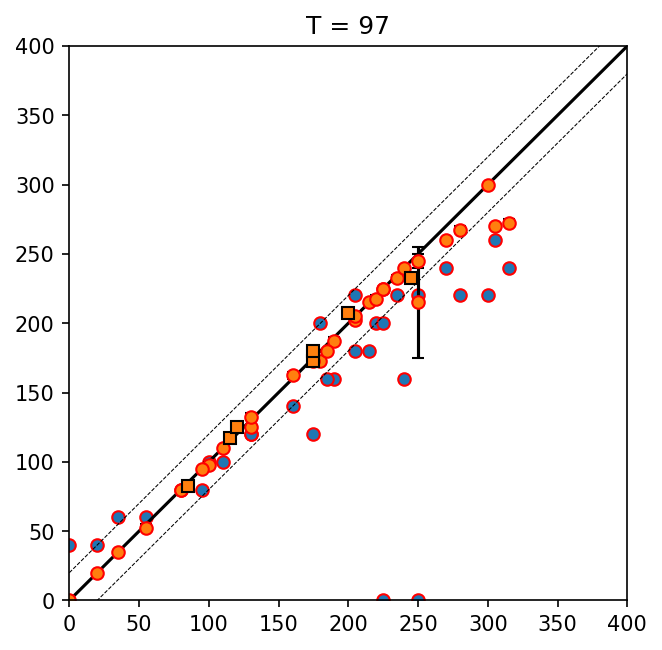

key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'dep

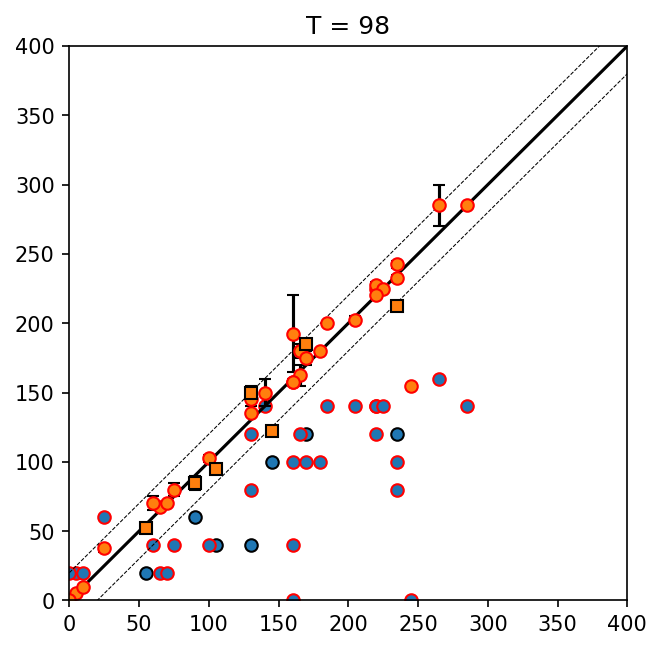

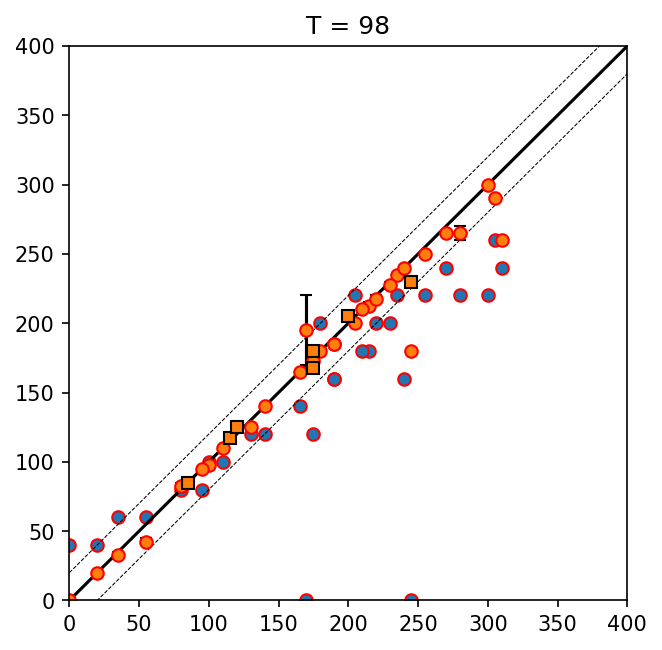

In [81]:
buffer = 1
for j in range(85, 99):
    plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)

    gt_kps = []
    enc_kps = []
    lr_kps = []
    diff_kps = []
    diff_kps_std = []

    gt_mps = []
    enc_mps = []
    diff_mps = []
    diff_mpstd = []

    lr_mps = []
    kp_powers =[]
    kp_velocities = []
    mp_powers =[]
    mp_velocities = []
    for key in lr_results.keys():
        # print(key, gt_results.keys())
        if 'depth' in key:
            parameters = key.split('depth_power')[-1].split('vel')
            mp_powers.append(float(parameters[0]))
            mp_velocities.append(float(parameters[1]))
            gt_mp = gt_results[key][j-buffer:j]
            
            diff_mp_mean = np.mean([diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(diff_results_global.keys()))])
            diff_mp_std = np.std([diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(diff_results_global.keys()))])

            enc_mp  = np.mean(enc_results[key][j-buffer:j])
            lr_mp =  np.mean(lr_results[key][j-buffer:j])
            lr_mps.append(lr_mp)
            gt_mps.append(gt_mp)
            enc_mps.append(enc_mp)
            diff_mps.append(diff_mp_mean)
            diff_mpstd.append(diff_mp_std)

            
        if 'key' in key:
            parameters = key.split('key_power')[-1].split('vel')
            kp_powers.append(float(parameters[0]))
            kp_velocities.append(float(parameters[1]))
            # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
            # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
            # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
            # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
            
            gt_kp = np.mean(gt_results[key][j-buffer:j])
            diff_kp = np.mean(diff_results[key][j-buffer:j])
            enc_kp  = np.mean(enc_results[key][j-buffer:j])
            lr_kp =  np.mean(lr_results[key][j-buffer:j])
            diff_kp_mean = np.mean([diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(diff_results_global.keys()))])
            diff_kp_std = np.std([diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(diff_results_global.keys()))])

            lr_kps.append(lr_kp)
            gt_kps.append(gt_kp)
            enc_kps.append(enc_kp)
            # diff_kps.append(diff_kp)
            diff_kps_std.append(diff_kp_std)
            diff_kps.append(diff_kp_mean)

            # gt_kps.append(gt_kp)
            # enc_kps.append(enc_kp)
            # diff_kps.append(diff_kp)
        # print(len(diff_amps))
            # parameters = key.split('key_power')[-1].split('vel')
    test_gt_kps = []
    test_enc_kps = []
    test_lr_kps = []
    test_diff_kps = []
    test_diff_kps_std = []

    test_gt_mps = []
    test_enc_mps = []
    test_diff_mps = []
    test_diff_mps_std = []

    test_lr_mps = []
    test_kp_powers =[]
    test_kp_velocities = []
    test_mp_powers =[]
    test_mp_velocities = []
    # j = 90
    for key in test_diff_results_global[0].keys():
        print(key, test_gt_results.keys())
        if 'depth' in key:
            parameters = key.split('depth_power')[-1].split('vel')
            test_mp_powers.append(float(parameters[0]))
            test_mp_velocities.append(float(parameters[1]))
            gt_mp = test_gt_results[key][j-buffer:j]
            diff_mp = test_diff_results[key][j-buffer:j]
            enc_mp  = test_enc_results[key][j-buffer:j]
            lr_mp =  test_lr_results[key][j-buffer:j]
            diff_mp_std = np.std([test_diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(test_diff_results_global.keys()))])
            diff_mp_mean = np.mean([test_diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(test_diff_results_global.keys()))])
            test_diff_mps_std.append(diff_mp_std)
            test_lr_mps.append(lr_mp)
            test_gt_mps.append(gt_mp)
            test_enc_mps.append(enc_mp)
            test_diff_mps.append(diff_mp_mean)
            
        if 'key' in key:
            parameters = key.split('key_power')[-1].split('vel')
            test_kp_powers.append(float(parameters[0]))
            test_kp_velocities.append(float(parameters[1]))
            # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
            # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
            # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
            # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
            
            gt_kp = test_gt_results[key][j-buffer:j]
            diff_kp = test_diff_results[key][j-buffer:j]
            enc_kp  = test_enc_results[key][j-buffer:j]
            lr_kp =  test_lr_results[key][j-buffer:j]
            # print(test_diff_results_global[trial_key].keys(), key)
            diff_kp_std = np.std([test_diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(test_diff_results_global.keys()))])
            diff_kp_mean = np.mean([test_diff_results_global[trial_key][key][j-buffer:j] for trial_key in range(len(test_diff_results_global.keys()))])
            test_lr_kps.append(lr_kp)
            test_gt_kps.append(gt_kp)
            test_enc_kps.append(enc_kp)
            test_diff_kps.append(diff_kp_mean)
            test_diff_kps_std.append(diff_kp_std)
    plt.errorbar(gt_kps, diff_kps, yerr=diff_kps_std, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1])
    plt.errorbar(test_gt_kps, test_diff_kps, yerr=test_diff_kps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1])
    plt.scatter(test_gt_kps, test_lr_kps, c= cs[0], edgecolor = 'k')

    plt.scatter(gt_kps, lr_kps, c= cs[0], edgecolor = 'r')
    plt.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
    plt.plot([0, 400], [0, 400], 'k')
    plt.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
    plt.xlim([0, 400])
    plt.ylim([0, 400])
    plt.title('T = {}'.format(j))
    plt.show()
    plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)

    plt.errorbar(gt_mps, diff_mps, yerr=diff_mpstd, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1])
    plt.errorbar(test_gt_mps, test_diff_mps, yerr=test_diff_mps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1])

    plt.scatter(gt_mps, lr_mps, c= cs[0], edgecolor = 'r')
    plt.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
    plt.plot([0, 400], [0, 400], 'k')
    plt.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
    plt.xlim([0, 400])
    plt.ylim([0, 400])
    plt.title('T = {}'.format(j))
    plt.show()

In [37]:
diff_kps#_std

[5.0,
 70.0,
 92.5,
 62.5,
 12.5,
 0.0,
 142.5,
 75.0,
 37.5,
 70.0,
 130.0,
 165.0,
 155.0,
 142.5,
 182.5,
 167.5,
 170.0,
 195.0,
 227.5,
 232.5,
 187.5,
 212.5,
 135.0,
 260.0,
 295.0,
 187.5,
 100.0,
 222.5,
 235.0,
 270.0]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


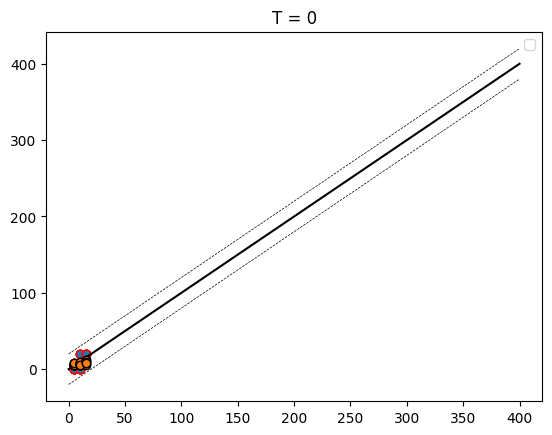

In [29]:
fig, ax = plt.subplots()
from matplotlib import animation
# t = np.linspace(0, 3, 40)
# g = -9.81
# v0 = 12
# z = g * t**2 / 2 + v0 * t

# v02 = 5
# z2 = g * t**2 / 2 + v02 * t
j = 0
gt_kps = []
enc_kps = []
lr_kps = []
diff_kps = []
diff_kps_std = []

gt_mps = []
enc_mps = []
diff_mps = []
diff_mpstd = []

lr_mps = []
kp_powers =[]
kp_velocities = []
mp_powers =[]
mp_velocities = []
for key in lr_results.keys():
    # print(key, gt_results.keys())
    if 'depth' in key:
        parameters = key.split('depth_power')[-1].split('vel')
        mp_powers.append(float(parameters[0]))
        mp_velocities.append(float(parameters[1]))
        gt_mp = gt_results[key][j]
        
        diff_mp_mean = np.mean([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])
        diff_mp_std = np.std([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])

        enc_mp  = enc_results[key][j]
        lr_mp =  lr_results[key][j]
        lr_mps.append(lr_mp)
        gt_mps.append(gt_mp)
        enc_mps.append(enc_mp)
        diff_mps.append(diff_mp_mean)
        diff_mpstd.append(diff_mp_std)

        
    if 'key' in key:
        parameters = key.split('key_power')[-1].split('vel')
        kp_powers.append(float(parameters[0]))
        kp_velocities.append(float(parameters[1]))
        # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
        # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
        # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
        # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
        
        gt_kp = gt_results[key][j]
        diff_kp = diff_results[key][j]
        enc_kp  = enc_results[key][j]
        lr_kp =  lr_results[key][j]
        diff_kp_mean = np.mean([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])
        diff_kp_std = np.std([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])

        lr_kps.append(lr_kp)
        gt_kps.append(gt_kp)
        enc_kps.append(enc_kp)
        # diff_kps.append(diff_kp)
        diff_kps_std.append(diff_kp_std)
        diff_kps.append(diff_kp_mean)

line, ( bottoms, tops), verts  = ax.errorbar(gt_kps, diff_kps, yerr=diff_kps_std, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1])
verts[0].remove()
scat = ax.scatter(gt_kps, lr_kps, c= cs[0], edgecolor = 'r')
ax.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
ax.plot([0, 400], [0, 400], 'k')
ax.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
ax.set_title('T = {}'.format(j))
# plt.show()
# scat = ax.scatter(t[0], z[0], c="b", s=5, label=f'v0 = {v0} m/s')
# line2 = ax.plot(t[0], z2[0], label=f'v0 = {v02} m/s')[0]
# ax.set(xlim=[0, 3], ylim=[-4, 10], xlabel='Time [s]', ylabel='Z [m]')
ax.legend()


def update(frame):
    j = frame
    # for each frame, update the data stored on each artist.
    

    gt_kps = []
    enc_kps = []
    lr_kps = []
    diff_kps = []
    diff_kps_std = []

    gt_mps = []
    enc_mps = []
    diff_mps = []
    diff_mpstd = []

    lr_mps = []
    kp_powers =[]
    kp_velocities = []
    mp_powers =[]
    mp_velocities = []
    for key in lr_results.keys():
        # print(key, gt_results.keys())
        if 'depth' in key:
            parameters = key.split('depth_power')[-1].split('vel')
            mp_powers.append(float(parameters[0]))
            mp_velocities.append(float(parameters[1]))
            gt_mp = gt_results[key][j]
            
            diff_mp_mean = np.mean([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])
            diff_mp_std = np.std([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])

            enc_mp  = enc_results[key][j]
            lr_mp =  lr_results[key][j]
            lr_mps.append(lr_mp)
            gt_mps.append(gt_mp)
            enc_mps.append(enc_mp)
            diff_mps.append(diff_mp_mean)
            diff_mpstd.append(diff_mp_std)

            
        if 'key' in key:
            parameters = key.split('key_power')[-1].split('vel')
            kp_powers.append(float(parameters[0]))
            kp_velocities.append(float(parameters[1]))
            # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
            # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
            # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
            # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
            
            gt_kp = gt_results[key][j]
            diff_kp = diff_results[key][j]
            enc_kp  = enc_results[key][j]
            lr_kp =  lr_results[key][j]
            diff_kp_mean = np.mean([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])
            diff_kp_std = np.std([diff_results_global[trial_key][key][j] for trial_key in range(len(diff_results_global.keys()))])

            lr_kps.append(lr_kp)
            gt_kps.append(gt_kp)
            enc_kps.append(enc_kp)
            # diff_kps.append(diff_kp)
            diff_kps_std.append(diff_kp_std)
            diff_kps.append(diff_kp_mean)

    # scat = ax.scatter(gt_kps, lr_kps, c= cs[0], edgecolor = 'r')


    # x = t[:frame]
    # y = z[:frame]
    # update the scatter plot:
    data = np.stack([gt_kps, lr_kps]).T
    scat.set_offsets(data)
    line.set_xdata(gt_kps)
    line.set_ydata(diff_kps)  # update the data
    bottoms.set_ydata(diff_kps - diff_kps_std)
    tops.set_ydata(diff_kps + diff_kps_std)
    # update the line plot:
    # line2.set_xdata(t[:frame])
    # line2.set_ydata(z2[:frame])
    return (scat, (line, bottoms, tops))#, line2)


ani = animation.FuncAnimation(fig=fig, func=update, frames=40, interval=1)

plt.show()

In [32]:
ani.save("custom_plot_animation.gif", writer="pillow", fps=10)


IndexError: list index out of range

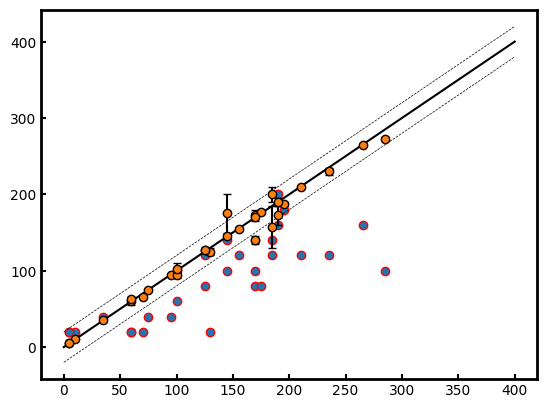

In [38]:
# mp_powers
# mp_velocities
# lr_results.keys()
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']
cs = [color for color in colors[:3]]

plt.scatter(gt_kps, lr_kps, c= cs[0], edgecolor = 'r')
# plt.errorbar(gt_mps, diff_mps, yerr = diff_mp_std, c= cs[1], edgecolor = 'r')
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.errorbar(gt_kps, diff_kps, yerr=diff_kps_std, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1])

# plt.scatter(test_gt_mps, test_lr_mps, c = cs[0], marker = 's', edgecolor = 'k')
# plt.errorbar(test_gt_mps, test_diff_mps, yerr = diff_mp_std, c = cs[1], marker = 's', edgecolor = 'k')
# plt.scatter(test_gt_mps, test_enc_mps, c = cs[2], marker = 's')
plt.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
plt.plot([0, 400], [0, 400], 'k')
plt.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
frame_tick()



In [39]:
len(diff_kps_std)

60

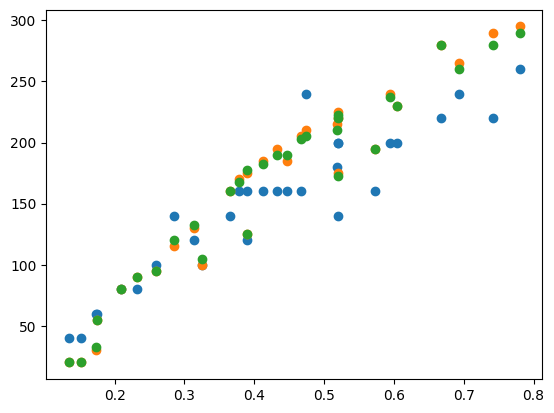

In [84]:
# plt.scatter(test_gt_mps, test_lr_mps, c = cs[0], marker = 's', edgecolor = 'k')
plt.scatter(np.array(mp_powers)/np.array(mp_velocities), lr_mps)
plt.scatter(np.array(mp_powers)/np.array(mp_velocities), gt_mps)
plt.scatter(np.array(mp_powers)/np.array(mp_velocities), diff_mps)


# len(kp_powers)
# kp_powers
# plt.scatter(test_gt_mps, test_diff_mps, c = cs[1], marker = 's', edgecolor = 'k')

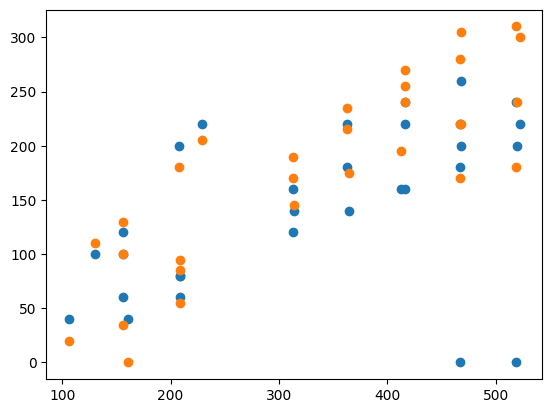

In [ ]:
plt.scatter(np.array(mp_powers), lr_mps)
plt.scatter(np.array(mp_powers), gt_mps)

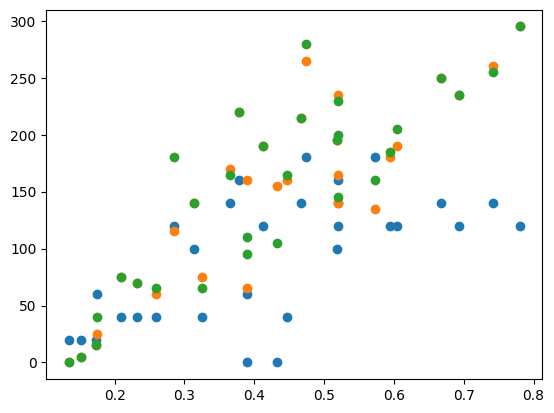

In [ ]:
plt.scatter(np.array(kp_powers)/np.array(kp_velocities), lr_kps)
plt.scatter(np.array(kp_powers)/np.array(kp_velocities), gt_kps)
plt.scatter(np.array(kp_powers)/np.array(kp_velocities), diff_kps)

NameError: name 'test_gt_kps' is not defined

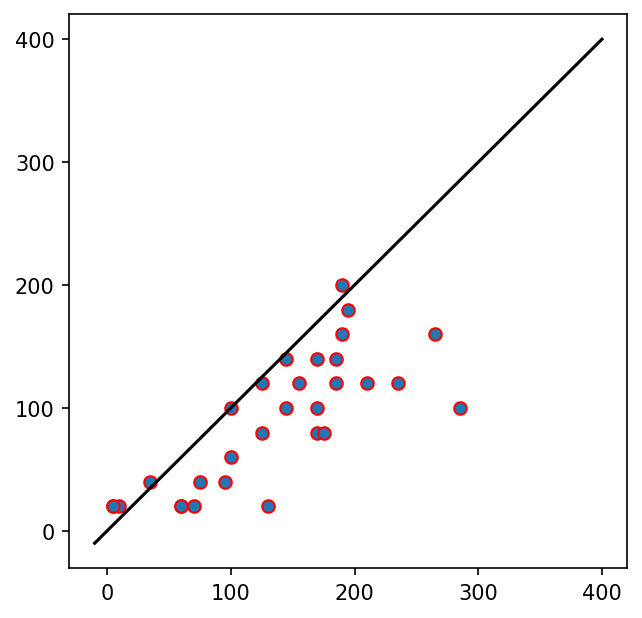

In [42]:
# plt.scatter(gt_mps, lr_kps)
# plt.scatter(gt_mps, diff_kps)
# plt.scatter(gt_mps, enc_kps)
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.plot([-10, 400], [-10, 400], 'k')

plt.scatter(gt_kps, lr_kps, c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(test_gt_kps, test_lr_kps, c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.errorbar(gt_kps, diff_kps, yerr=diff_kps_std, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1], label = r'Diffusion (Train)')
# plt.scatter(gt_kps, diff_kps, c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
plt.scatter(test_gt_kps, test_diff_kps, c = cs[1], marker = 's', edgecolor = 'k', label = 'Diffusion (Test)')
# plt.errorbar(test_gt_kps, test_diff_kps, yerr=test_diff_kps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1], label = r'Diffusion (Test)')

plt.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
plt.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
plt.xlim([-5, 400])
plt.ylim([-5, 400])
frame_tick()
plt.xlabel(r'High Fidelity Keyhole Depth [$\mu m$]')
plt.ylabel(r'Estimated Keyhole Depth [$\mu m$]')
legend()


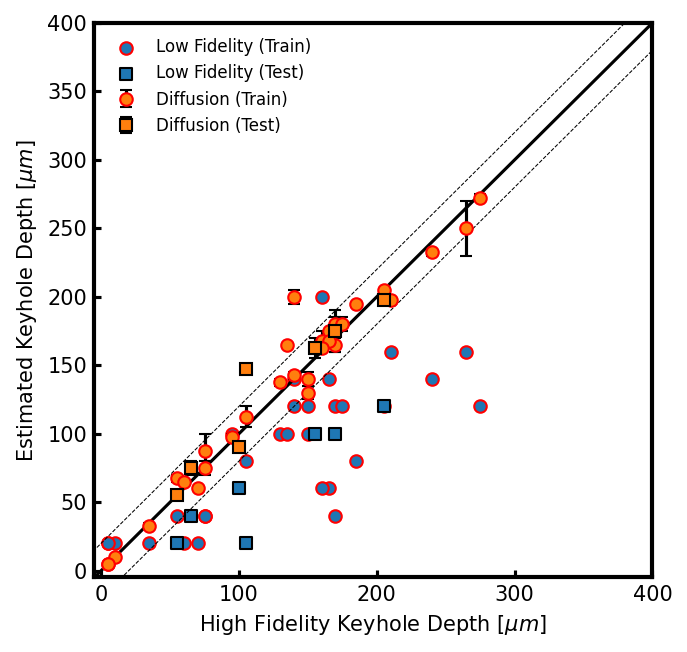

In [81]:
# plt.scatter(gt_mps, lr_kps)
# plt.scatter(gt_mps, diff_kps)
# plt.scatter(gt_mps, enc_kps)
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.plot([-10, 400], [-10, 400], 'k')

plt.scatter(gt_kps, lr_kps, c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(test_gt_kps, test_lr_kps, c= cs[0], edgecolor = 'k', marker = 's', label = r'Low Fidelity (Test)')

# plt.scatter(test_gt_kps, test_lr_kps, c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.errorbar(gt_kps, diff_kps, yerr=diff_kps_std, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1], label = r'Diffusion (Train)')
# plt.scatter(test_gt_kps, test_diff_kps, c = cs[1], marker = 's', edgecolor = 'k', label = 'Diffusion (Test)')
# plt.scatter(gt_kps, diff_kps, c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
plt.errorbar(test_gt_kps, test_diff_kps, yerr=test_diff_kps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1], label = r'Diffusion (Test)')
# plt.errorbar(dev_gt_kps, dev_diff_kps, yerr=dev_diff_kps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1], label = r'Diffusion (Test)')

# plt.plot([0, 400], [-20, 380], 'k--', linewidth = 0.5)
# plt.plot([0, 400], [20, 420], 'k--', linewidth = 0.5)
plt.plot([0-100, 400], [-20-100, 380], 'k--', linewidth = 0.5)
plt.plot([0-100, 400], [20-100, 420], 'k--', linewidth = 0.5)
plt.xlim([-5, 400])
plt.ylim([-5, 400])
frame_tick()
plt.xlabel(r'High Fidelity Keyhole Depth [$\mu m$]')
plt.ylabel(r'Estimated Keyhole Depth [$\mu m$]')
legend()


In [82]:
powers

NameError: name 'powers' is not defined

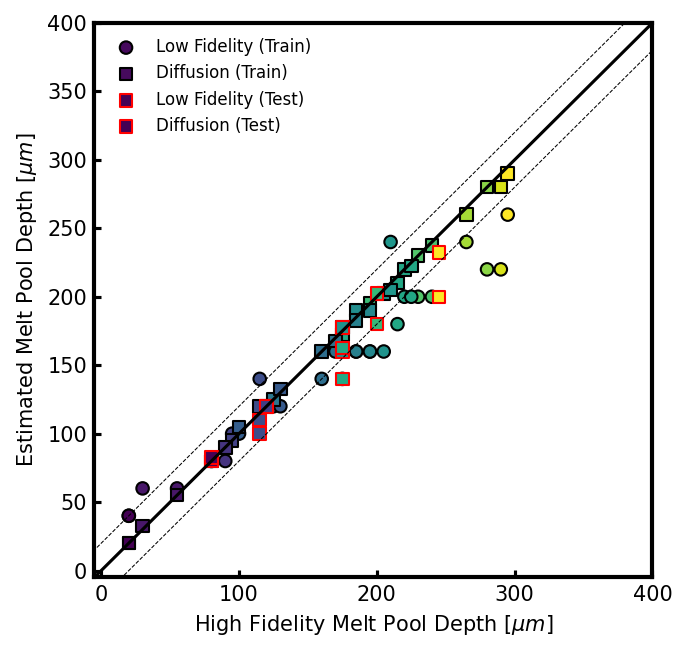

In [106]:
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.plot([-10, 400], [-10, 400], 'k')
# c= cs[0]
plt.scatter(gt_mps, lr_mps,  edgecolor = 'k', label = r'Low Fidelity (Train)', c = np.array(mp_powers)/np.array(mp_velocities))
# plt.errorbar(gt_mps, diff_mps, yerr=diff_mpstd, fmt=",", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[0])
plt.scatter(gt_mps, diff_mps,  edgecolor = 'k', label = r'Diffusion (Train)', marker = 's', c = np.array(mp_powers)/np.array(mp_velocities))

plt.scatter(test_gt_mps, test_lr_mps,  c = np.array(test_mp_powers)/np.array(test_mp_velocities), marker = 's', edgecolor = 'r', label = r'Low Fidelity (Test)')
# plt.scatter(gt_mps, enc_mps, c= cs[2])

plt.scatter(test_gt_mps, test_diff_mps,  edgecolor = 'r', label = r'Diffusion (Test)', marker = 's', c =  np.array(test_mp_powers)/np.array(test_mp_velocities))
# plt.errorbar(gt_mps, diff_mps, yerr=diff_mpstd, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1], label = r'Diffusion (Train)')
# plt.errorbar(test_gt_mps, test_diff_mps, yerr=test_diff_mps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = np.array(test_mp_powers)/np.array(test_mp_velocities), label = r'Diffusion (Test)')

# plt.scatter(gt_mps, diff_mps, c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
# plt.scatter(test_gt_mps, test_diff_mps, c = cs[1], marker = 's', edgecolor = 'k', label = 'Diffusion (Test)')
plt.plot([0-100, 400], [-20-100, 380], 'k--', linewidth = 0.5)
plt.plot([0-100, 400], [20-100, 420], 'k--', linewidth = 0.5)
plt.xlim([-5, 400])
plt.ylim([-5, 400])
frame_tick()
plt.xlabel(r'High Fidelity Melt Pool Depth [$\mu m$]')
plt.ylabel(r'Estimated Melt Pool Depth [$\mu m$]')
legend()


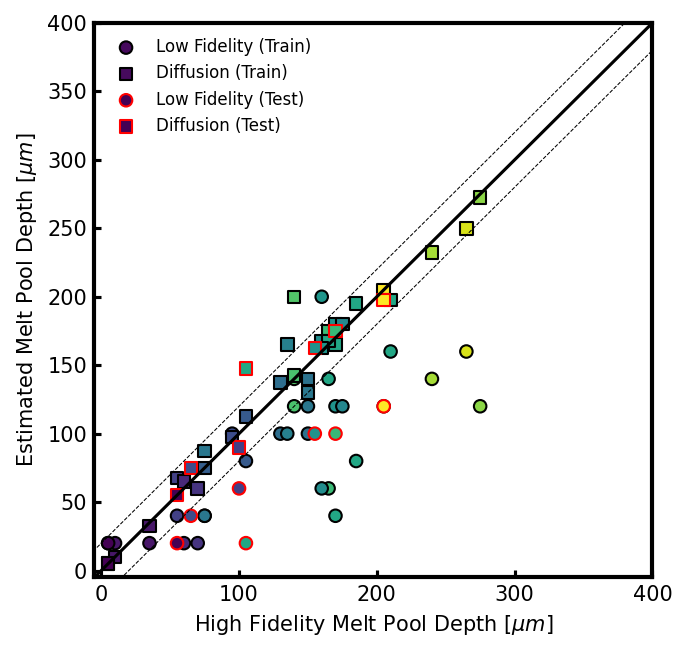

In [108]:
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.plot([-10, 400], [-10, 400], 'k')
# c= cs[0]
plt.scatter(gt_kps, lr_kps,  edgecolor = 'k', label = r'Low Fidelity (Train)', c = np.array(kp_powers)/np.array(kp_velocities))
# plt.errorbar(gt_mps, diff_mps, yerr=diff_mpstd, fmt=",", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[0])
plt.scatter(gt_kps, diff_kps,  edgecolor = 'k', label = r'Diffusion (Train)', marker = 's', c = np.array(kp_powers)/np.array(kp_velocities))

plt.scatter(test_gt_kps, test_lr_kps,  c = np.array(test_kp_powers)/np.array(test_kp_velocities), marker = 'o', edgecolor = 'r', label = r'Low Fidelity (Test)')
# plt.scatter(gt_mps, enc_mps, c= cs[2])

plt.scatter(test_gt_kps, test_diff_kps,  edgecolor = 'r', label = r'Diffusion (Test)', marker = 's', c =  np.array(test_kp_powers)/np.array(test_kp_velocities))
# plt.errorbar(gt_mps, diff_mps, yerr=diff_mpstd, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1], label = r'Diffusion (Train)')
# plt.errorbar(test_gt_mps, test_diff_mps, yerr=test_diff_mps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = np.array(test_mp_powers)/np.array(test_mp_velocities), label = r'Diffusion (Test)')

# plt.scatter(gt_mps, diff_mps, c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
# plt.scatter(test_gt_mps, test_diff_mps, c = cs[1], marker = 's', edgecolor = 'k', label = 'Diffusion (Test)')
plt.plot([0-100, 400], [-20-100, 380], 'k--', linewidth = 0.5)
plt.plot([0-100, 400], [20-100, 420], 'k--', linewidth = 0.5)
plt.xlim([-5, 400])
plt.ylim([-5, 400])
frame_tick()
plt.xlabel(r'High Fidelity Melt Pool Depth [$\mu m$]')
plt.ylabel(r'Estimated Melt Pool Depth [$\mu m$]')
legend()


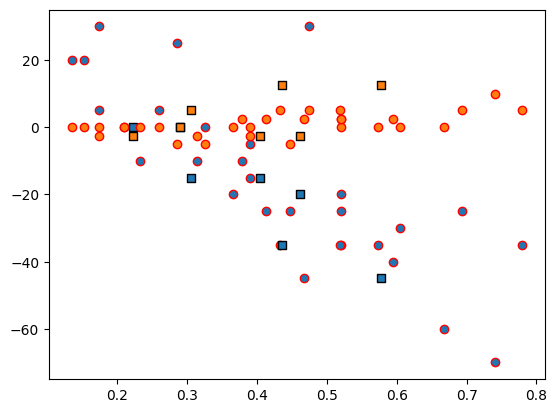

In [112]:
plt.scatter(np.array(mp_powers)/np.array(mp_velocities), np.array(lr_mps) - np.array(gt_mps) , c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(np.array(test_mp_powers)/np.array(test_mp_velocities), np.array(test_lr_mps) - np.array(test_gt_mps), c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

plt.scatter(np.array(mp_powers)/np.array(mp_velocities), np.array(gt_mps) - np.array(diff_mps) , c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
plt.scatter(np.array(test_mp_powers)/np.array(test_mp_velocities), np.array(test_gt_mps) - np.array(test_diff_mps), c = cs[1], marker = 's', edgecolor = 'k', label = r'Diffusion (Test)')
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])

# plt.scatter(gt_mps, diff_mps, c= cs[1], edgecolor = 'r', label = r'Diffusion Model (Train)')
# plt.scatter(test_gt_mps, test_diff_mps, c = cs[1], marker = 's', edgecolor = 'k', label = 'Diffusion Model (Test)')

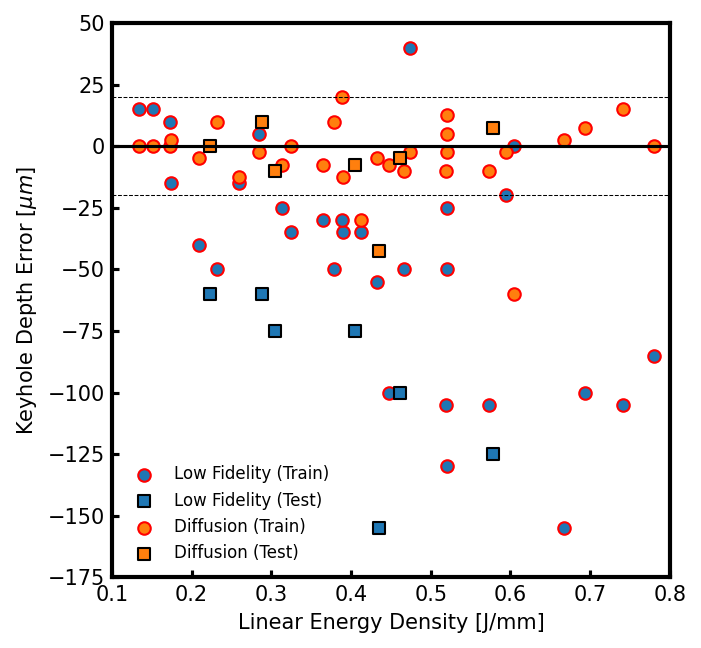

In [141]:
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.scatter(np.array(kp_powers)/np.array(kp_velocities), np.array(lr_kps) - np.array(gt_kps) , c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(np.array(test_kp_powers)/np.array(test_kp_velocities), np.array(test_lr_kps) - np.array(test_gt_mps), c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

plt.scatter(np.array(kp_powers)/np.array(kp_velocities), np.array(gt_kps) - np.array(diff_kps) , c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
plt.scatter(np.array(test_kp_powers)/np.array(test_kp_velocities), np.array(test_gt_kps) - np.array(test_diff_kps), c = cs[1], marker = 's', edgecolor = 'k', label = r'Diffusion (Test)')
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.xlim([0.1, 0.8])
plt.ylim([-175, 50])
plt.axhline(0, c = 'k')
plt.axhline(-20,  c= 'k', linestyle = '--', linewidth = 0.5)
plt.axhline(20, c = 'k', linestyle = '--', linewidth = 0.5)
legend()
plt.xlabel('Linear Energy Density [J/mm]')
plt.ylabel(r'Keyhole Depth Error [$\mu m$]')
frame_tick()
plt.show()
# plt.scatter(gt_mps, diff_mps, c= cs[1], edgecolor = 'r', label = r'Diffusion Model (Train)')
# plt.scatter(test_gt_mps, test_diff_mps, c = cs[1], marker = 's', edgecolor = 'k', label = 'Diffusion Model (Test)')

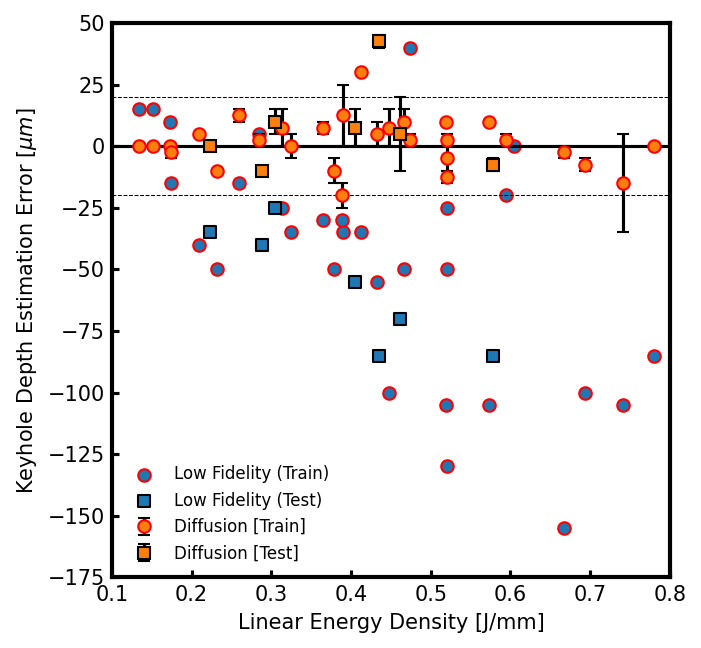

In [140]:
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.scatter(np.array(kp_powers)/np.array(kp_velocities), np.array(lr_kps) - np.array(gt_kps) , c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(np.array(test_kp_powers)/np.array(test_kp_velocities), np.array(test_lr_kps) - np.array(test_gt_kps), c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

# plt.scatter(np.array(kp_powers)/np.array(kp_velocities), np.array(diff_kps) - np.array(gt_kps) , c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
# plt.scatter(np.array(test_kp_powers)/np.array(test_kp_velocities), np.array(test_diff_kps) - np.array(test_gt_kps), c = cs[1], marker = 's', edgecolor = 'k', label = r'Diffusion (Test)')
plt.errorbar(np.array(kp_powers)/np.array(kp_velocities), np.array(diff_kps) - np.array(gt_kps), yerr=diff_kps_std, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1], label = 'Diffusion [Train]')
plt.errorbar(np.array(test_kp_powers)/np.array(test_kp_velocities),  np.array(test_diff_kps) - np.array(test_gt_kps), yerr=test_diff_kps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1], label = 'Diffusion [Test]')
# plt.errorbar(test_gt_kps, test_diff_kps, yerr=test_diff_kps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1])
# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.xlim([0.1, 0.8])
plt.ylim([-175, 50])
plt.axhline(0, c = 'k')
plt.axhline(-20,  c= 'k', linestyle = '--', linewidth = 0.5)
plt.axhline(20, c = 'k', linestyle = '--', linewidth = 0.5)
legend()
plt.xlabel('Linear Energy Density [J/mm]')
plt.ylabel(r'Keyhole Depth Estimation Error [$\mu m$]')
frame_tick()
plt.show()

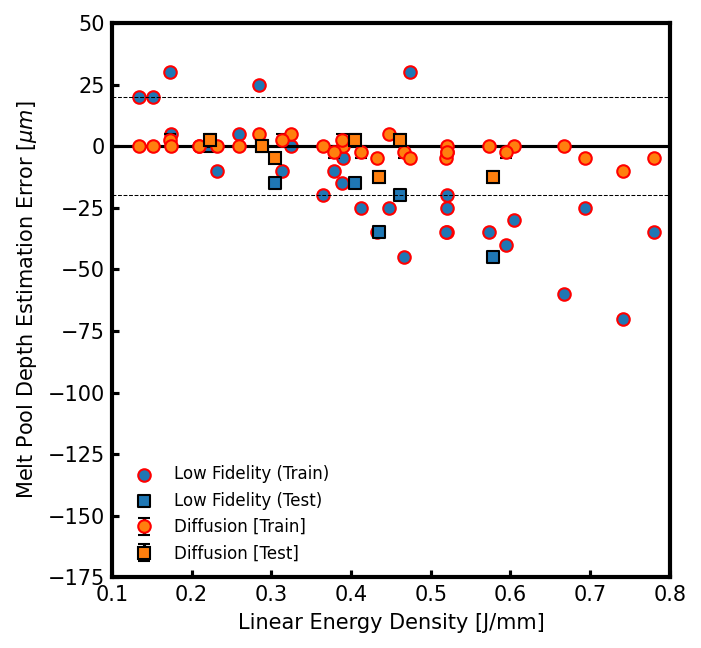

In [142]:
plt.figure(dpi = 150, figsize = np.array([4,4])*1.2)
plt.scatter(np.array(mp_powers)/np.array(mp_velocities), np.array(lr_mps) - np.array(gt_mps) , c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(np.array(test_mp_powers)/np.array(test_mp_velocities), np.array(test_lr_mps) - np.array(test_gt_mps), c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

# plt.scatter(np.array(mp_powers)/np.array(mp_velocities), np.array(diff_mps) - np.array(gt_mps) , c= cs[1], edgecolor = 'r', label = r'Diffusion (Train)')
# plt.scatter(np.array(test_mp_powers)/np.array(test_mp_velocities), np.array(test_diff_mps) - np.array(test_gt_mps), c = cs[1], marker = 's', edgecolor = 'k', label = r'Diffusion (Test)')
plt.errorbar(np.array(mp_powers)/np.array(mp_velocities), np.array(diff_mps) - np.array(gt_mps), yerr=diff_mpstd, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'r', c = cs[1], label = 'Diffusion [Train]')
plt.errorbar(np.array(test_mp_powers)/np.array(test_mp_velocities),  np.array(test_diff_mps) - np.array(test_gt_mps), yerr=test_diff_mps_std, fmt="s", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k', c = cs[1], label = 'Diffusion [Test]')

# plt.scatter(gt_mps, ÷enc_mps, c= cs[2])
plt.xlim([0.1, 0.8])
plt.ylim([-175, 50])
plt.axhline(0, c = 'k')
plt.axhline(-20,  c= 'k', linestyle = '--', linewidth = 0.5)
plt.axhline(20, c = 'k', linestyle = '--', linewidth = 0.5)
legend()
plt.xlabel('Linear Energy Density [J/mm]')
plt.ylabel(r'Melt Pool Depth Estimation Error [$\mu m$]')
frame_tick()
plt.show()

In [ ]:
plt.scatter(np.array(test_kp_powers)/np.array(test_kp_velocities), np.array(lr_mps) - np.array(gt_mps) , c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(np.array(test_kp_powers)/np.array(test_kp_velocities), np.array(test_lr_mps) - np.array(test_gt_mps), c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

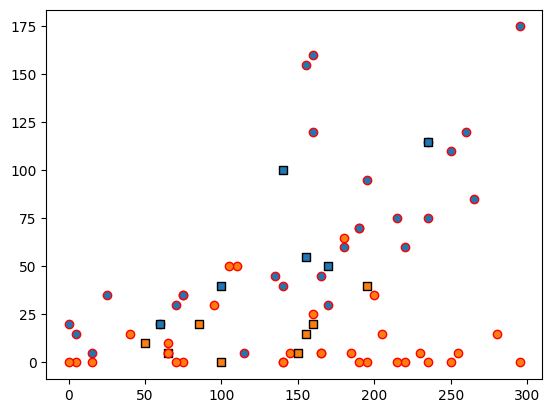

In [ ]:
plt.scatter(gt_kps, np.abs(np.array(lr_kps) - np.array(gt_kps)) , c= cs[0], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(test_gt_kps, np.abs(np.array(test_lr_kps) - np.array(test_gt_kps)), c = cs[0], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

plt.scatter(diff_kps, np.abs(np.array(gt_kps) - np.array(diff_kps)) , c= cs[1], edgecolor = 'r', label = r'Low Fidelity (Train)')
plt.scatter(test_diff_kps, np.abs(np.array(test_gt_kps) - np.array(test_diff_kps)), c = cs[1], marker = 's', edgecolor = 'k', label = r'Low Fidelity (Test)')

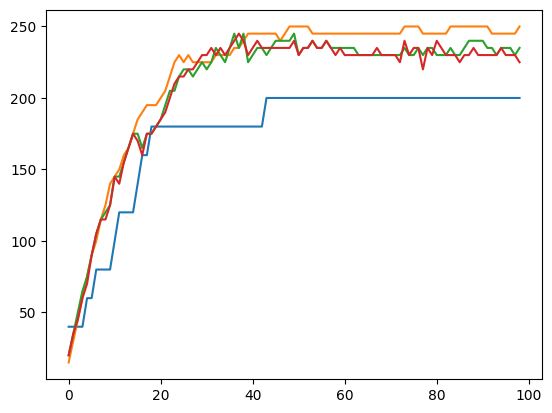

In [ ]:
key = 'depth_power520.0vel900.0'
plt.plot(lr_results[key])
plt.plot(gt_results[key])
plt.plot(enc_results[key])
plt.plot(diff_results[key])



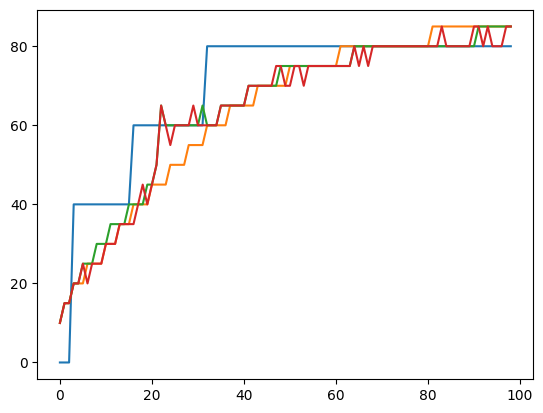

In [ ]:
plt.plot(lr_results['depth_power156.0vel700.0'])
plt.plot(gt_results['depth_power156.0vel700.0'])
plt.plot(enc_results['depth_power156.0vel700.0'])
plt.plot(diff_results['depth_power156.0vel700.0'])


In [ ]:
np.fft.fftfreq(np.array(signal).size, d = time_signal[1] - time_signal[0])

key_power156.0vel700.0


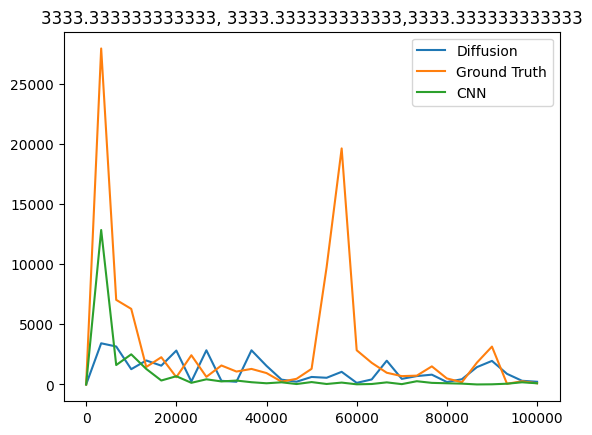

key_power183.0vel600.0


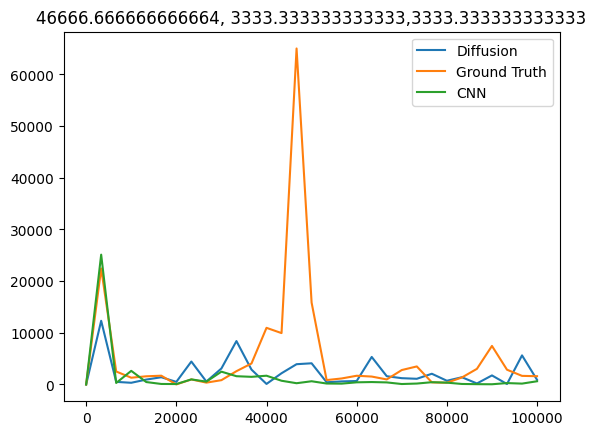

key_power260.0vel900.0


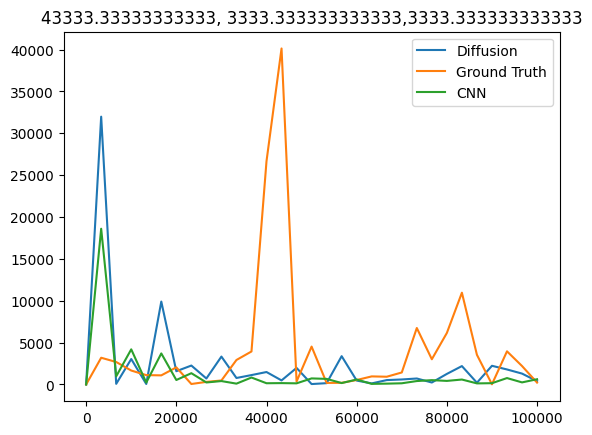

key_power261.0vel600.0


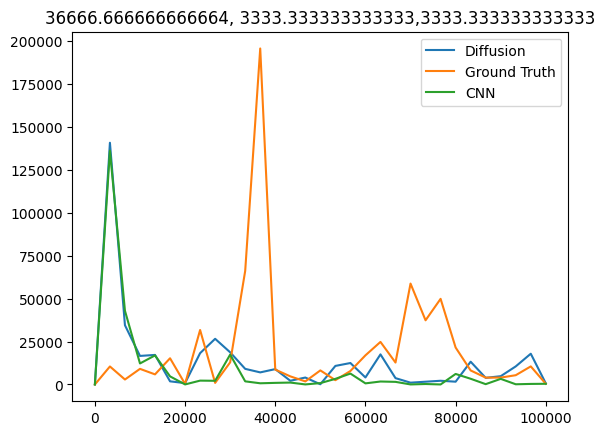

key_power364.0vel900.0


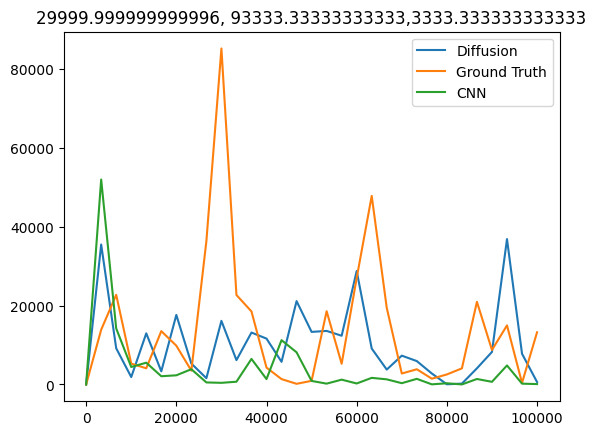

key_power415.0vel900.0


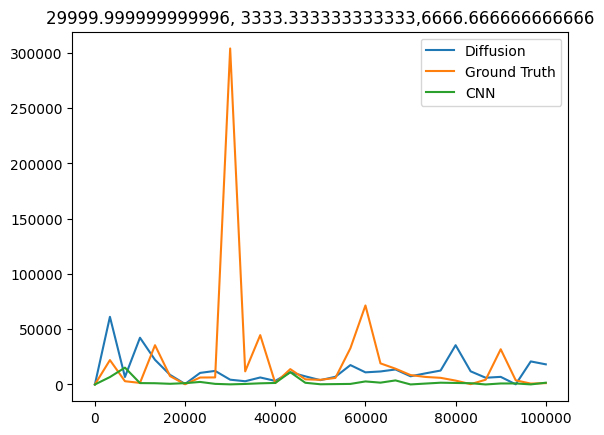

key_power520.0vel900.0


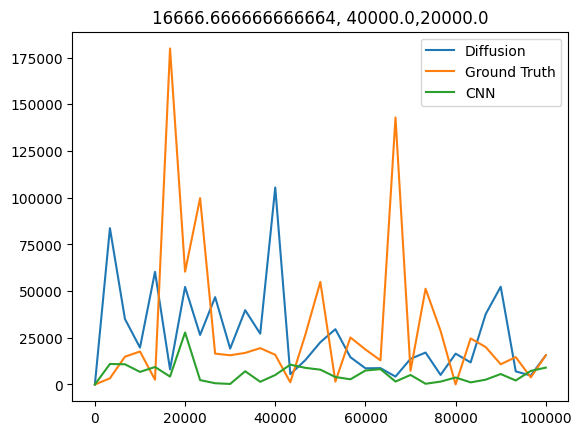

In [ ]:
def calc_fft_freq(signal, timestep = 5e-6):
    fft = np.fft.rfft(signal - np.mean(signal))
    power_spectrum = np.abs(fft)**2
    time_signal = np.arange(len(signal))*timestep
    freq = np.fft.rfftfreq(np.array(signal).size, d = time_signal[1] - time_signal[0])
    dominant_frequency = freq[np.argmax(power_spectrum)]
    return dominant_frequency, freq, power_spectrum
for key in diff_results.keys():
    if 'key' in key:
        print(key)



        gt_dominant_frequency, gt_freq, gt_power_spectrum = calc_fft_freq(gt_results[key][30:90])
        diff_dominant_frequency, diff_freq, diff_power_spectrum = calc_fft_freq(diff_results[key][30:90])
        enc_dominant_frequency, enc_freq, enc_power_spectrum = calc_fft_freq(enc_results[key][30:90])

        # plt.plot(gt_results[key][30:80])
        # plt.plot(diff_results[key][30:80])
        # plt.plot(enc_results[key][30:80])
        # plt.show()
        plt.title('{}, {},{}'.format(gt_dominant_frequency,diff_dominant_frequency, enc_dominant_frequency ))
        gt_amp = np.sqrt(np.mean((gt_results[key][30:80] - np.mean(gt_results[key][30:80]))**2))
        diff_amp = np.sqrt(np.mean((diff_results[key][30:80] - np.mean(diff_results[key][30:80]))**2))

        # plt.title('{}, {}'.format(np.sqrt(np.mean(gt_results[key][30:80])),np.sqrt(np.mean(diff_results[key][30:80])) ))
        # plt.title('{},{}'.format(gt_amp,diff_amp))
        plt.plot(diff_freq, diff_power_spectrum, label = "Diffusion")
        
        plt.plot(gt_freq, gt_power_spectrum, label = "Ground Truth")
        plt.plot(enc_freq, enc_power_spectrum, label = 'CNN')
        plt.legend()
        # plt.show()

        # plt.title(diff_freq[np.argmax(diff_power_spectrum)])

        plt.show()


In [ ]:
diff_results_global[trial_key].keys()

dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])

In [ ]:
parameters = list(diff_results_global[trial_key].keys())[0].split('key_power')[-1].split('vel')

['156.0', '700.0']

In [ ]:

diff_amps_global = []
for trial_key in diff_results_global.keys():
    diff_results = diff_results_global[trial_key]
    enc_amps = []
    gt_amps = []
    diff_amps = []
    powers = []
    velocities = []
    for key in diff_results_global[trial_key].keys():
        print(key, gt_results.keys())
    
        if 'key' in key:
            # plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)
            # plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
            # plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
            # plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
            gt_amp = np.sqrt(np.mean((gt_results[key][30:80] - np.mean(gt_results[key][30:80]))**2))
            diff_amp = np.sqrt(np.mean((diff_results[key][30:80] - np.mean(diff_results[key][30:80]))**2))
            enc_amp  = np.sqrt(np.mean((enc_results[key][30:80] - np.mean(enc_results[key][30:80]))**2))
            gt_amps.append(gt_amp)
            enc_amps.append(enc_amp)
            diff_amps.append(diff_amp)
            print(len(diff_amps))
            parameters = key.split('key_power')[-1].split('vel')
            powers.append(float(parameters[0]))
            velocities.append(float(parameters[1]))
            # frame_tick()
            # legend()
            # plt.xlim([0, 500])
            # plt.ylim([0, 250])
            # plt.xlabel(r'Time [$\mu s$]')
            # plt.ylabel(r'Keyhole Depth [$\mu m$]')

            # plt.show()
        # if 'depth' in key:
        #     plt.figure(dpi = 150, figsize = np.array([4,3])*1.3)

        #     plt.plot(np.arange(len(diff_results[key]))*5, diff_results[key], '--')
        #     plt.plot(np.arange(len(diff_results[key]))*5, gt_results[key], 'k-')
        #     plt.plot(np.arange(len(diff_results[key]))*5, enc_results[key], '--')
        #     plt.ylim([0, 300])
        #     frame_tick()
        #     plt.xlabel(r'Time [$\mu s$]')
        #     plt.ylabel(r'Melt Pool Depth [$\mu m$]')

        #     legend()
        #     plt.show()
    diff_amps_global.append(diff_amps)


key_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
1
depth_power156.0vel700.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'depth_power260.0vel900.0', 'key_power261.0vel600.0', 'depth_power261.0vel600.0', 'key_power364.0vel900.0', 'depth_power364.0vel900.0', 'key_power415.0vel900.0', 'depth_power415.0vel900.0', 'key_power520.0vel900.0', 'depth_power520.0vel900.0'])
key_power183.0vel600.0 dict_keys(['key_power156.0vel700.0', 'depth_power156.0vel700.0', 'key_power183.0vel600.0', 'depth_power183.0vel600.0', 'key_power260.0vel900.0', 'd

In [ ]:
powers

['156.0', '183.0', '260.0', '261.0', '364.0', '415.0', '520.0']

In [ ]:
mean_diff = np.array(diff_amps_global).mean(axis = 0)
std_diff =  np.array(diff_amps_global).std(axis = 0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


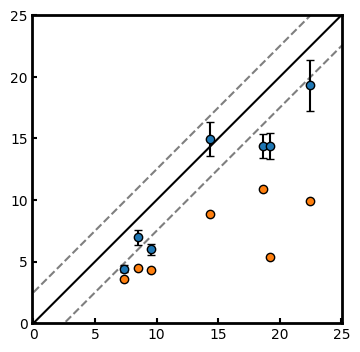

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


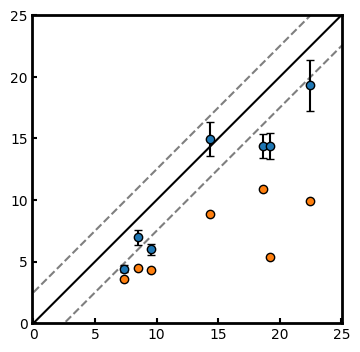

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


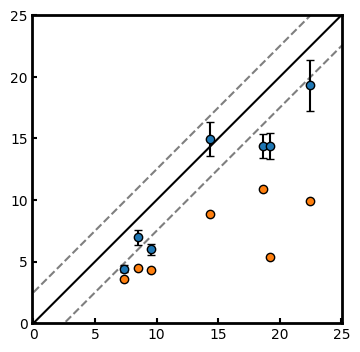

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


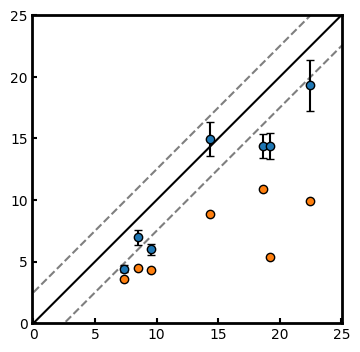

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


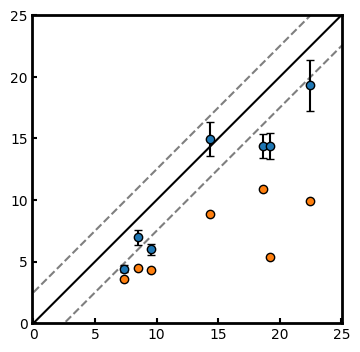

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


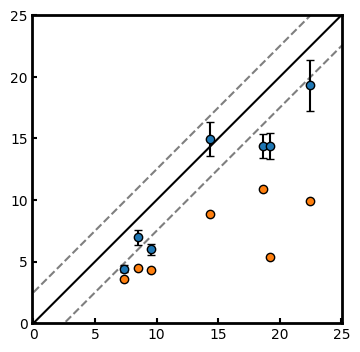

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


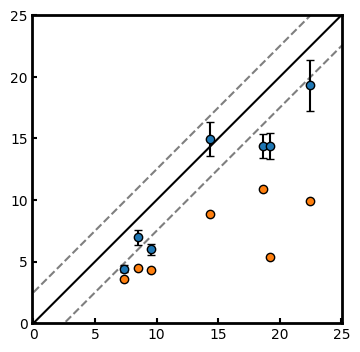

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


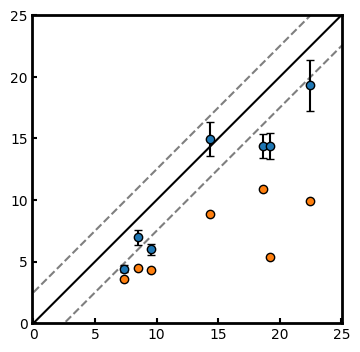

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


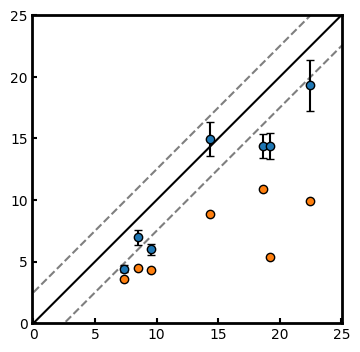

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


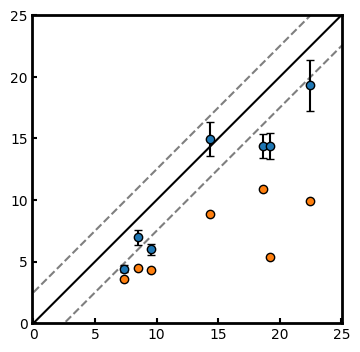

In [ ]:
for diff_amps in diff_amps_global:
    plt.figure(figsize = [4,4])
    plt.errorbar(gt_amps, mean_diff, yerr=std_diff, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
    # plt.scatter(gt_amps, mean_diff, edgecolor = 'k' , s = 80)
    plt.plot(gt_amps, enc_amps,'o', markeredgecolor = 'k')

    plt.plot([0, 30], [0, 30], 'k-')
    # plt.plot([0, 30], [-5, 30-5], 'k--', alpha= 0.5)
    plt.plot([0, 30], [2.5, 30+2.5], 'k--', alpha= 0.5)
    plt.plot([0, 30], [-2.5, 30-2.5], 'k--', alpha= 0.5)
    plt.xlabel('')


    plt.axis('equal')
    plt.xlim([0,25])
    plt.ylim([0,25])
    frame_tick()
    legend()
    plt.show()

In [ ]:
for trial_key in diff_results_global.keys():
    print(len(diff_results_global[trial_key]))

14
14
14
14
14


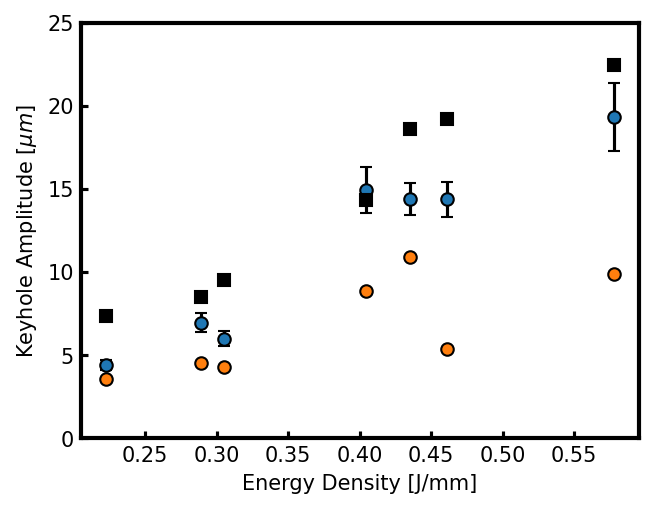

In [ ]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.2)
plt.ylim([0,25])
# plt.grid()
diff_p = np.poly1d()
plt.errorbar(np.array(powers)/np.array(velocities), mean_diff, yerr=std_diff, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.errorbar(np.array(powers)/np.array(velocities), enc_amps, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.errorbar(np.array(powers)/np.array(velocities), gt_amps, fmt="ks", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.xlabel('Energy Density [J/mm]')
plt.ylabel('Keyhole Amplitude $[\mu m]$')

frame_tick()


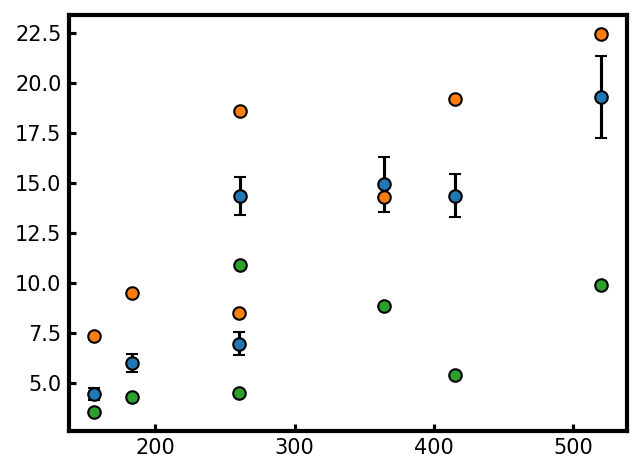

In [ ]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.2)
plt.errorbar(np.array(powers), mean_diff, yerr=std_diff, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.errorbar(np.array(powers), gt_amps, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.errorbar(np.array(powers), enc_amps, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
frame_tick()


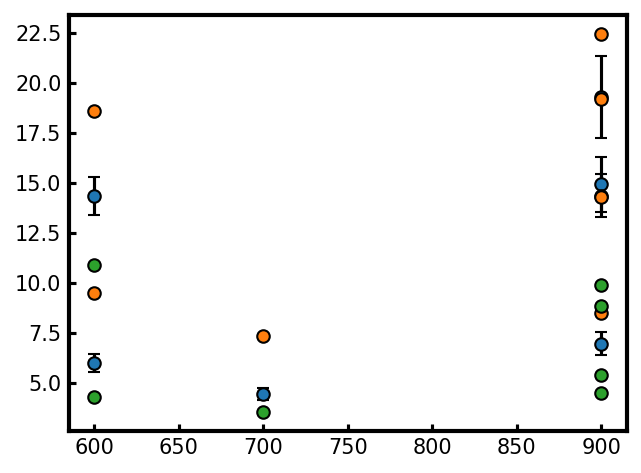

In [ ]:
plt.figure(dpi = 150, figsize = np.array([4,3])*1.2)
plt.errorbar(np.array(velocities), mean_diff, yerr=std_diff, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.errorbar(np.array(velocities), gt_amps, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
plt.errorbar(np.array(velocities), enc_amps, fmt="o", capsize = 3, ecolor = 'k' ,markeredgecolor = 'k')
frame_tick()
